In [1]:
# clear everything for a fresh run
%reset -f 
%whos

Interactive namespace is empty.


In [3]:
#only run this cell once in anaconda command line to enable use of uobrainflex python environment for this jupyter notebook
# -*- coding: utf-8 -*-
"""
Created on Mon Feb 21 12:19:27 2022
@author: Evan Vickers
this notebook loads and preprocesses mesoscope data within the uobrainflex environment
https://github.com/sjara/uobrainflex/INSTALL.md
"""

python -m ipykernel install --user --name=uobrainflex

SyntaxError: invalid syntax (<ipython-input-3-0a5d6dfc4f7c>, line 9)

In [1]:
#load npy files
import numpy as np

#Unpack dictionary into individual variables with same individual names as in previous session
from operator import itemgetter

def getList(dict):
    list = []
    for key in dict.keys():
        list.append(key)
          
    return list

npy_dict_name=input("Enter full path and filename of .npy file to load")
npy_dict=np.load(npy_dict_name,allow_pickle='True')
npy_dict=npy_dict.item()

npy_dict_list=getList(npy_dict)
print(npy_dict_list)
print(len(npy_dict_list))

for i in range(0,len(npy_dict_list)):
    globals()[npy_dict_list[i]]=itemgetter(npy_dict_list[i])(npy_dict)

%whos

Enter full path and filename of .npy file to load 


FileNotFoundError: [Errno 2] No such file or directory: ''

In [100]:
#reset PlotDir if reloading old data and targeting to new save location
print(PlotDir)
print(fsuffix)
PlotDir = os.path.join('I:\\uobrainflex_analysis_2022\\meso_sci_ppr_I_2022\\plots',fsuffix)
save_folder=PlotDir
#PlotDir='I:\uobrainflex_analysis_2022\meso_sci_ppr_I_2022\plots\3056_200924_E235_1_00003_00001'
print(PlotDir)

I:\uobrainflex_analysis_2022\meso_sci_ppr_I_2022\plots\3056_201005_E235_2_00002_00001
3056_201005_E235_2_00002_00001
I:\uobrainflex_analysis_2022\meso_sci_ppr_I_2022\plots\3056_201005_E235_2_00002_00001


In [194]:
#Load mat file dictionary containing variables from previously saved session
import scipy.io as sio
load_filename_mat=input("Enter full path and filename of .mat file nb dump to load")
mat_dict=sio.loadmat(load_filename_mat)

#Unpack dictionary into individual variables with same individual names as in previous session
from operator import itemgetter

def getList(dict):
    list = []
    for key in dict.keys():
        list.append(key)
          
    return list

mat_dict_list=getList(mat_dict)
print(mat_dict_list)
print(len(mat_dict_list))

for i in range(0,len(mat_dict_list)):
    globals()[mat_dict_list[i]]=itemgetter(mat_dict_list[i])(mat_dict)

Enter full path and filename of .mat file nb dump to load 


FileNotFoundError: [Errno 2] No such file or directory: '.mat'

In [5]:
#Load mat file dictionary containing behav_dict and behav_dict_aligned variables from previously saved session
import scipy.io as sio
load_filename_mat=input("Enter full path and filename of .mat file behav_dict to load")
behav_dict=sio.loadmat(load_filename_mat)

load_filename_mat=input("Enter full path and filename of .mat file behav_dict_aligned to load")
behav_dict_aligned=sio.loadmat(load_filename_mat)

Enter full path and filename of .mat file behav_dict to load C:\Users\McCormick Lab\Documents\Python\uobrainflex\scripts\plots\3056_200924_E235_1_00003_00001\nwb_3056_200924_E235_1_00003_00001_20220323-121343.mat
Enter full path and filename of .mat file behav_dict_aligned to load C:\Users\McCormick Lab\Documents\Python\uobrainflex\scripts\plots\3056_200924_E235_1_00003_00001\nb_arrays_3056_200924_E235_1_00003_00001_20220323-103854.mat


ValueError: Did not read any bytes

In [13]:
#load all relevant modules and packages, etc.

#%reset
%load_ext autoreload
%autoreload 2
%reload_ext autoreload

#Misc
import time, os, sys, pdb
from glob import glob
from fnmatch import fnmatch

#Base
import numpy as np
import pandas as pd
import math as m
import scipy.io as sio
import scipy.stats as st
from scipy.ndimage import gaussian_filter1d
from scipy.stats import zscore

#Save
import json
import scipy.io as sio
import h5py

#Plot
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import cv2
from PIL import Image
from matplotlib import cm
from matplotlib.backends.backend_pdf import PdfPages
sns.set_style("ticks")

#Model
import ssm

#CCM
#from DelayEmbedding import DelayEmbedding as DE

#User
#import util
#import plotting as usrplt

import warnings
warnings.filterwarnings("ignore")


In [15]:
def calculate_meso_dfof(fluorescence, baseline = 10,window = 320):
    #Get sizes
    nROIs, nBins = fluorescence.shape

    if window == None:
        #Calculate baseline fluorescence 
        if baseline == 'mean':
            F = np.mean(fluorescence,axis=1).reshape(-1,1)
        else:
            F = np.percentile(fluorescence, baseline, axis=1).reshape(-1,1)
        
       #Calculate dfof 
        dfof = np.divide(fluorescence - F, F, out = np.zeros((nROIs, nBins),dtype=np.float32),where = F!=0)
    else:
        dfof = np.zeros((nROIs, nBins),dtype=np.float32)
        for t in range(nBins):
            if t < window:
                if baseline == 'mean':
                    F = np.mean(fluorescence[:,slice(0,t+window)],axis=1)
                else:
                    F = np.percentile(fluorescence[:,slice(0,t+window)],baseline,axis=1)
            else:
                if baseline == 'mean':
                    F = np.mean(fluorescence[:,slice(t-window,t+window)],axis=1)
                else:
                    F = np.percentile(fluorescence[:,slice(t-window,t+window)],baseline,axis=1)
            
#             F = F.reshape(-1,1)
            dfof[:,t] = np.divide(fluorescence[:,t] - F, F, out = np.zeros((nROIs,),dtype=np.float32),where = F!=0)
            
    return dfof

In [5]:
#user input to set experimental exceptions variables

brate=input("What was the common behavioral sampling rate?")
brate=int(brate)

ppl_cam_rate=input("What was the pupil cam sampling rate?")
ppl_cam_rate=int(ppl_cam_rate)

sound_rate=input("What was the sound sampling rate in Spike2?")
sound_rate=int(sound_rate)

m_crash=input("Did Matlab crash (Yes/No)?")
lv_crash=input("Did Labview crash (Yes/No)?")

resamp_rate=input("What common resampling rate do you want (Hz; hint: pick between 2P and behavior, integer...10 is good)")
resamp_rate=int(resamp_rate)

ROI_num=int(input("How many ROIs did you acquire simultaneously?"))

What was the common behavioral sampling rate? 


ValueError: invalid literal for int() with base 10: ''

In [18]:
#load in Suite2p and Spike2 outputs (neural and behavioral data, respectively), with user indicated paths

#ProcDataDir = '/mnt/data0/McCormick/proc/3056_200924_E235_1_3_1_strips_json_same_plane_IQ_Oct0120/suite2p_out/suite2p/combined'
#BehaviorDir = '/mnt/data0/McCormick/proc/3056_200924_E235_1_3_1_strips_json_same_plane_IQ_Oct0120/behavior_mat_npy'
#RawDataDir = '/mnt/data0/McCormick/raw/3056_200924_E235_meso_am_1/'

ProcDataDir = input("Enter the path to suite2p outputs:")
Spike2_exist = input("Did you save Spike2 outputs? (Yes/No)")
BehaviorDir = input("Enter the path for behav npys, all in one folder:")
RawDataDir = input("Enter the path to raw data head folder:")
fsuffix = input("Enter the 2P acquisition base filename")
load_filename_fm_mat=input("Enter full path and filename of facemap output .mat file to load")
try:
    fm_dict = sio.loadmat(load_filename_fm_mat)
    #fm_dict=fm_dict.item()
    fm_keys = list(fm_dict)
    fm_exist=True
except FileNotFoundError:
    fm_exist=False

PlotDir = os.path.join('G:\\uobrainflex_analysis_2022',fsuffix)
if not os.path.isdir(PlotDir):
    os.makedirs(PlotDir)
    
##===== Read in neural data =====##
F = np.load(os.path.join(ProcDataDir,'F.npy'), allow_pickle=True)
Fneu = np.load(os.path.join(ProcDataDir,'Fneu.npy'), allow_pickle=True)
spks = np.load(os.path.join(ProcDataDir,'spks.npy'), allow_pickle=True)
stat = np.load(os.path.join(ProcDataDir,'stat.npy'), allow_pickle=True)
ops =  np.load(os.path.join(ProcDataDir,'ops.npy'), allow_pickle=True)
ops = ops.item()
iscell = np.load(os.path.join(ProcDataDir,'iscell.npy'), allow_pickle=True)
nROIs = len(F)
fs = ops['fs'] #frame rate
framerate = fs/ROI_num
volumerate = fs/ROI_num
spks_z = zscore(spks,axis=1)

## ===== Read in behavioral data =====##
if Spike2_exist.lower()=="yes":
    behav_list=[]
    behav_dict = {}
    behav_dict['fr_cl_2p'] = np.load(os.path.join(BehaviorDir,'fr_cl_2p.npy'))
    behav_dict['lft_ex'] = np.load(os.path.join(BehaviorDir,'lft_ex.npy'))
    behav_dict['lft_ppl'] = np.load(os.path.join(BehaviorDir,'lft_ppl.npy'))
    behav_dict['lft_whisk'] = np.load(os.path.join(BehaviorDir,'lft_whisk.npy'))
    behav_dict['lpup_fc'] = np.load(os.path.join(BehaviorDir,'lpup_fc.npy'))
    behav_dict['p_diode'] = np.load(os.path.join(BehaviorDir,'p_diode.npy'))
    behav_dict['rpup_fc'] = np.load(os.path.join(BehaviorDir,'rpup_fc.npy')) 
    behav_dict['rt_ex'] = np.load(os.path.join(BehaviorDir,'rt_ex.npy'))
    behav_dict['rt_ppl'] = np.load(os.path.join(BehaviorDir,'rt_ppl.npy'))
    behav_dict['rt_whisk'] = np.load(os.path.join(BehaviorDir,'rt_whisk.npy'))
    behav_dict['sound'] = np.load(os.path.join(BehaviorDir,'sound.npy'))
    behav_dict['walk'] = np.load(os.path.join(BehaviorDir,'walk.npy'))
else:
    behav_list=[]
    behav_dict={}
    behav_dict['fr_cl_2p'] = fm_dict['pupil'][0][0][0][0][0]
    behav_dict['fr_cl_2p']=behav_dict['fr_cl_2p'][0,:]
    behav_dict['lft_ex'] = fm_dict['pupil'][0][0][0][0][0]
    behav_dict['lft_ex']=behav_dict['lft_ex'][0,:]
    behav_dict['lft_ppl'] = fm_dict['pupil'][0][0][0][0][0]
    behav_dict['lft_ppl']=behav_dict['lft_ppl'][0,:]
    behav_dict['lft_whisk'] = fm_dict['motion_1'][0]
    behav_dict['lpup_fc'] = np.linspace(0,fm_dict['pupil'][0][0][0][0][0].shape[1]/30,fm_dict['pupil'][0][0][0][0][0].shape[1])
    behav_dict['p_diode'] = fm_dict['pupil'][0][0][0][0][0]
    behav_dict['p_diode']=behav_dict['p_diode'][0,:]
    behav_dict['rpup_fc'] = np.linspace(0,fm_dict['pupil'][0][0][0][0][0].shape[1]/30,fm_dict['pupil'][0][0][0][0][0].shape[1])
    behav_dict['rt_ex'] = fm_dict['pupil'][0][0][0][0][0]
    behav_dict['rt_ex']=behav_dict['rt_ex'][0,:]
    behav_dict['rt_ppl'] = fm_dict['pupil'][0][0][0][0][0]
    behav_dict['rt_ppl']=behav_dict['rt_ppl'][0,:]
    behav_dict['rt_whisk'] = fm_dict['motion_1'][0]
    behav_dict['sound'] = fm_dict['pupil'][0][0][0][0][0]
    behav_dict['sound']=behav_dict['sound'][0,:]
    behav_dict['walk'] = fm_dict['running_0'][:,0]
    
SI_path=RawDataDir+'\\'+'2P'+'\\'+fsuffix+'_header.csv'
if input("Did you export suite2p timestamps?").lower()=="yes":
    behav_dict['SI_tstamp_2p']=np.loadtxt(SI_path, delimiter=",", skiprows=0)
elif input("Do you want to use analog suite2p frameclock from spike2?").lower()=="yes":
    print('ok')
    #insert code here to extract timestamps from analog waveform
else:
    suite2p_usr_dur=int(input("What was the duration of 2P acquisition in s?"))
    suite2p_usr_fr_num=int(input("How many frames are there in the 2P movie?"))
    suite2p_usr_choice=input("Do you want to use frame# instead of duration?")
    if suite2p_usr_choice.lower()=="yes":
        suite2p_linspace=np.linspace(0,suite2p_usr_fr_num*fs,suite2p_usr_fr_num)
    else:
        suite2p_linspace=np.linspace(0,suite2p_usr_dur,fs*ROI_num*suite2p_usr_dur)
    behav_dict['SI_tstamp_2p']=suite2p_linspace
    
if len(behav_dict['SI_tstamp_2p'])<3:
    suite2p_usr_dur=int(input("What was the duration of 2P acquisition in s?"))
    suite2p_usr_fr_num=int(input("How many frames are there in the 2P movie?"))
    suite2p_usr_choice=input("Do you want to use frame# instead of duration?")
    if suite2p_usr_choice.lower()=="yes":
        suite2p_linspace=np.linspace(0,suite2p_usr_fr_num*fs,suite2p_usr_fr_num)
    else:
        suite2p_linspace=np.linspace(0,suite2p_usr_dur,fs*ROI_num*suite2p_usr_dur)
    behav_dict['SI_tstamp_2p']=suite2p_linspace

try:
    behav_dict['p_diode'] = np.load(os.path.join(BehaviorDir,'p_diode.npy'))
    p_diode_exist=True
except FileNotFoundError:
        p_diode_exist=False

try:
    behav_dict['lick'] = np.load(os.path.join(BehaviorDir,'lick.npy'))
    lick_exist=True
except FileNotFoundError:
    lick_exist=False
    
try:
    behav_dict['piezo_co'] = np.load(os.path.join(BehaviorDir,'piezo_co.npy'))
    piezo_co_exist=True
except FileNotFoundError:
    piezo_co_exist=False

try:
    behav_dict['fl_cam']=np.load(os.path.join(BehaviorDir,'fl_cam.npy'))
    fl_cam_exist=True
    
except FileNotFoundError:
    fl_cam_exist=False
    
try:
    behav_dict['ni_pzo']=np.load(os.path.join(BehaviorDir,'ni_pzo.npy'))
    ni_pzo_exist=True
except FileNotFoundError:
    ni_pzo_exist=False
    
def getList(dict):
      
    return [*dict]

if Spike2_exist.lower()=="yes":
    behav_dict_keys = list(behav_dict)

Enter the path to suite2p outputs: E:\mesoscope_analysis_II\2367_E210_cSkull_2_0\2P_hyperalignment\2367_200320_E210_1_2_1_Mar2420_HAL\suite2p_out\suite2p\plane0
Did you save Spike2 outputs? (Yes/No) Yes
Enter the path for behav npys, all in one folder: E:\mesoscope_analysis_II\2367_E210_cSkull_2_0\2P_hyperalignment\2367_200320_E210_1_2_1_Mar2420_HAL\behavior_mat_npy
Enter the path to raw data head folder: E:\McCormick_Data_Nov2719-Jul1420\2020\Mar\2367_200320_E210_am
Enter the 2P acquisition base filename 2367_200320_E210_1_00002_00001
Enter full path and filename of facemap output .mat file to load 
Did you export suite2p timestamps? Yes


In [21]:
#define function for exctracting individual variables of different types from dictionary storage

def getList(dict):
      
    return [*dict]

if Spike2_exist.lower()=="yes":
    behav_dict_keys = list(behav_dict)
    
ops_keys = list(ops)
for i in range(len(getList(ops))):
    print(ops_keys[i])

look_one_level_down
fast_disk
delete_bin
mesoscan
h5py
h5py_key
save_path0
subfolders
nplanes
nchannels
functional_chan
tau
fs
force_sktiff
preclassify
save_mat
combined
aspect
do_bidiphase
bidiphase
do_registration
keep_movie_raw
nimg_init
batch_size
maxregshift
align_by_chan
reg_tif
reg_tif_chan2
subpixel
smooth_sigma
th_badframes
pad_fft
nonrigid
block_size
snr_thresh
maxregshiftNR
1Preg
spatial_hp
pre_smooth
spatial_taper
roidetect
sparse_mode
diameter
spatial_scale
connected
nbinned
max_iterations
threshold_scaling
max_overlap
high_pass
inner_neuropil_radius
min_neuropil_pixels
allow_overlap
chan2_thres
baseline
win_baseline
sig_baseline
prctile_baseline
neucoeff
xrange
yrange
data_path
save_path
ops_path
reg_file
first_tiffs
frames_per_folder
filelist
nframes
meanImg
Ly
Lx
yblock
xblock
nblocks
NRsm
refImg
yoff
xoff
corrXY
yoff1
xoff1
corrXY1
badframes
regPC
regDX
tPC
spatscale_pix
max_proj
Lyc
Lxc
Vcorr
sdmov
meanImgE


In [340]:
#what's in my Facemap file?

fm_keys = list(fm_dict)
for i in range(len(getList(fm_dict))):
    print(fm_keys[i])

NameError: name 'fm_dict' is not defined

In [8]:
#Review timing and alignment related information for 2P and behavioral data

import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import cv2
from PIL import Image
from matplotlib import cm
from matplotlib.backends.backend_pdf import PdfPages
sns.set_style("ticks")

%matplotlib inline
print(len(behav_dict))
print('')
print('lft_ppl_fc_durs')
print(str(behav_dict['lpup_fc'].shape[0])+'_pts')
print(str(behav_dict['lpup_fc'].shape[0]/30)+'_sec')
print(str(behav_dict['lpup_fc'].shape[0]/(30*60))+'_min')
print(str(behav_dict['lpup_fc'].shape[0]/(30*60*60))+'_hr')
print('')
print('rt_ppl_fc_durs')
print(str(behav_dict['rpup_fc'].shape[0])+'_pts')
print(str(behav_dict['rpup_fc'].shape[0]/30)+'_sec')
print(str(behav_dict['rpup_fc'].shape[0]/(30*60))+'_min')
print(str(behav_dict['rpup_fc'].shape[0]/(30*60*60))+'_hr')
print('')
#print('fr_cl_2p_durs')
#print(str(behav_dict['fr_cl_2p'].shape[0])+'_pts')
#print(str(behav_dict['fr_cl_2p'].shape[0]/fs)+'_sec')
#print(str(behav_dict['fr_cl_2p'].shape[0]/(fs*60))+'_min')
#print(str(behav_dict['fr_cl_2p'].shape[0]/(fs*60*60))+'_hr')
#print('')
print('SI_tstamp_2p_durs')
print(str(behav_dict['SI_tstamp_2p'].shape[0])+'_pts')
print(str((behav_dict['SI_tstamp_2p'].shape[0])/(fs*ROI_num))+'_sec')
print(str((behav_dict['SI_tstamp_2p'].shape[0])/(fs*ROI_num*60))+'_min')
print(str((behav_dict['SI_tstamp_2p'].shape[0])/(fs*ROI_num*60*60))+'_hr')
print('')
if len(behav_dict['lpup_fc'])>0:
    print('time of first lft ppl fc ='+str(behav_dict['lpup_fc'][0]/30)+'s.')
else:
    print('There is no left pupil camera frame clock data!')
#plt.figure(figsize=(30,8))
#plt.plot(behav_dict['rpup_fc'])

13

lft_ppl_fc_durs
55055_pts
1835.1666666666667_sec
30.586111111111112_min
0.5097685185185186_hr

rt_ppl_fc_durs
54986_pts
1832.8666666666666_sec
30.547777777777778_min
0.5091296296296296_hr

SI_tstamp_2p_durs
5508_pts
1800.0_sec
30.0_min
0.5_hr

time of first lft ppl fc =[5.79901017]s.


In [10]:
#Review potential alignment and timing related differences between left and right cameras

import math as m

fl_cam_exist=True
print(len(behav_dict['rpup_fc']))
rpup_fnum=len(behav_dict['rpup_fc'])
print(len(behav_dict['rpup_fc'])/(behav_dict['rpup_fc'][len(behav_dict['rpup_fc'])-1]-behav_dict['rpup_fc'][0]))
print(behav_dict['rpup_fc'][0])
print(behav_dict['rpup_fc'][len(behav_dict['rpup_fc'])-1])
print(behav_dict['rpup_fc'][len(behav_dict['rpup_fc'])-1]-behav_dict['rpup_fc'][0])
rpup_tim=behav_dict['rpup_fc'][len(behav_dict['rpup_fc'])-1]-behav_dict['rpup_fc'][0]
print('num dropped rpup frames = '+str(m.floor(rpup_tim*30-rpup_fnum)))
rpup_drop=str(m.floor(rpup_tim*30-rpup_fnum))
print('')
print(len(behav_dict['lpup_fc']))
lpup_fnum=len(behav_dict['lpup_fc'])
if lpup_fnum>0:
    print(len(behav_dict['lpup_fc'])/(behav_dict['lpup_fc'][len(behav_dict['lpup_fc'])-1]-behav_dict['lpup_fc'][0]))
    print(behav_dict['lpup_fc'][0])
    print(behav_dict['lpup_fc'][len(behav_dict['lpup_fc'])-1])
    print(behav_dict['lpup_fc'][len(behav_dict['lpup_fc'])-1]-behav_dict['lpup_fc'][0])
    lpup_tim=behav_dict['lpup_fc'][len(behav_dict['lpup_fc'])-1]-behav_dict['lpup_fc'][0]
    print('num dropped lpup frames = '+str(m.floor(lpup_tim*30-lpup_fnum)))
    lpup_drop=str(m.floor(lpup_tim*30-lpup_fnum))
else:
    lpup_tim=0
    print('Left pupil frame clock has '+str(lpup_fnum)+' frames!.')
print('')
if fl_cam_exist==True:
    print(len(behav_dict['fl_cam']))
    fl_cam_fnum=len(behav_dict['fl_cam'])
    print(len(behav_dict['fl_cam'])/(behav_dict['fl_cam'][len(behav_dict['fl_cam'])-1]-behav_dict['fl_cam'][0]))
    print(behav_dict['fl_cam'][0])
    print(behav_dict['fl_cam'][len(behav_dict['fl_cam'])-1])
    print(behav_dict['fl_cam'][len(behav_dict['fl_cam'])-1]-behav_dict['fl_cam'][0])
    fl_cam_tim=behav_dict['fl_cam'][len(behav_dict['fl_cam'])-1]-behav_dict['fl_cam'][0]
    print('num dropped fl_cam frames = '+str(m.floor(fl_cam_tim*30-fl_cam_fnum)))
    fl_cam_drop=str(m.floor(lpup_tim*30-lpup_fnum))

54986
[30.00056415]
[177.598975]
[2010.431175]
[1832.8322]
num dropped rpup frames = -2

55055
[29.99990015]
[173.970305]
[2009.14308]
[1835.172775]
num dropped lpup frames = 0



In [24]:
#truncate and align behavioral and 2P (neural) data

import scipy.signal

behav_dict_aligned=behav_dict.copy()

behav_dict_aligned['rpup_fc']=behav_dict_aligned['rpup_fc']-behav_dict['rpup_fc'][0].copy()

behav_dict_aligned['lpup_fc']=behav_dict_aligned['lpup_fc']-behav_dict['rpup_fc'][0].copy()

if len(behav_dict['lpup_fc'])==0:
    behav_dict_aligned['lpup_fc']=behav_dict_aligned['rpup_fc'].copy()
#else:
#    cnt_lft=0
#    for i in range(0,100):
#        if behav_dict_aligned['lpup_fc'][i]<0:
#            del behav_dict_aligned['lpup_fc'][i]

if len(behav_dict['lpup_fc'])>0 and behav_dict['rpup_fc'][0]>behav_dict['lpup_fc'][0]:
    behav_dict_aligned['rpup_fc']=behav_dict_aligned['rpup_fc'][:-(len(behav_dict_aligned['rpup_fc'])-len(behav_dict_aligned['lpup_fc']))]
    if fl_cam_exist==True:
        behav_dict_aligned['fl_cam']=behav_dict_aligned['rpup_fc'].copy()
elif len(behav_dict_aligned['rpup_fc'])>len(behav_dict_aligned['lpup_fc']):
    behav_dict_aligned['rpup_fc']=behav_dict_aligned['rpup_fc'][:-(len(behav_dict_aligned['rpup_fc'])-len(behav_dict_aligned['lpup_fc']))]
    behav_dict_aligned['fl_cam']=behav_dict_aligned['rpup_fc'].copy()
else:
    behav_dict_aligned['lpup_fc']=behav_dict_aligned['lpup_fc'][:-(len(behav_dict_aligned['lpup_fc'])-len(behav_dict_aligned['rpup_fc']))]
    behav_dict_aligned['fl_cam']=behav_dict_aligned['rpup_fc'].copy()

if input("Do you want to truncate the 2P time series?").lower()=="yes":    
    dur_cut=int(input("At what frame # would you like to truncate (inclusive)"))
    print(len(behav_dict['SI_tstamp_2p']))
    behav_dict['SI_tstamp_2p']=behav_dict['SI_tstamp_2p'][:-(len(behav_dict['SI_tstamp_2p'])-dur_cut)]
    behav_dict_aligned['SI_tstamp_2p']=behav_dict['SI_tstamp_2p'].copy()
    
dur=behav_dict_aligned['SI_tstamp_2p'][len(behav_dict['SI_tstamp_2p'])-1].copy()
dur_extra=behav_dict_aligned['rpup_fc'][len(behav_dict_aligned['rpup_fc'])-1].copy()-behav_dict_aligned['SI_tstamp_2p'][len(behav_dict['SI_tstamp_2p'])-1].copy()
dur_extra_behav=behav_dict_aligned['rpup_fc'][len(behav_dict_aligned['rpup_fc'])-1].copy()-len(behav_dict['rt_ppl'])/brate
#if dur_cut>0:
#    dur_extra_behav=behav_dict_aligned['rpup_fc'][len(behav_dict_aligned['rpup_fc'])-1].copy()-len(behav_dict['SI_tstamp_2p'])
#else:
#    dur_extra_behav=behav_dict_aligned['rpup_fc'][len(behav_dict_aligned['rpup_fc'])-1].copy()-len(behav_dict['rt_ppl'])/brate
dur_excess=0

behav_dict_align_trunc=behav_dict_aligned.copy()

if lv_crash.lower()=='yes':
    print('lv_crash')
    dur=len(behav_dict_aligned['rpup_fc'])/30
    dur_extra=behav_dict_aligned['SI_tstamp_2p'][len(behav_dict['SI_tstamp_2p'])-1].copy()
if m_crash.lower()=='yes':
    print('m_crash')
    dur=behav_dict_aligned['SI_tstamp_2p'][len(behav_dict['SI_tstamp_2p'])-1].copy()
    dur_extra=len(behav_dict_aligned['rpup_fc'])/30

#truncate ppl cam timestamps
rpup_trunc=behav_dict_aligned['rpup_fc'].copy()
lpup_trunc=behav_dict_aligned['lpup_fc'].copy()

rpup_trunc=rpup_trunc[:-int(np.ceil(dur_extra_behav*ppl_cam_rate)),:]
lpup_trunc=lpup_trunc[:-int(np.ceil(dur_extra_behav*ppl_cam_rate)),:]

#pick usable duration and create timestamps
dur=int(np.floor(dur))
dur_extra=int(np.floor(dur_extra))
dur_excess=dur_extra-dur
print(dur)

#create native timestamps
ppl_num=len(behav_dict_aligned['rpup_fc'])
ppl_t=np.linspace(0,int(behav_dict_aligned['rpup_fc'][len(behav_dict_aligned['rpup_fc'])-1]),ppl_num)
#if fl_cam_exist==True:
#    fl_num=len(behav_dict_aligned['fl_cam'])
#    fl_t=np.linspace(0,int(behav_dict_aligned['fl_cam'][len(behav_dict_aligned['fl_cam'])-1]),fl_num)
behav_num=len(behav_dict_aligned['lft_ppl'])
behav_t=np.linspace(0,int(behav_dict_aligned['rpup_fc'][len(behav_dict_aligned['rpup_fc'])-1]),behav_num)
meso_num=int(len(behav_dict_aligned['SI_tstamp_2p']))
meso_t=np.linspace(0,dur,meso_num)

print(len(ppl_t)/ppl_cam_rate)
print(len(behav_t)/brate)
print(len(meso_t)/(fs*ROI_num))

#create pd.series combining data and timestamps
behav_ser_keys = []
behav_ser_dict = {}

if behav_dict_aligned['rt_whisk'].shape[0]==behav_dict_aligned['lft_whisk'].shape[0]+1:
    behav_dict_aligned['rt_whisk']=behav_dict_aligned['rt_whisk'].copy()[:behav_dict_aligned['lft_whisk'].shape[0]]
    behav_t=behav_t.copy()[:behav_dict_aligned['lft_whisk'].shape[0]]
    behav_dict_aligned['rt_ppl']=behav_dict_aligned['rt_ppl'].copy()[:behav_dict_aligned['lft_whisk'].shape[0]]
    behav_dict_aligned['lft_ppl']=behav_dict_aligned['lft_ppl'].copy()[:behav_dict_aligned['lft_whisk'].shape[0]]
elif behav_dict_aligned['lft_whisk'].shape[0]==behav_dict_aligned['rt_whisk'].shape[0]+1:
    behav_dict_aligned['lft_whisk']=behav_dict_aligned['lft_whisk'].copy()[:behav_dict_aligned['rt_whisk'].shape[0]]
    behav_dict_aligned['lft_ppl']=behav_dict_aligned['lft_ppl'].copy()[:behav_dict_aligned['rt_whisk'].shape[0]]
    behav_dict_aligned['walk']=behav_dict_aligned['walk'].copy()[:behav_dict_aligned['rt_whisk'].shape[0]]
    behav_t=behav_t.copy()[:behav_dict_aligned['rt_whisk'].shape[0]]
else:
    behav_dict_aligned['lft_whisk']=behav_dict_aligned['lft_whisk'].copy()[:behav_dict_aligned['rt_whisk'].shape[0]]
    behav_dict_aligned['lft_ppl']=behav_dict_aligned['lft_ppl'].copy()[:behav_dict_aligned['rt_whisk'].shape[0]]
    behav_dict_aligned['walk']=behav_dict_aligned['walk'].copy()[:behav_dict_aligned['rt_whisk'].shape[0]]
    behav_t=behav_t.copy()[:behav_dict_aligned['rt_whisk'].shape[0]]
    
lft_ppl_ser=pd.Series(behav_dict_aligned['lft_ppl'][:,0],index=behav_t)
behav_ser_dict['lft_ppl_ser']=lft_ppl_ser.copy()
rt_ppl_ser=pd.Series(behav_dict_aligned['rt_ppl'][:,0],index=behav_t)
behav_ser_dict['rt_ppl_ser']=rt_ppl_ser.copy()
lft_whisk_ser=pd.Series(behav_dict_aligned['lft_whisk'][:,0],index=behav_t)
behav_ser_dict['lft_whisk_ser']=lft_whisk_ser.copy()
rt_whisk_ser=pd.Series(behav_dict_aligned['rt_whisk'][:,0],index=behav_t)
behav_ser_dict['rt_whisk_ser']=rt_whisk_ser.copy()
walk_ser=pd.Series(behav_dict_aligned['walk'][:,0],index=behav_t)
#can mod walk length here if truncating 2P
behav_ser_dict['walk_ser']=walk_ser.copy()
if len(behav_dict_aligned['fr_cl_2p'])>len(behav_t):
    fr_cl_2p_trunc=len(behav_dict_aligned['fr_cl_2p'][:,0])-len(behav_t)
    behav_dict_aligned['fr_cl_2p']=behav_dict_aligned['fr_cl_2p'][:-fr_cl_2p_trunc,:]
fr_cl_2p_ser=pd.Series(behav_dict_aligned['fr_cl_2p'][:,0],index=behav_t)
behav_ser_dict['fr_cl_2p_ser']=fr_cl_2p_ser.copy()

if p_diode_exist==True:
    if len(behav_dict_aligned['p_diode'])>len(behav_t):
        p_diode_trunc=b-len(behav_t)
        behav_dict_aligned['p_diode']=behav_dict_aligned['p_diode'][:-p_diode_trunc,:]
    p_diode_ser=pd.Series(behav_dict_aligned['p_diode'][:,0],index=behav_t)
    behav_ser_dict['p_diode_ser']=p_diode_ser.copy()
if piezo_co_exist==True:
    if len(behav_dict_aligned['piezo_co'])>len(behav_t):
        piezo_co_trunc=len(behav_dict_aligned['piezo_co'][:,0])-len(behav_t)
        behav_dict_aligned['piezo_co']=behav_dict_aligned['piezo_co'].copy()[:behav_dict_aligned['rt_whisk'].shape[0]]
    piezo_co_ser=pd.Series(behav_dict_aligned['piezo_co'][:,0],index=behav_t)
    behav_ser_dict['piezo_co_ser']=piezo_co_ser.copy()
#if lick_exist==True:
#    lick_ser=pd.Series(behav_dict_aligned['lick'][:,0],index=behav_t)
#    behav_ser_dict['lick_ser']=lick_ser.copy()
if ni_pzo_exist==True:
    
    if len(behav_dict_aligned['ni_pzo'])>len(behav_t):
        ni_pzo_trunc=len(behav_dict_aligned['ni_pzo'][:,0])-len(behav_t)
        behav_dict_aligned['ni_pzo_co']=behav_dict_aligned['ni_pzo'][:-ni_pzo_trunc,:]
    if behav_t.shape[0]==len(behav_dict_aligned['ni_pzo'][:,0]):
        ni_pzo_ser=pd.Series(behav_dict_aligned['ni_pzo'][:,0],index=behav_t)
        behav_ser_dict['ni_pzo_ser']=ni_pzo_ser.copy()
    if behav_t.shape[0]>len(behav_dict_aligned['ni_pzo'][:,0]):
        behav_trunc_t=behav_t[:-1]
        ni_pzo_ser=pd.Series(behav_dict_aligned['ni_pzo'][:,0],index=behav_trunc_t)
        behav_ser_dict['ni_pzo_ser']=ni_pzo_ser.copy()
#if fl_cam_exist==True:
#    fl_cam_ser=pd.Series(behav_dict_aligned['fl_cam'][:,0],index=fl_t)
#    behav_ser_dict['fl_cam_ser']=fl_cam_ser.copy()
    
behav_ser_keys=getList(behav_ser_dict)

if len(behav_dict['lpup_fc'])==0:
    behav_dict_aligned['lpup_fc']=behav_dict_aligned['rpup_fc'].copy()

Do you want to truncate the 2P time series? No


1799
1835.2333333333333
1837.3676
1800.0


In [14]:
#checks to make sure alignment worked, followed by "micro-hacks" to force truncation / alignment

print(dur)
print(dur_extra)
print(dur_extra_behav*30)
print(len(behav_dict_aligned['rt_ppl'][:,0]))
print(len(behav_t))
print(len(behav_dict_aligned['lft_whisk'][:,0]))

1799
-1798
[-54950.0814]
9169680
9169680
9169680


In [375]:
#only if walk too SHORT by 1 pt
a=behav_dict_aligned['walk'].copy()
behav_dict_aligned['walk']=np.concatenate((behav_dict_aligned['walk'], np.array(behav_dict_aligned['walk'][0:1])))
print(len(behav_dict_aligned['walk']))

5728684


In [686]:
#only if rt_ppl too SHORT by 1 pt
a=behav_dict_aligned['rt_ppl'].copy()
behav_dict_aligned['rt_ppl']=np.concatenate((behav_dict_aligned['rt_ppl'], np.array(behav_dict_aligned['rt_ppl'][0:1])))
print(len(behav_dict_aligned['rt_ppl']))

5647687


In [688]:
#only if fr_cl_2p too SHORT by 1 pt
a=behav_dict_aligned['fr_cl_2p'].copy()
behav_dict_aligned['fr_cl_2p']=np.concatenate((behav_dict_aligned['fr_cl_2p'], np.array(behav_dict_aligned['fr_cl_2p'][0:1])))
print(len(behav_dict_aligned['fr_cl_2p']))

5647687


In [690]:
#only if piezo_co too SHORT by 1 pt
a=behav_dict_aligned['piezo_co'].copy()
behav_dict_aligned['piezo_co']=np.concatenate((behav_dict_aligned['piezo_co'], np.array(behav_dict_aligned['piezo_co'][0:1])))
print(len(behav_dict_aligned['piezo_co']))

5647687


In [692]:
#only if rt_ppl, fr_cl_2p, and piezo_co were all too short by one point

behav_dict_aligned['piezo_co']=behav_dict_aligned['piezo_co'].copy()[:behav_dict_aligned['rt_whisk'].shape[0]]
piezo_co_ser=pd.Series(behav_dict_aligned['piezo_co'][:,0],index=behav_t)
behav_ser_dict['piezo_co_ser']=piezo_co_ser.copy()
#if lick_exist==True:
#    lick_ser=pd.Series(behav_dict_aligned['lick'][:,0],index=behav_t)
#    behav_ser_dict['lick_ser']=lick_ser.copy()
if ni_pzo_exist==True:
    
    if len(behav_dict_aligned['ni_pzo'])>len(behav_t):
        ni_pzo_trunc=len(behav_dict_aligned['ni_pzo'][:,0])-len(behav_t)
        behav_dict_aligned['ni_pzo_co']=behav_dict_aligned['ni_pzo'][:-ni_pzo_trunc,:]
    if behav_t.shape[0]==len(behav_dict_aligned['ni_pzo'][:,0]):
        ni_pzo_ser=pd.Series(behav_dict_aligned['ni_pzo'][:,0],index=behav_t)
        behav_ser_dict['ni_pzo_ser']=ni_pzo_ser.copy()
    if behav_t.shape[0]>len(behav_dict_aligned['ni_pzo'][:,0]):
        behav_trunc_t=behav_t[:-1]
        ni_pzo_ser=pd.Series(behav_dict_aligned['ni_pzo'][:,0],index=behav_trunc_t)
        behav_ser_dict['ni_pzo_ser']=ni_pzo_ser.copy()
#if fl_cam_exist==True:
#    fl_cam_ser=pd.Series(behav_dict_aligned['fl_cam'][:,0],index=fl_t)
#    behav_ser_dict['fl_cam_ser']=fl_cam_ser.copy()
    
behav_ser_keys=getList(behav_ser_dict)

if len(behav_dict['lpup_fc'])==0:
    behav_dict_aligned['lpup_fc']=behav_dict_aligned['rpup_fc'].copy()

In [606]:
#only if pdiode too SHORT by 1 pt
a=behav_dict_aligned['p_diode'].copy()
behav_dict_aligned['p_diode']=np.concatenate((behav_dict_aligned['p_diode'], np.array(behav_dict_aligned['p_diode'][0:1])))
print(len(behav_dict_aligned['p_diode']))
p_diode_ser=pd.Series(behav_dict_aligned['p_diode'][:,0],index=behav_t)
behav_ser_dict['p_diode_ser']=p_diode_ser.copy()

if piezo_co_exist==True:
    if len(behav_dict_aligned['piezo_co'])>len(behav_t):
        piezo_co_trunc=len(behav_dict_aligned['piezo_co'][:,0])-len(behav_t)
        behav_dict_aligned['piezo_co']=behav_dict_aligned['piezo_co'].copy()[:behav_dict_aligned['rt_whisk'].shape[0]]
    piezo_co_ser=pd.Series(behav_dict_aligned['piezo_co'][:,0],index=behav_t)
    behav_ser_dict['piezo_co_ser']=piezo_co_ser.copy()
#if lick_exist==True:
#    lick_ser=pd.Series(behav_dict_aligned['lick'][:,0],index=behav_t)
#    behav_ser_dict['lick_ser']=lick_ser.copy()
if ni_pzo_exist==True:
    
    if len(behav_dict_aligned['ni_pzo'])>len(behav_t):
        ni_pzo_trunc=len(behav_dict_aligned['ni_pzo'][:,0])-len(behav_t)
        behav_dict_aligned['ni_pzo_co']=behav_dict_aligned['ni_pzo'][:-ni_pzo_trunc,:]
    if behav_t.shape[0]==len(behav_dict_aligned['ni_pzo'][:,0]):
        ni_pzo_ser=pd.Series(behav_dict_aligned['ni_pzo'][:,0],index=behav_t)
        behav_ser_dict['ni_pzo_ser']=ni_pzo_ser.copy()
    if behav_t.shape[0]>len(behav_dict_aligned['ni_pzo'][:,0]):
        behav_trunc_t=behav_t[:-1]
        ni_pzo_ser=pd.Series(behav_dict_aligned['ni_pzo'][:,0],index=behav_trunc_t)
        behav_ser_dict['ni_pzo_ser']=ni_pzo_ser.copy()
#if fl_cam_exist==True:
#    fl_cam_ser=pd.Series(behav_dict_aligned['fl_cam'][:,0],index=fl_t)
#    behav_ser_dict['fl_cam_ser']=fl_cam_ser.copy()
    
behav_ser_keys=getList(behav_ser_dict)

if len(behav_dict['lpup_fc'])==0:
    behav_dict_aligned['lpup_fc']=behav_dict_aligned['rpup_fc'].copy()

27435917


In [98]:
#only if further problems exist

walk_ser=pd.Series(behav_dict_aligned['walk'][:-1,0],index=behav_t)
behav_ser_dict['walk_ser']=walk_ser.copy()
if len(behav_dict_aligned['fr_cl_2p'])>len(behav_t):
    fr_cl_2p_trunc=len(behav_dict_aligned['fr_cl_2p'][:,0])-len(behav_t)
    behav_dict_aligned['fr_cl_2p']=behav_dict_aligned['fr_cl_2p'][:-fr_cl_2p_trunc,:]
fr_cl_2p_ser=pd.Series(behav_dict_aligned['fr_cl_2p'][:,0],index=behav_t)
behav_ser_dict['fr_cl_2p_ser']=fr_cl_2p_ser.copy()

if p_diode_exist==True:
    if len(behav_dict_aligned['p_diode'])>len(behav_t):
        p_diode_trunc=len(behav_dict_aligned['p_diode'][:,0])-len(behav_t)
        behav_dict_aligned['p_diode']=behav_dict_aligned['p_diode'][:-p_diode_trunc,:]
    p_diode_ser=pd.Series(behav_dict_aligned['p_diode'][:,0],index=behav_t)
    behav_ser_dict['p_diode_ser']=p_diode_ser.copy()
if piezo_co_exist==True:
    if len(behav_dict_aligned['piezo_co'])>len(behav_t):
        piezo_co_trunc=len(behav_dict_aligned['piezo_co'][:,0])-len(behav_t)
        behav_dict_aligned['piezo_co']=behav_dict_aligned['piezo_co'].copy()[:behav_dict_aligned['rt_whisk'].shape[0]]
    piezo_co_ser=pd.Series(behav_dict_aligned['piezo_co'][:,0],index=behav_t)
    behav_ser_dict['piezo_co_ser']=piezo_co_ser.copy()
#if lick_exist==True:
#    lick_ser=pd.Series(behav_dict_aligned['lick'][:,0],index=behav_t)
#    behav_ser_dict['lick_ser']=lick_ser.copy()
if ni_pzo_exist==True:
    
    if len(behav_dict_aligned['ni_pzo'])>len(behav_t):
        ni_pzo_trunc=len(behav_dict_aligned['ni_pzo'][:,0])-len(behav_t)
        behav_dict_aligned['ni_pzo_co']=behav_dict_aligned['ni_pzo'][:-ni_pzo_trunc,:]
    if behav_t.shape[0]==len(behav_dict_aligned['ni_pzo'][:,0]):
        ni_pzo_ser=pd.Series(behav_dict_aligned['ni_pzo'][:,0],index=behav_t)
        behav_ser_dict['ni_pzo_ser']=ni_pzo_ser.copy()
    if behav_t.shape[0]>len(behav_dict_aligned['ni_pzo'][:,0]):
        behav_trunc_t=behav_t[:-1]
        ni_pzo_ser=pd.Series(behav_dict_aligned['ni_pzo'][:,0],index=behav_trunc_t)
        behav_ser_dict['ni_pzo_ser']=ni_pzo_ser.copy()
#if fl_cam_exist==True:
#    fl_cam_ser=pd.Series(behav_dict_aligned['fl_cam'][:,0],index=fl_t)
#    behav_ser_dict['fl_cam_ser']=fl_cam_ser.copy()
    
behav_ser_keys=getList(behav_ser_dict)

ValueError: Length of values (9169679) does not match length of index (9175104)

In [559]:
#only run if walk is too long by 1 pt

print(len(behav_dict_aligned['walk']))
behav_dict_aligned['walk']=behav_dict_aligned['walk'][:-1]
print(len(behav_dict_aligned['walk']))

17432416
17432415


In [116]:
##only if rt_ppl OFF by 1 pt
a=behav_dict_aligned['rt_ppl'][9186836]
behav_dict_aligned['rt_ppl']=np.append(behav_dict_aligned['rt_ppl'],a)

rt_ppl_ser=pd.Series(behav_dict_aligned['rt_ppl'][:],index=behav_t)
behav_ser_dict['rt_ppl_ser']=rt_ppl_ser.copy()

ValueError: Length of values (27238576) does not match length of index (27238575)

In [122]:
##only if lft_whisk OFF by 1 pt
a=behav_dict_aligned['lft_whisk'][9186836]
behav_dict_aligned['lft_whisk']=np.append(behav_dict_aligned['lft_whisk'],a)

lft_whisk_ser=pd.Series(behav_dict_aligned['lft_whisk'][:],index=behav_t)
behav_ser_dict['lft_whisk_ser']=rt_ppl_ser.copy()

In [123]:
##only if rt_whisk OFF by 1 pt
a=behav_dict_aligned['rt_whisk'][9186836]
behav_dict_aligned['rt_whisk']=np.append(behav_dict_aligned['rt_whisk'],a)

rt_whisk_ser=pd.Series(behav_dict_aligned['rt_whisk'][:],index=behav_t)
behav_ser_dict['rt_whisk_ser']=rt_ppl_ser.copy()

In [124]:
##only if walk OFF by 1 pt
a=behav_dict_aligned['walk'][9186836]
behav_dict_aligned['walk']=np.append(behav_dict_aligned['walk'],a)

walk_ser=pd.Series(behav_dict_aligned['walk'][:],index=behav_t)
behav_ser_dict['walk_ser']=walk_ser.copy()

In [125]:
##only if fr_cl_2p OFF by 1 pt
a=behav_dict_aligned['fr_cl_2p'][9186836]
behav_dict_aligned['fr_cl_2p']=np.append(behav_dict_aligned['fr_cl_2p'],a)

walk_ser=pd.Series(behav_dict_aligned['fr_cl_2p'][:],index=behav_t)
behav_ser_dict['fr_cl_2p_ser']=walk_ser.copy()

In [126]:
##only if p_diode OFF by 1 pt
a=behav_dict_aligned['p_diode'][9186836]
behav_dict_aligned['p_diode']=np.append(behav_dict_aligned['p_diode'],a)

walk_ser=pd.Series(behav_dict_aligned['p_diode'][:],index=behav_t)
behav_ser_dict['p_diode_ser']=walk_ser.copy()

In [127]:
##only if piezo_co OFF by 1 pt
a=behav_dict_aligned['piezo_co'][9186836]
behav_dict_aligned['piezo_co']=np.append(behav_dict_aligned['piezo_co'],a)

walk_ser=pd.Series(behav_dict_aligned['piezo_co'][:],index=behav_t)
behav_ser_dict['piezo_co_ser']=walk_ser.copy()

In [118]:
##only if previous 3 cells were run
if piezo_co_exist==True:
    if len(behav_dict_aligned['piezo_co'])>len(behav_t):
        piezo_co_trunc=len(behav_dict_aligned['piezo_co'][:,0])-len(behav_t)
        behav_dict_aligned['piezo_co']=behav_dict_aligned['piezo_co'].copy()[:behav_dict_aligned['rt_whisk'].shape[0]]
    piezo_co_ser=pd.Series(behav_dict_aligned['piezo_co'][:,0],index=behav_t)
    behav_ser_dict['piezo_co_ser']=piezo_co_ser.copy()
#if lick_exist==True:
#    lick_ser=pd.Series(behav_dict_aligned['lick'][:,0],index=behav_t)
#    behav_ser_dict['lick_ser']=lick_ser.copy()
if ni_pzo_exist==True:
    
    if len(behav_dict_aligned['ni_pzo'])>len(behav_t):
        ni_pzo_trunc=len(behav_dict_aligned['ni_pzo'][:,0])-len(behav_t)
        behav_dict_aligned['ni_pzo_co']=behav_dict_aligned['ni_pzo'][:-ni_pzo,:]
    if behav_t.shape[0]==len(behav_dict_aligned['ni_pzo'][:,0]):
        ni_pzo_ser=pd.Series(behav_dict_aligned['ni_pzo'][:,0],index=behav_t)
        behav_ser_dict['ni_pzo_ser']=ni_pzo_ser.copy()
    if behav_t.shape[0]>len(behav_dict_aligned['ni_pzo'][:,0]):
        behav_trunc_t=behav_t[:-1]
        ni_pzo_ser=pd.Series(behav_dict_aligned['ni_pzo'][:,0],index=behav_trunc_t)
        behav_ser_dict['ni_pzo_ser']=ni_pzo_ser.copy()
#if fl_cam_exist==True:
#    fl_cam_ser=pd.Series(behav_dict_aligned['fl_cam'][:,0],index=fl_t)
#    behav_ser_dict['fl_cam_ser']=fl_cam_ser.copy()
    
behav_ser_keys=getList(behav_ser_dict)

NameError: name 'ni_pzo' is not defined

In [ ]:
#only as necessary
lv_crash='no'

In [16]:
#checks to make sure alignment worked, part 2

print(behav_dict_aligned['SI_tstamp_2p'].shape)
print(behav_dict_aligned['rpup_fc'].shape)
print(behav_dict_aligned['lpup_fc'].shape)
print(behav_dict_aligned['walk'].shape)
print(behav_dict_aligned['SI_tstamp_2p'][len(behav_dict['SI_tstamp_2p'])-1].copy())
print(len(behav_dict['rpup_fc'])-1)
print(len(behav_dict_aligned['rpup_fc']))

(5508,)
(69, 1)
(55055, 1)
(9169680, 1)
1799.7
54985
69


In [19]:
#final overview of sampling rates and durations for aligned neural (2P / Suite2p) and behavioral (Spike2, facemap) data

print('sampling rates')

print('dfof, '+str(fs))
print('walk, '+str(5000))
print('SI 2P tstamp, '+str(fs*ROI_num))
print('rpup_fc, '+str(30))
print('lpup_fc, '+str(30))

print('')

print('durations (s)')

#print('dfof, '+str(dfof.shape[1]/fs))
print('walk, '+str(behav_dict_aligned['walk'].shape[0]/5000))
print('SI 2P tstamp, '+str(behav_dict_aligned['SI_tstamp_2p'][(len(behav_dict['SI_tstamp_2p'])-1)]))
print('rpup_fc, '+str(behav_dict_aligned['rpup_fc'][len(behav_dict_aligned['rpup_fc'])-1]))

if len(behav_dict_aligned['lpup_fc'])>0:
    print('lpup_fc, '+str(behav_dict_aligned['lpup_fc'][len(behav_dict_aligned['lpup_fc'])-1]))

sampling rates
dfof, 3.06
walk, 5000
SI 2P tstamp, 3.06
rpup_fc, 30
lpup_fc, 30

durations (s)
walk, 1833.936
SI 2P tstamp, 1799.7
rpup_fc, [2.26662]
lpup_fc, [1831.544105]


In [20]:
#Get fluorescence for ROIs we strongly believe to be cells
iscell_bool = (iscell[:,0] == 1) & (iscell[:,1] > 0.50)

if spks.shape[1]<meso_t.shape[0]:
    trunc=True
    meso_t=meso_t.copy()[:spks.shape[1]]
    
fluorescence = F[iscell_bool]
neuropil = Fneu[iscell_bool]
events = spks[iscell_bool]
events_binary = events > 0
stat_sub = [stat[i] for i in range(nROIs) if iscell_bool[i]]
spks_z = zscore(spks,axis=1)
spks_z = spks_z[iscell_bool]

if meso_t.shape[0]<spks.shape[1]:
    rev_trunc=True
    fluorescence=fluorescence.copy()[:,:len(meso_t)]
    neuropil=neuropil.copy()[:,:len(meso_t)]
    events=events.copy()[:,:len(meso_t)]
    spks=spks.copy()[:,:len(meso_t)]

#Neuropil subtraction
F_sub = fluorescence - 0.7*neuropil

#Calclate dfof based on a mean baseline fluorescence
dfof = calculate_meso_dfof(F_sub,10,window=100)
#if trunc==True:
#    dfof=dfof.copy()[:spks.shape[1]]
    
nNeurons, T = dfof.shape

#create dfof pd.Series
dfof_trans=np.transpose(dfof.copy())
dfof_trans_frame=pd.DataFrame(dfof_trans.copy(),index=meso_t)
dfof_frame=np.transpose(dfof_trans_frame.copy())

#Z-score dfof
dfof_z = zscore(dfof,axis=1)
N, T = dfof_z.shape

#create dfof_z pd.Series
dfof_z_trans=np.transpose(dfof_z.copy())
dfof_z_trans_frame=pd.DataFrame(dfof_z_trans.copy(),index=meso_t)
dfof_z_frame=np.transpose(dfof_z_trans_frame.copy())

In [21]:
#Review shapes of Suite2p outputs

print(dfof_trans.shape)
print(meso_t.shape)
print(nNeurons)
print(fluorescence.shape)
print(dfof.shape)
print(spks.shape)
print(dfof.shape)
print(spks.shape[1])
print(dfof_frame.shape)

(5508, 3432)
(5508,)
3432
(3432, 5508)
(3432, 5508)
(3754, 5508)
(3432, 5508)
5508
(3432, 5508)


In [28]:
#Resample all neural and behavioral data to same rate, part 1

import scipy.signal
    
#downsample or upsample behav variables to resamp rate (usually 10 Hz) from brate (usually 5000 Hz)
dwn_samp=int(brate/resamp_rate)
ppl_dwn_samp=int(ppl_cam_rate/resamp_rate)
sound_dwn_samp=int(sound_rate/resamp_rate)

behav_ser_dict_resamp=behav_ser_dict.copy()
for i in range(len(behav_ser_keys)):
    if behav_ser_keys[i]=='lpup_fc' or behav_ser_keys[i]=='rpup_fc':
        behav_ser_dict_resamp[behav_ser_keys[i]]=behav_ser_dict[behav_ser_keys[i]][::ppl_dwn_samp]
    elif behav_ser_keys[i]=='sound':
        behav_ser_dict_resamp[behav_ser_keys[i]]=behav_ser_dict[behav_ser_keys[i]][::sound_dwn_samp]
    else:
        behav_ser_dict_resamp[behav_ser_keys[i]]=behav_ser_dict[behav_ser_keys[i]][::dwn_samp]
        
#if fl_cam_exist==True:
#    behav_ser_dict_resamp['fl_cam']=behav_ser_dict['fl_cam'][::ppl_dwn_samp]

#create truncated timeseries
behav_ser_dict_trunc=behav_ser_dict_resamp.copy()
if lv_crash.lower()!='yes' and m_crash.lower()!='yes':
    for i in range(len(behav_ser_keys)):
        behav_ser_dict_trunc[behav_ser_keys[i]]=behav_ser_dict_resamp[behav_ser_keys[i]].truncate(after=dur+.021)
        behav_ser_dict_resamp=behav_ser_dict_trunc.copy()

#truncate behav variables
elif lv_crash.lower()!='yes' and m_crash.lower()=='yes':
    for i in range(len(behav_ser_keys)):
        behav_ser_dict_trunc[behav_ser_keys[i]]=behav_ser_dict_resamp[behav_ser_keys[i]].truncate(after=dur)
#truncate behav variables to 2P-1
elif lv_crash.lower()=='yes' and m_crash.lower()!='yes':
    dfof_trans_frame.truncate(after=(behav_ser_dict_trunc['rt_ppl_ser'][len(behav_ser_dict_trunc['rt_ppl_ser'])-1]))
    dfof_frame_trunc=np.transpose(dfof_trans_frame)
    dfof_z_trans_frame.truncate(after=(behav_ser_dict_trunc['rt_ppl_ser'][len(behav_ser_dict_trunc['rt_ppl_ser'])-1]))
    dfof_z_frame_trunc=np.transpose(dfof_z_trans_frame)
    dfof_frame=dfof_frame_trunc.copy()
    dfof_z_frame=dfof_z_frame_trunc.copy()
    
    dfof_trunc=dfof.copy()
    dfof_z_trunc=dfof_z.copy()
    
    dfof_trunc=dfof_trunc[:,:-(len(behav_ser_dict_trunc['rt_ppl_ser'])-len(dfof_trunc[i]))]
    dfof_z_trunc=dfof_z_trunc[:,:-(len(behav_ser_dict_trunc['rt_ppl_ser'])-len(dfof_trunc[i]))]
    
    dfof=dfof_trunc.copy()
    dfof_z=dfof_z_trunc.copy()
#truncate 2P
else:
    print('huh?')

In [30]:
#Review behavioral variables

print(behav_ser_keys)
print('')
print(len(behav_ser_dict_trunc['rt_ppl_ser']))

['lft_ppl_ser', 'rt_ppl_ser', 'lft_whisk_ser', 'rt_whisk_ser', 'walk_ser', 'fr_cl_2p_ser', 'p_diode_ser', 'piezo_co_ser', 'ni_pzo_ser']

18014


In [25]:
#Resample all neural and behavioral data to same rate, part 2

import scipy.signal

#resample 2P
dfof_upsamp=np.zeros((nNeurons,len(behav_ser_dict_trunc['rt_ppl_ser'])), dtype=np.float16)
dfof_z_upsamp=np.zeros((nNeurons,len(behav_ser_dict_trunc['rt_ppl_ser'])), dtype=np.float16)
for i in range(nNeurons):
    dfof_upsamp[i,:]=scipy.signal.resample(dfof[i,:], len(behav_ser_dict_trunc['rt_ppl_ser']), axis=0)
    dfof_z_upsamp[i,:]=scipy.signal.resample(dfof_z[i,:], len(behav_ser_dict_trunc['rt_ppl_ser']), axis=0)
    
print(dfof_upsamp.shape)

(3432, 18340)


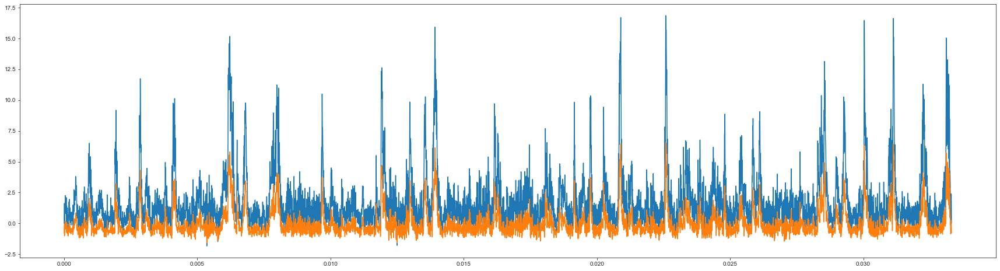

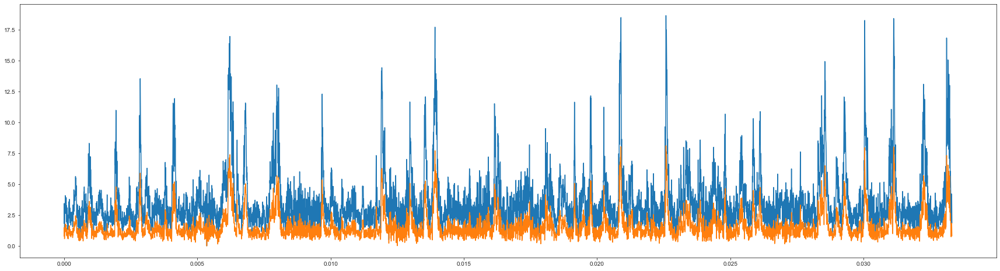

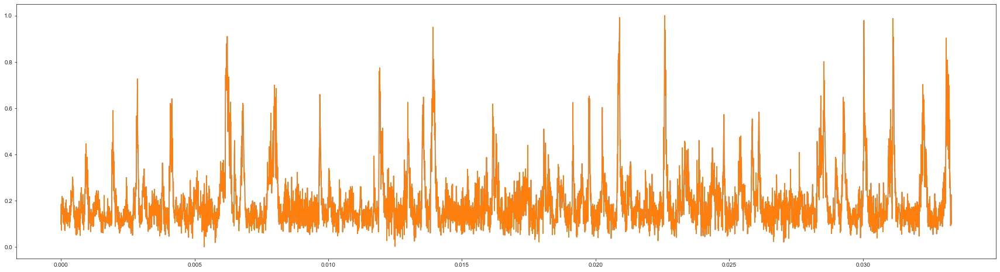

In [26]:
#create rectified dfof and dfof_z
dfof_upsamp_frame=pd.DataFrame(dfof_upsamp.T,index=behav_ser_dict_trunc['rt_ppl_ser'].index)
dfof_z_upsamp_frame=pd.DataFrame(dfof_z_upsamp.T,index=behav_ser_dict_trunc['rt_ppl_ser'].index)

dfof_rect_frame=dfof_upsamp_frame.copy()
dfof_z_rect_frame=dfof_z_upsamp_frame.copy()

dfof_upsamp_min=np.zeros(len(dfof_upsamp_frame.T),dtype=np.float16)
dfof_z_upsamp_min=np.zeros(len(dfof_z_upsamp_frame.T),dtype=np.float16)

for i in range(nNeurons):
    dfof_upsamp_min[i] = dfof_upsamp_frame[i].min()
    dfof_z_upsamp_min[i] = dfof_z_upsamp_frame[i].min()
    
for i in range(nNeurons):
    dfof_rect_frame[i] = dfof_rect_frame[i]-dfof_upsamp_min[i]
    dfof_z_rect_frame[i] = dfof_z_rect_frame[i]-dfof_z_upsamp_min[i]

#create normalized dfof and dfof_z
dfof_norm_frame=dfof_rect_frame.copy()
dfof_z_norm_frame=dfof_z_rect_frame.copy()

for i in range(nNeurons):
    dfof_norm_frame[i]=dfof_norm_frame[i]/dfof_norm_frame[i].max()
    dfof_z_norm_frame[i]=dfof_z_norm_frame[i]/dfof_z_norm_frame[i].max()
    
plt.figure(figsize=(30,8))
plt.plot(dfof_upsamp_frame.index/60,dfof_upsamp_frame[0])
plt.plot(dfof_z_upsamp_frame.index/60,dfof_z_upsamp_frame[0])

plt.figure(figsize=(30,8))
plt.plot(dfof_rect_frame.index/60,dfof_rect_frame[0])
plt.plot(dfof_z_rect_frame.index/60,dfof_z_rect_frame[0])

plt.figure(figsize=(30,8))
plt.plot(dfof_norm_frame.index/60,dfof_norm_frame[0])
plt.plot(dfof_z_norm_frame.index/60,dfof_z_norm_frame[0])

In [31]:
#make dataFrames
behav_resamp_frame=pd.DataFrame(behav_ser_dict_trunc[behav_ser_keys[0]],index=behav_ser_dict_trunc['rt_ppl_ser'].index)
for i in range(len(behav_ser_keys)-1):
    behav_resamp_frame=pd.concat([behav_resamp_frame,behav_ser_dict_trunc[behav_ser_keys[i+1]]], axis=1)
behav_resamp_frame=behav_resamp_frame.set_axis(behav_ser_keys[:],axis=1)
    
#combine 2P and behav with indexed timestamps into data frame
behav_2P_comb_frame=pd.merge(behav_resamp_frame,dfof_upsamp_frame, left_index=True, right_index=True)
behav_2P_z_comb_frame=pd.merge(behav_resamp_frame,dfof_z_upsamp_frame, left_index=True, right_index=True)
behav_2P_rect_comb_frame=pd.merge(behav_resamp_frame,dfof_rect_frame, left_index=True, right_index=True)
behav_2P_z_rect_comb_frame=pd.merge(behav_resamp_frame,dfof_z_rect_frame, left_index=True, right_index=True)
behav_2P_norm_comb_frame=pd.merge(behav_resamp_frame,dfof_norm_frame, left_index=True, right_index=True)

What is the resolution, in micrometers per pixel: 5


(924, 1000)


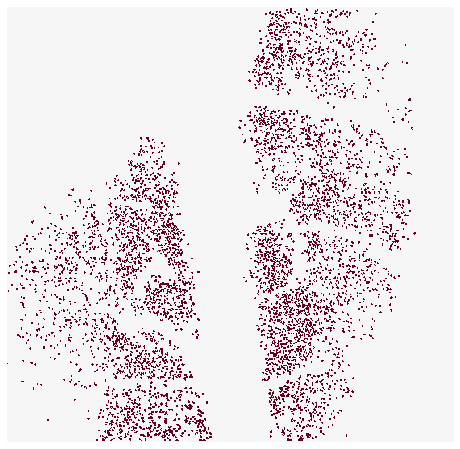

In [32]:
#multimodal alignment, step 1

res_int = float(input("What is the resolution, in micrometers per pixel:"))
#res_int = 5 #Resolution, in micrometers per pixel
im = np.zeros((ops['Lx'], ops['Ly']))

for n in range(0,nROIs):
    #print(n)
    if iscell[n,0]==1:
        #print(n)
        ypix = stat[n]['ypix'][~stat[n]['overlap']]#*res_int
        xpix = stat[n]['xpix'][~stat[n]['overlap']]#*res_int
        if (iscell[n,0] == 1) & (iscell[n,1] > 0.50):
            #print(n)
            im[xpix,ypix] = 1
        else:
            im[xpix,ypix] = -1

fig, ax = plt.subplots(figsize=(8,8))
sns.heatmap(im,ax=ax,cmap='RdBu_r',center=0,cbar=False)#,color_continuous_scale='RdBu_r')
print(im.shape)

plt.imsave(os.path.join(PlotDir,'neural-location_real_{}_MMM.png'.format(fsuffix)),im)

ax.axis('off')
plt.savefig(os.path.join(PlotDir,'neural-location_{}.png'.format(fsuffix)))

In [29]:
#multimodal alignment, step 2

# -*- coding: utf-8 -*-
"""
Created on Thu Dec 16 11:30:51 2021
@author: admin
"""

import os
import glob
import numpy as np
import matplotlib.pyplot as plt
from skimage import io
from skimage.measure import block_reduce
from skimage.transform import PiecewiseAffineTransform, warp
from skimage.filters import gaussian
from scipy import ndimage
import scipy.ndimage.morphology as ni

def import_multi_tif(tif_folder, n_channels=2, down_sample_factor= 2):
    tif_filepaths = glob.glob(os.path.join(tif_folder + '\*.tif'))
    print('\n' + str(len(tif_filepaths)) + ' file(s) to process')
    for i, image_path in enumerate(tif_filepaths):
        im = io.imread(image_path)
        if n_channels==2:
            if i == 0:
                wf_blue = np.ndarray([0, int(im.shape[1]/down_sample_factor), int(im.shape[2]/down_sample_factor)])
                wf_green = np.ndarray([0, int(im.shape[1]/down_sample_factor), int(im.shape[2]/down_sample_factor)])
                
            first = np.atleast_3d(block_reduce(im[np.arange(0,len(im),2)],(1,down_sample_factor,down_sample_factor),func=np.mean))
            second = np.atleast_3d(block_reduce(im[np.arange(1,len(im),2)],(1,down_sample_factor,down_sample_factor),func=np.mean))
            if wf_blue.shape[0] == wf_green.shape[0]:
                wf_blue = np.append(wf_blue, first, axis=0)
                wf_green = np.append(wf_green, second, axis=0)
            else:
                wf_blue = np.append(wf_blue, second, axis=0)
                wf_green = np.append(wf_green, first, axis=0)                  
        print('\nFile ' + str(i+1) + ' of ' + str(len(tif_filepaths)) + ' complete')
    return wf_blue, wf_green

def set_transform_anchors(stationary_image, warp_image):
    figure = plt.figure()
    ax = plt.subplot(1,2,1)
    ax.imshow(stationary_image)
    ax2 = plt.subplot(1,2,2)
    ax2.imshow(warp_image)
    
    plt.suptitle('Set points to anchor transformation\n'+
                 'Select point on left then right image for each anchor\n'+
                 'left click to select | right click to cancel last select | middle click to complete')
    points = np.array(plt.ginput(100,timeout=300))

    stationary_points = points[np.array(range(0,len(points),2),dtype=int)]
    warp_points = points[np.array(range(1,len(points),2),dtype=int)]
    ax.scatter(stationary_points[:,0],stationary_points[:,1],color='b')
    for idx in range(len(stationary_points)):
        ax.text(stationary_points[idx][0],stationary_points[idx][1],str(idx),color='r')
    ax2.scatter(warp_points[:,0],warp_points[:,1],color='b')
    for idx in range(len(warp_points)):
        ax2.text(warp_points[idx][0],warp_points[idx][1],str(idx),color='r')
    plt.pause(0.1)
    return stationary_points, warp_points, figure

def transform_image(stationary_image,warp_image,stationary_points, warp_points):
    tform = PiecewiseAffineTransform()
    tform.estimate(stationary_points, warp_points)
    out_rows = stationary_image.shape[0]
    out_cols = stationary_image.shape[1]
    warped_image = warp(warp_image, tform, output_shape=(out_rows, out_cols))
    return warped_image

def smooth_masks(masks):
    for i in range(masks.shape[0]):
        img = masks[i,:,:]
        dst = gaussian(1-img,sigma=(1))
        dst[dst<=.01]=1
        dst[dst<.1]=0
        masks[i,:,:]=dst
    return masks

def reduce_mask_overlap(masks):
    for i in range(masks.shape[0]):
        this_mask = masks[i,:,:]
        other_masks = masks[np.where([np.arange(masks.shape[0])!=i])[1],:,:]
        other_masks_merge = np.max(other_masks,axis=0)
        overlap = np.where((this_mask+other_masks_merge)>1)
        this_mask[overlap[0],overlap[1]]=0
        masks[i,:,:]=this_mask
    return masks

def masks_to_outlines(masks):
    outlines = np.zeros(masks.shape,dtype=np.int8)
    for i in range(outlines.shape[0]):
        mask = masks[i,:,:]
        outlines[i,:,:] = mask - ni.binary_erosion(mask)
    return outlines

def rotate_3d_matrix(array_3d,angle = 22.5):   
    this_slice = array_3d[0,:,:]
    this_rotated = ndimage.rotate(this_slice, angle, reshape=True)
    rotated_matrix = np.ndarray([array_3d.shape[0],this_rotated.shape[0],this_rotated.shape[1]],dtype=np.int8)
    for idx in range(array_3d.shape[0]):
        this_slice = array_3d[idx,:,:]
        if len(np.where(this_slice==1)[0])>0:
            this_rotated = ndimage.rotate(this_slice, angle, reshape=True)
            this_rotated[this_rotated>=.2]=1
            this_rotated[this_rotated<.2]=0
            rotated_matrix[idx,:,:] = this_rotated
    return rotated_matrix

def surface_projection(volume):
    shell_volume = np.zeros(volume.shape,np.int8)
    for ii in range(volume.shape[0]):
        for jj in range(volume.shape[2]):
            zplane = np.where(volume[ii,:,jj]>0)[0]
            if len(zplane)>0:
                shell_volume[ii,zplane[0],jj] = 1
    return shell_volume

In [27]:
#outlines problem check, part 1

%matplotlib inline
plt.imshow(masks[45])

NameError: name 'masks' is not defined

In [28]:
#outlines problem check, part 2

np.where(outlines[45]==1),outlines.shape

NameError: name 'outlines' is not defined

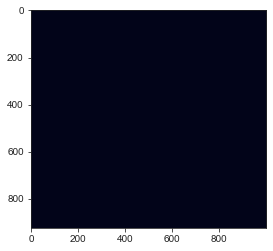

In [46]:
#outlines problem check, part 3

plt.imshow(session_masks[45])

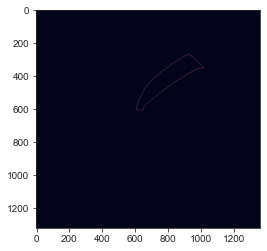

In [48]:
#outlines problem check, part 4

outlines=masks_to_outlines(masks)
# plt.imshow(mask - ni.binary_erosion(mask))
plt.imshow(outlines[45])
# plt.colorbar()

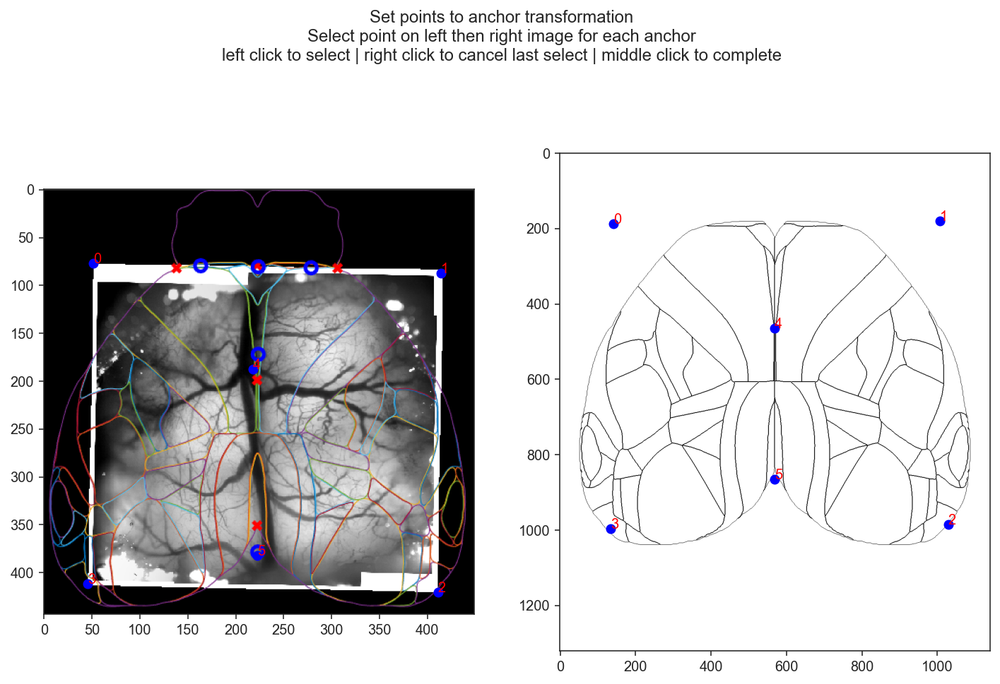

In [30]:
#multimodal alignment, step 3

# -*- coding: utf-8 -*-
"""
Created on Thu Dec 16 17:09:27 2021
@author: Daniel Hulsey
this script is used to align a CCF to a multimodalmapping session. Points selected to align the ccf will be saved for future use.
"""

import os
from skimage import io
#import uobrainflex.utils.image_utilities as im_util
import matplotlib.pyplot as plt
import numpy as np
import tkinter as tk
from tkinter import filedialog

%matplotlib qt
import matplotlib.pyplot as plt

root = tk.Tk()
root.withdraw()

mmm_title = 'Select multi modal map image'
mmm_dir = 'C:\\Users\\admin\\Desktop\\figure dump\\CCF'
mmm_image_path = filedialog.askopenfilename(title = mmm_title, initialdir = mmm_dir)

##hardcode this? or put it in conf file?
ccf_title = 'Select CCF image'
ccf_dir = 'C:\\Users\\admin\\Desktop\\figure dump\\CCF'
ccf_file_path = filedialog.askopenfilename(title = ccf_title, initialdir = ccf_dir)


save_folder = os.path.dirname(mmm_image_path)
subject = os.path.basename(mmm_image_path)
subject = subject[:subject.find("_")]


mmm_image = io.imread(mmm_image_path)
ccf_image = io.imread(ccf_file_path)
mmm_points, ccf_points, figure = set_transform_anchors(mmm_image, ccf_image)

plt.savefig(save_folder + '/' + subject +'_mmm_ccf_fit.png')
np.save(save_folder + '/' + subject + '_mmm_points',mmm_points)
np.save(save_folder + '/' + subject + '_ccf_points',ccf_points)

plt.savefig(os.path.join(PlotDir,'_mmm_ccf_fit_{}.png'.format(fsuffix)))
np.save(os.path.join(PlotDir,'_mmm_points_{}'.format(fsuffix)),mmm_points)
np.save(os.path.join(PlotDir,'_ccf_points_{}'.format(fsuffix)),ccf_points)

In [31]:
#multimodal alignment, step 4

# -*- coding: utf-8 -*-
"""
Created on Thu Dec 16 17:09:27 2021
@author: Daniel Hulsey
this script aligns a ccf to an individual session, and extracts dff data for each indicated region. 
Running it fully requires:
    1. saved dff trace for the session being analyzed
    2. saved points to align CCF to multimodalmap session
    3. blood vessel images from the CCF and session for analysis for alignment
Save location for the region dff traces needs to be better defined    
"""

from skimage import io
#import uobrainflex.utils.image_utilities as im_util

import numpy as np
import tkinter as tk
from tkinter import filedialog
import glob 
from PIL import Image

%matplotlib qt
import matplotlib.pyplot as plt

def area_mean_dff(dff,pixel_list):
    xs = pixel_list[0,:]
    ys = pixel_list[1,:]
    return np.mean(dff[:,xs,ys],axis=1)

def area_max_dff(dff,pixel_list):
    xs = pixel_list[0,:]
    ys = pixel_list[1,:]
    return np.max(dff[:,xs,ys],axis=1)

# select folders and align session and mmm vessel images
newfolders=''
while newfolders != 'n': # repeat until user indicates that new folders should not be selected
    
    subject_title = 'select subject mmm folder'
    session_title = 'select session folder'
    root = tk.Tk()
    root.withdraw()
    subject_folder = filedialog.askdirectory(title = subject_title)
    session_folder = filedialog.askdirectory(title = session_title)
    save_folder = session_folder
    

    mmm_image_path = glob.glob(subject_folder + '/*MMM.png')[0]
    
    # session_vessels_path = glob.glob(subject_folder + '/*vessel*')[0] ## this is the future one. below for testing
    session_vessels_path = glob.glob(session_folder + '/*MMM.png')[0]
        
    mmm_image = io.imread(mmm_image_path)
    vessel_image = io.imread(session_vessels_path)
    
    repeat_align=''
    while repeat_align != 'n': # repeat until user replys to not
        session_vessel_points, session_mmm_points, figure = set_transform_anchors(vessel_image, mmm_image)
        plt.savefig(save_folder +'\mmm_to_session_align.png')
        repeat_align = input("repeat alignment with these images? Y/n\n")
    newfolders = input("repeat alignment with different folder selections? Y/n\n")
    

plt.savefig(save_folder +'\mmm_to_session_align.png')
np.save(save_folder + '\session_mmm_points',session_mmm_points)
np.save(save_folder + '\session_vessel_points',session_vessel_points)

# # Now grab MMM & CCF alignments & DFF, create session masks, and grab mean region dffs
# print('loading dff data')
# # dff_filepath =  glob.glob(session_folder + '/*dff.npy')[0] # this is real one to use. hardcoded to demo with no real data
# dff_filepath =  'T:/BW048_211013_115911/WF_raw/WF_raw_dff.npy'
# dff = np.load(dff_filepath)

mmm_points_filepath = glob.glob(subject_folder + '/*mmm_points.npy')[0]
ccf_points_filepath = glob.glob(subject_folder + '/*ccf_points.npy')[0]
masks_filepath = 'C:\\Users\\McCormick Lab\\Documents\\Python\\Hulsey_A1V1M2_CCF_affine_Jan1122\\22deg\\masks.npy'
areas_filepath = 'C:\\Users\\McCormick Lab\\Documents\\Python\\Hulsey_A1V1M2_CCF_affine_Jan1122\\22deg\\areas.npy'

mmm_points = np.load(mmm_points_filepath)
ccf_points = np.load(ccf_points_filepath)
masks = np.load(masks_filepath)
areas = np.load(areas_filepath)


# st2, wp2 = set_transform_anchors(session_vessels, mmm_vessels)

print('aligning ccf regions')
session_masks=[]
mmm_masks=[]
for i, mask in enumerate(masks):
    mmm_mask = transform_image(mmm_image, mask, mmm_points, ccf_points)
    mmm_mask[mmm_mask<.01]=0
    mmm_mask[mmm_mask>0]=1
    mmm_masks.append(mmm_mask)
    
    session_mask = transform_image(vessel_image, mmm_mask, session_vessel_points, session_mmm_points)
    session_mask[session_mask<.01]=0
    session_mask[session_mask>0]=1
    
    session_masks.append(session_mask)
session_masks = np.array(session_masks)

mmm_masks = np.array(mmm_masks)

plt.figure()
plt.imshow(np.sum(session_masks,axis=0))

plt.imshow(mmm_mask)
plt.imshow(mask)

session_masks = reduce_mask_overlap(session_masks)

plt.figure()
plt.imshow(np.sum(session_masks,axis=0))

outlines=masks_to_outlines(session_masks)
plt.figure()
plt.imshow(np.sum(outlines,axis=0))

outlines_pil=Image.fromarray(np.sum(outlines,axis=0)*255)
plt.figure()
outlines_pil.show()

plt.figure()
plt.imshow(vessel_image)
plt.imshow(np.sum(outlines,axis=0),cmap="gray")

vessel_outlines=vessel_image
outlines_flat=np.sum(outlines,axis=0)*255

for i in range(len(vessel_image[:,0,0])):
    for j in range(len(vessel_image[0,:,0])):
        if outlines_flat[i,j]>0:
            vessel_outlines[i,j,:]=255

plt.figure()
plt.imshow(vessel_outlines)
plt.savefig(save_folder +'\ccf_to_session_align_meso.tif',dpi=600,format='tif')

vessel_outlines_swap = vessel_outlines.transpose(1, 0, 2)
plt.figure()
plt.imshow(vessel_outlines_swap)
plt.savefig(save_folder +'\ccf_to_session_align_rotated.tif',dpi=600,format='tif')

# print('extracting are dff values')
# area_list = ['r_VISp','r_AUDp','r_MOs']
# for area in area_list:
#     # plt.figure()
#     mask_ind = np.where(areas==area)[0]
#     this_mask = session_masks[mask_ind,:,:][0].T
#     this_dff = area_mean_dff(dff,np.array(np.where(this_mask)))
#     np.save(save_folder + '/' + area + '_dff',this_dff)
    

repeat alignment with these images? Y/n
 n
repeat alignment with different folder selections? Y/n
 n


aligning ccf regions


In [52]:
#masks problem check, part 1

mmm_mask = transform_image(mmm_image, mask, mmm_points, ccf_points)

In [46]:
#masks problem check, part 2

session_vessel_points, session_mmm_points, figure = set_transform_anchors(vessel_image, mmm_image)
plt.savefig(save_folder +'\mmm_to_session_align.tif',dpi=600,format='tif')

NameError: name 'set_transform_anchors' is not defined

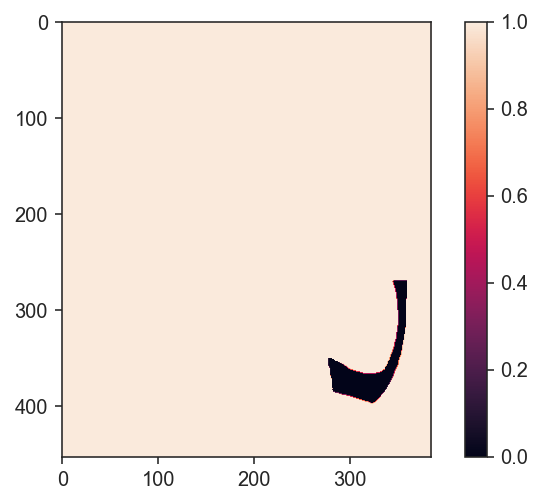

In [59]:
#masks problem check, part 3

plt.imshow(mmm_mask<.01)
plt.colorbar()

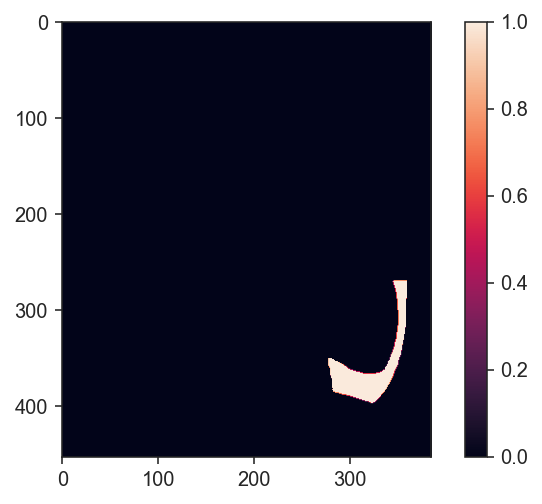

In [62]:
#masks problem check, part 4

mmm_mask2 = mmm_mask.copy()
mmm_mask2[mmm_mask2<.01]=0
mmm_mask2[mmm_mask2>0]=1
plt.imshow(mmm_mask2)
plt.colorbar()

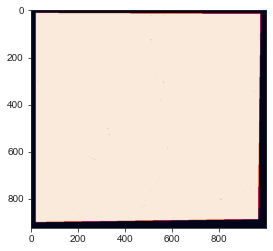

In [32]:
#masks problem check, part 5

import matplotlib.pyplot as plt
%matplotlib inline

plt.figure()
plt.imshow(np.sum(session_masks,axis=0))

In [35]:
#Perform PCA on z-scored dfof

from sklearn.decomposition import PCA
#pca = PCA(n_components=dfof_upsamp.shape[0])
pca = PCA(n_components=dfof_upsamp.shape[0])
#pca = PCA(n_components=4615)

dfof_transform = pca.fit_transform(dfof_z.T)
#dfof_transform = pca.fit_transform(dfof_z.T)
#isort_pca_test = np.argsort(dfof_transform.embedding[:,0])

1.0000001


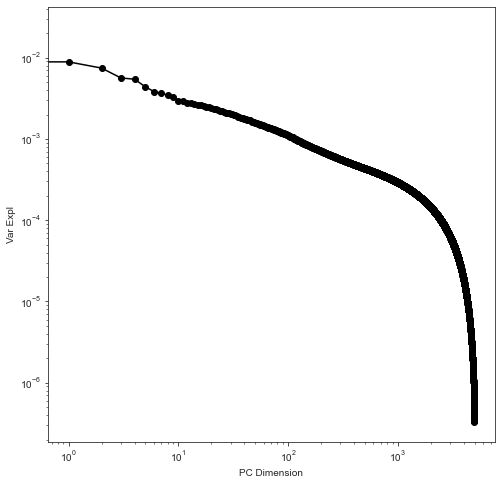

In [36]:
#Plot PCA variance explained for ordered PC dimensions, gut check

fig, ax = plt.subplots(figsize=(8,8))
print(np.sum(pca.explained_variance_ratio_))
plt.plot(pca.explained_variance_ratio_,'-ok')
ax.set_xscale('log'); ax.set_yscale('log')
ax.set_xlabel('PC Dimension')
ax.set_ylabel('Var Expl')
plt.savefig(save_folder +'\\variance_expl_PC_num.png')

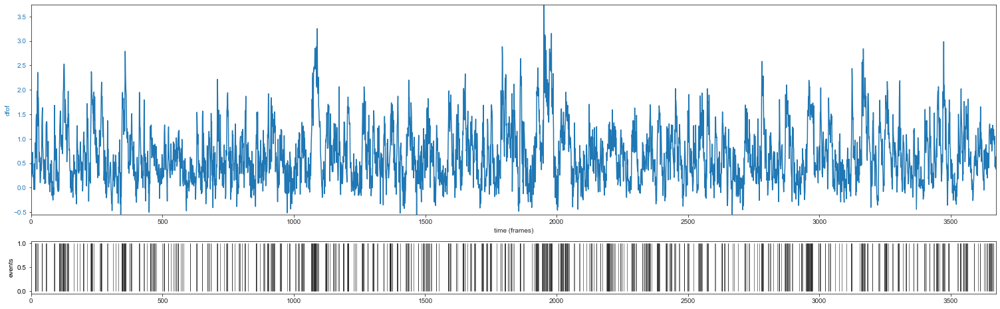

In [21]:
#Plot example alignment of dfof and deconv spikes

iCell = 2
nT_plot = len(dfof[1]); tStart = 0
plotslice = slice(tStart,tStart+nT_plot)

fig, axes = plt.subplots(2,1,figsize=(26,8),gridspec_kw={'height_ratios':[4,1]})
# axes[0].plot(dfof[iCell,plotslice])
# axes[0].plot(events[iCell,plotslice])

ax = axes[0]
color = 'tab:blue'
ax.set_xlabel('time (frames)')
ax.set_ylabel('dfof', color=color)
ax.plot(dfof[iCell,plotslice], color=color)
# ax.plot(dfof_z[iCell,plotslice], color='k')
# ax.plot(dfof_norm[iCell,plotslice], color='r')
ax.tick_params(axis='y', labelcolor=color)
ax.autoscale(tight=True)

ax2 = axes[1]# ax.twinx()  # instantiate a second axes that shares the same x-axis

color = 'black'
ax2.set_ylabel('events', color=color)  # we already handled the x-label with ax1
ax2.vlines(np.where(events_binary[iCell,plotslice] == 1)[0],0,1, color=color,lw=0.5)
ax2.tick_params(axis='y', labelcolor=color)
#ax.autoscale(tight=True)
ax2.set_xlim(0,nT_plot)
#need to align x axis of ax2 to ax1
plt.savefig(save_folder +'\dfof_deconv_aligned.tif',dpi=300,format='tif')

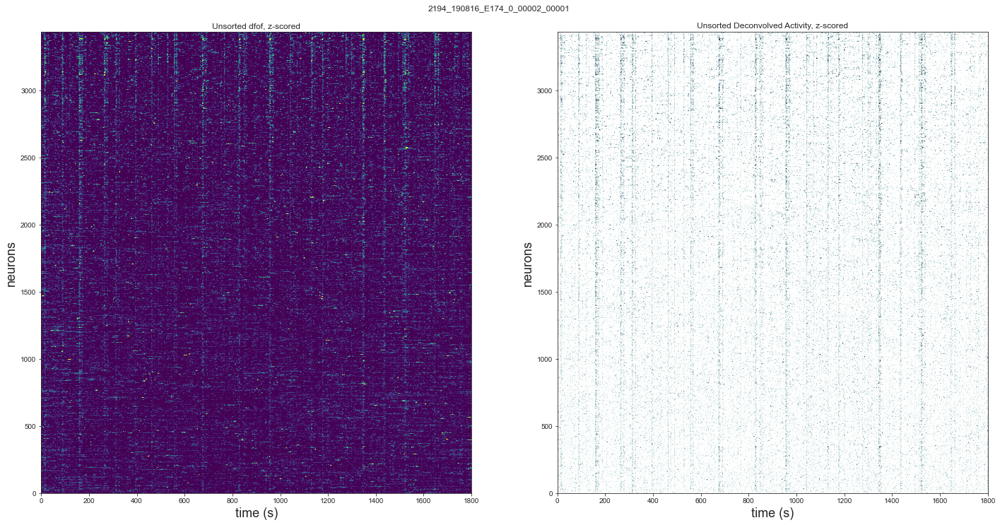

In [38]:
### view neuron sorting (suite2p sorting)


# iStart = 1500; nPts = 500
# plotslice = slice(iStart,iStart+nPts)
# fs = 3.5 # sampling rate of data in Hz
# splot = spks_z[::-1,plotslice]
# plt.figure(figsize=(16,10))
# ax=plt.imshow(splot, vmin=0,vmax=1.5,cmap='viridis',aspect='auto',extent=[0,splot.shape[1]/fs, 0,splot.shape[0]])
# plt.xlabel('time (s)', fontsize=18)
# plt.ylabel('neurons', fontsize=18)
# plt.title('Unsorted Deconvolved Activity, z-scored')
# plt.colorbar()
# plt.show()

#add usr defined length = fs*min*60 (s)

nT_plot = 18252; tStart = 0
plotslice = slice(tStart,tStart+nT_plot)

fig, axes = plt.subplots(1,2,figsize=(24,12))
plt.suptitle(fsuffix,y=0.925)

ax = axes[0]
ax.set_title('Unsorted dfof, z-scored')
splot = dfof_z[::-1,plotslice]
cm = ax.imshow(splot[::-1], vmin=0,vmax=1.5,cmap='viridis',aspect='auto',extent=[0,splot.shape[1]/fs, 0,splot.shape[0]]) #vmin=-1.5,vmax=1.5,cmap='RdBu_r'
# plt.colorbar(cm,ax=ax)

ax = axes[1]
ax.set_title('Unsorted Deconvolved Activity, z-scored')
splot = spks_z[::-1,plotslice]
ax.imshow(splot[::-1], vmin=0,vmax=1.5,cmap='bone_r',aspect='auto',extent=[0,splot.shape[1]/fs, 0,splot.shape[0]])


for ax in axes:
    ax.set_xlabel('time (s)', fontsize=18)
    ax.set_ylabel('neurons', fontsize=18)

plt.savefig(os.path.join(PlotDir,'unsorted_neuralactivity_{}.png'.format(fsuffix)))

In [7]:
#local rastermap code (from Suite2p / Carsen Stringer and Marius Pachitariu)

from scipy.ndimage import gaussian_filter1d
from scipy.sparse.linalg import eigsh
from scipy.stats import zscore, skew
import math
import numpy as np
import time

def swap_lines(CC0, di):
    npix = CC0.shape[0]
    irange = np.arange(npix-1)
    ri = np.arange(1,npix-di-1)
    rj = ri+di
    m0 = np.logical_and(ri[:,np.newaxis]-2<irange, rj[:,np.newaxis]+1>irange)
    m0 = np.logical_not(m0).astype('float32')
    Cost = CC0[ri-1,rj+1]- CC0[ri-1,ri] - CC0[rj,rj+1]
    Cost1 = Cost[:,np.newaxis] + CC0[np.ix_(ri,irange)] + CC0[np.ix_(rj,irange+1)] - CC0[irange, irange+1]
    Cost2 = Cost[:,np.newaxis] + CC0[np.ix_(rj,irange)] + CC0[np.ix_(ri,irange+1)] - CC0[irange, irange+1]
    Cost3 = CC0[ri-1,rj] + CC0[rj+1,ri] - CC0[ri-1,ri] - CC0[rj,rj+1]
    #Cost2 = Cost2* 0
    Cost3 = Cost3* 0
    Cost12  = np.maximum(Cost1, Cost2)
    Cost123 = np.maximum(Cost12, Cost3[:, np.newaxis]) * m0
    Cmax = np.amax(Cost123)
    imax = np.argmax(Cost123)
    x,y  = np.unravel_index(imax, Cost123.shape)
    if Cost3[x]>Cost12[x,y]:
        flip = 2
    else:
        flip = Cost1[x,y] < Cost2[x,y]
    return Cmax, ri[x], irange[y], flip

def bin(X0, dt):
    NN, NT = X0.shape
    NN = int(dt * np.floor(NN/dt))
    X0 = X0[:NN, :]
    X0 = np.reshape(X0, (-1, dt, NT)).mean(axis=1)
    return X0

def resort_X(X0, niter=500):
    X = X0.copy()
    npix, nd = X.shape
    X = np.vstack((X[0,:], X, X[0,:]))
    npix, nd = X.shape
    CC = np.corrcoef(X)
    CC[0, :] = 0
    CC[-1, :] = 0
    CC[:, 0] = 0
    CC[:, -1] = 0
    xid = np.arange(npix)
    for k in range(niter):
        flag = 0
        for di in np.arange(1, npix-2):
            Cmax, xstart, xinsrt, flip  = swap_lines(CC, di)
            if Cmax>0:
                # do the swap if it improves cost
                iall = np.hstack((np.arange(xstart), np.arange(xstart+di+1,npix)))
                if xstart+di+1>=npix:
                    print(xstart, di)
                ifind = int(np.nonzero(iall==xinsrt)[0])
                if ifind+1>=len(iall):
                    print(xstart, di, ifind, len(iall))
                if flip==2:
                    isort = np.hstack((np.arange(xstart), np.arange(xstart, xstart+di+1)[::-1], np.arange(xstart+di+1,npix)))
                elif flip==1:
                    isort = np.hstack((iall[:ifind+1], np.arange(xstart, xstart+di+1)[::-1], iall[ifind+1:]))
                else:
                    isort = np.hstack((iall[:ifind+1], np.arange(xstart, xstart+di+1), iall[ifind+1:]))
                CC = CC[np.ix_(isort, isort)]
                X = X[isort, :]
                #xid1 = np.zeros(npix, 'int32')
                #xid1[isort] = xid
                xid = xid[isort]
                flag = 1
                break
        if flag==0:
            break
    print(k, flag)
    X = X[1:-1, :]
    xid = xid[1:-1] - 1
    return X, xid

def distances(x, y):
    # x and y are n_components by number of data points
    ds = np.zeros((x.shape[0], y.shape[0]))
    if len(x.shape)==1:
        x = np.reshape(x, (-1, 1))
        y = np.reshape(y, (-1, 1))
    for j in range(x.shape[1]):
        ds += dwrap(x[:,j][:,np.newaxis] - y[:,j], 1.)**2
    ds = np.sqrt(ds)
    return ds

def create_ND_basis(dims, nclust, K, flag=True):
    # recursively call this function until we fill out S
    #flag = True
    if dims==1:
        xs = np.arange(0,nclust)
        S = np.ones((K, nclust), 'float32')
        for k in range(K):
            if flag:
                S[k, :] = np.sin(math.pi + (k+1)%2 * math.pi/2 + 2*math.pi/nclust * (xs+0.5) * int((1+k)/2))
            else:
                S[k, :] = np.cos(math.pi/nclust * (xs+0.5) * k)
        S /= np.sum(S**2, axis = 1)[:, np.newaxis]**.5
        fxx = np.floor((np.arange(K)+1)/2).astype('int')
        #fxx = np.arange(K).astype('int')
    else:
        S0, fy = create_ND_basis(dims-1, nclust, K, flag)
        Kx, fx = create_ND_basis(1, nclust, K, flag)
        S = np.zeros((S0.shape[0], K, S0.shape[1], nclust), np.float64)
        fxx = np.zeros((S0.shape[0], K))
        for kx in range(K):
            for ky in range(S0.shape[0]):
                S[ky,kx,:,:] = np.outer(S0[ky, :], Kx[kx, :])
                # fxx[ky,kx] = fy[ky] + fx[kx]
                fxx[ky,kx] = max(fy[ky], fx[kx]) + min(fy[ky], fx[kx])/1000.
        S = np.reshape(S, (K*S0.shape[0], nclust*S0.shape[1]))
    fxx = fxx.flatten()
    ix = np.argsort(fxx)
    S = S[ix, :]
    fxx = fxx[ix]
    return S, fxx

def svdecon(X, k=100):
    NN, NT = X.shape
    if NN>NT:
        COV = (X.T @ X)/NT
    else:
        COV = (X @ X.T)/NN
    if k==0:
        k = np.minimum(COV.shape) - 1
    Sv, U = eigsh(COV, k = k)
    U, Sv = np.real(U), np.abs(Sv)
    U, Sv = U[:, ::-1], Sv[::-1]**.5
    if NN>NT:
        V = U
        U = X @ V
        U = U/(U**2).sum(axis=0)**.5
    else:
        V = (U.T @ X).T
        V = V/(V**2).sum(axis=0)**.5
    return U, Sv, V

def upsample(cmap, dims, nclust, upsamp):
    N = cmap.shape[0]
    # first we need the coordinates of the maximum as an array
    nup = 5
    if dims>3:
        nup = 3
    if dims>4:
        upsamp = 4
    if dims>6:
        upsamp = 2
    Km, M1, M0 = upsampled_kernel(nup, 1.0, upsamp, dims)
    xid = np.argmax(cmap, axis=1)
    iun = nclust * np.ones(dims, 'int')
    iclust = np.unravel_index(xid, iun)
    iclust = np.array(iclust)
    ipick = np.zeros((dims, N, M0.shape[1]))
    for j in range(dims):
        ipick[j] = (iclust[j][:, np.newaxis] + M0[j]) % nclust
    xid = np.ravel_multi_index(ipick.astype('int'), iun)
    iN = np.tile(np.arange(N)[:, np.newaxis], (1, M0.shape[1]))
    C0 = cmap[iN.astype('int'), xid]
    mu = np.mean(C0, axis=1)
    C0 = C0 - mu[:, np.newaxis]
    upC = C0 @ Km.T
    xid = np.argmax(upC, axis=1)
    cmax = np.amax(upC, axis=1) + mu
    dxs = M1[:, xid]
    xs = (iclust + dxs)/nclust
    xs = xs%1.
    xs = xs.T
    return xs, cmax


def dwrap(kx,nc):
    '''compute a wrapped distance'''
    q1 = np.mod(kx, nc)
    q2 = np.minimum(q1, nc-q1)
    return q2

def my_mesh(dims, xs):
    if dims==1:
        mesh = np.reshape(xs, (1,-1))
    else:
        mesh = my_mesh(dims-1, xs)
        m0 = xs[:, np.newaxis] * np.ones(mesh.shape[1])
        m0 = np.reshape(m0, (1, -1))
        mesh = np.tile(mesh, (1, len(xs)))
        mesh = np.concatenate((mesh, m0), axis = 0)
    return mesh

def upsampled_kernel(nclust, sig, upsamp, dims):
    # assume the input is 5 by 5 by 5 by 5.... vectorized

    r = int((nclust-1)/2)
    xs = np.linspace(-r,r,nclust)
    xn = np.linspace(-r,r,(nclust-1)*upsamp+1)
    M0 = my_mesh(dims, xs)
    M1 = my_mesh(dims, xn)

    d1 = np.zeros((M1.shape[1], M0.shape[1]))
    d0 = np.zeros((M0.shape[1], M0.shape[1]))
    for j in range(M0.shape[0]):
        d1 += (M1[j,:][:,np.newaxis] - M0[j,:])**2
        d0 += (M0[j,:][:,np.newaxis] - M0[j,:])**2
    K0 = np.exp(-d0/sig**2)
    K1 = np.exp(-d1/sig**2)
    Km = K1 @ np.linalg.inv(K0 + .01 * np.eye(K0.shape[0]))

    return Km, M1, M0

class Rastermap:
    """Rastermap embedding algorithm
    Rastermap takes the nPCs (400 default) of the data, and embeds them into
    n_X clusters. It returns upsampled cluster identities (n_X*upsamp).
    Optionally, a 1D embeddding is also computed across the second dimension (n_Y>0),
    smoothed over, and the PCA recomputed before fitting Rastermap.
    data X: n_samples x n_features
    Parameters
    -----------
    n_components : int, optional (default: 2)
        dimension of the embedding space
    alpha : float, optional (default: 1.0)
        exponent of the power law enforced on component n as: 1/(K+n)^alpha
    K :  float, optional (default: 1.0)
        additive offset of the power law enforced on component n as: 1/(K+n)^alpha
    n_X :  int, optional (default: 40)
        size of the grid on which the Fourier modes are rasterized
    n_Y : int, optional (default: 0, i.e. not used)
        number of Fourier components in Y: will be used to smooth data for better PCs
    nPC : int, optional (default: 400)
        number of PCs to use during optimization
    init : initialization of algorithm (default: 'pca')
        can use 'pca', 'random', or a matrix n_samples x n_components
    verbose: bool (default: True)
        whether to output progress during optimization
    """
    def __init__(self, n_components=2, n_X = 40,
                 nPC = 200, init='pca', alpha = 1., K = 1.,
                 mode = 'basic', verbose = True, annealing = True, constraints = 2):

        self.n_components = n_components
        self.alpha = alpha
        self.K     = K
        self.nPC = nPC
        self.init = init
        self.mode = mode
        self.constraints = constraints
        self.annealing = annealing
        self.n_X  = int(n_X)
        self.verbose = verbose

    def fit(self, X=None, u=None, sv=None, v=None):
        """Fit X into an embedded space.
        Inputs
        ----------
        X : array, shape (n_samples, n_features)
        u,s,v : svd decomposition of X (optional)
        Assigns
        ----------
        embedding : array-like, shape (n_samples, n_components)
            Stores the embedding vectors.
        u,sv,v : singular value decomposition of data S, potentially with smoothing
        isort1 : sorting along first dimension of matrix
        isort2 : sorting along second dimension of matrix (if n_Y > 0)
        cmap: correlation of each item with all locations in the embedding map (before upsampling)
        A:    PC coefficients of each Fourier mode
        """
        if self.mode is 'parallel':
            Xall = X.copy()
            X = np.reshape(Xall.copy(), (-1, Xall.shape[-1]))
        #X -= X.mean(axis=-1)[:,np.newaxis]
        if ((u is None)):
            # compute svd and keep iPC's of data
            nmin = min([X.shape[0], X.shape[1]])
            nmin = np.minimum(nmin-1, self.nPC)
            u,sv,v = svdecon(np.float64(X), k=nmin)
            u = u * sv

        NN, self.nPC = u.shape
        if self.constraints==3:
            plaw = 1/(1+np.arange(1000))**(self.alpha/2)
            self.vscale = np.sum(u**2,axis=0)**.5
            tail = self.vscale[-1] * plaw[u.shape[1]:]/plaw[u.shape[1]]
            self.vscale = np.hstack((self.vscale, tail))
        # first smooth in Y (if n_Y > 0)
        self.u = u
        self.v = v
        if self.mode is 'parallel':
            NN = Xall.shape[1]
            X = np.zeros((2, NN, u.shape[1]), 'float64')
            for j in range(2):
                Xall[j] -= Xall[j].mean(axis=-1)[:, np.newaxis]
                X[j] = Xall[j] @ self.v

        if self.init == 'pca':
            usort = u * np.sign(skew(u, axis=0))
            init_sort = np.argsort(usort[:NN, :self.n_components], axis=0)
            #init_sort = u[:NN,:self.n_components]
            if False:
                ix = init_sort > 0
                iy = init_sort < 0
                init_sort[ix] = init_sort[ix] - 100.
                init_sort[iy] = init_sort[iy] + 100.
        elif self.init == 'random':
            init_sort = np.random.permutation(NN)[:,np.newaxis]
            for j in range(1,self.n_components):
                init_sort = np.concatenate((init_sort, np.random.permutation(NN)[:,np.newaxis]), axis=-1)
        else:
            init_sort = self.init
        if self.n_components==1 and init_sort.ndim==1:
            init_sort = init_sort[:,np.newaxis]

        # now sort in X
        isort1, iclustup = self._map(u.copy(), self.n_components, self.n_X, init_sort)
        self.isort = isort1
        self.embedding = iclustup
        return self

    def fit_transform(self, X, u=None, sv=None, v=None):
        """Fit X into an embedded space and return that transformed
        output.
        Inputs
        ----------
        X : array, shape (n_samples, n_features). X contains a sample per row.
        Returns
        -------
        embedding : array, shape (n_samples, n_components)
            Embedding of the training data in low-dimensional space.
        """
        self.fit(X, u, sv, v)
        return self.embedding

    def transform(self, X):
        """ if already fit, can add new points and see where they fall"""
        iclustup = []
        dims = self.n_components
        if hasattr(self, 'isort1'):
            if X.shape[1] == self.v.shape[0]:
                # reduce dimensionality of X
                X = X @ self.v
                nclust = self.n_X
                AtS = self.A.T @ self.S
                vnorm   = np.sum(self.S * (self.A @ AtS), axis=0)[np.newaxis,:]
                cv      = X @ AtS
                cmap    = np.maximum(0., cv)**2 / vnorm
                iclustup, cmax = upsample(np.sqrt(cmap), dims, nclust, 10)
            else:
                print('ERROR: new points do not have as many features as original data')
        else:
            print('ERROR: need to fit model first before you can embed new points')
        if iclustup.ndim > 1:
            iclustup = iclustup.T
        else:
            iclustup = iclustup.flatten()
        return iclustup

    def _create_2D_basis0(self, K, nclust):
        xs,ys = np.meshgrid(np.arange(nclust), np.arange(nclust))
        S = np.zeros((nclust, nclust, nclust, nclust), np.float64)
        x0 = np.arange(nclust)
        sig = 1.
        for kx in range(nclust):
            for ky in range(nclust):
                ds = dwrap(xs - x0[kx], nclust)**2 + dwrap(ys - x0[ky], nclust)**2
                S[ky, kx, :, :] = np.exp(-ds**.5/sig)
        S = np.reshape(S, (nclust**2, nclust**2))
        U, Sv, S = svdecon(S, k = K)
        S = S.T
        return S

    def _map(self, X, dims, nclust, u):
        if self.mode is 'parallel':
            Xall = X
            X = Xall[1]

        X -= X.mean(axis=0)
        NN,nPC = X.shape
        # initialize 1D clusters as nodes of 1st PC
        xid = np.zeros(NN)
        for j in range(dims):
            iclust = np.floor(nclust * u[:,j].astype(np.float64)/NN)
            xid = nclust * xid + iclust
        xid = xid.astype('int').flatten()

        if self.constraints==0:
            nfreqs = nclust
        elif self.constraints==1:
            nfreqs = np.ceil(1/4 * nclust)
            nfreqs = int(2 * np.floor(nfreqs/2)+1)
        else:
            nfreqs = np.ceil(2/3 * nclust)
            nfreqs = int(2 * np.floor(nfreqs/2)+1)

        if dims>1:
            SALL, fxx = create_ND_basis(dims, nclust, nfreqs, True)
        else:
            SALL, fxx = create_ND_basis(dims, nclust, nfreqs, False)
        SALL = SALL[1:, :]
        fxx = fxx[1:]
        tic = time.time()

        if dims==1:
            #nskip = int(max(1., 2*nfreqs/50))
            #full_pass = np.arange(1, nfreqs, nskip).astype('int')
            #full_pass = np.exp(np.linspace(np.log(1), np.log(nfreqs), 50)).astype('int')

            nskip = int(2 * max(1., nfreqs/100))
            ncomps_anneal = (np.arange(3, nfreqs, nskip)**dims).astype('int')  - 1
            ncomps_anneal = np.tile(ncomps_anneal, (2,1)).T.flatten()
            ncomps_anneal = np.concatenate((ncomps_anneal[:10], ncomps_anneal[2:10], ncomps_anneal[4:], SALL.shape[0]*np.ones(20)), axis=0).astype('int')
        else:
            nskip = int(2 * max(1., nfreqs/50))
            full_pass = (np.arange(3, nfreqs, nskip)**dims).astype('int')  - 1
            full_pass = np.tile(full_pass, (2,1)).T.flatten()

        nbasis,npix = SALL.shape
        #phase1 = full_pass[:10]
        #phase2 = full_pass[10] * np.ones(20)
        #phaseX = nbasis * np.ones(20)
        #ncomps_anneal = np.hstack((phase1, phase2, full_pass[3:], phaseX)).astype('int')

        print(ncomps_anneal.shape)

        if self.constraints==2:
            self.vscale = 1/(self.K + np.arange(len(fxx)))**(self.alpha/2)

        xnorm = (X**2).sum(axis=1)[:,np.newaxis]
        E = np.zeros(len(ncomps_anneal)+1)
        if self.verbose:
            print('time; iteration;  explained PC variance')
        if self.mode is 'parallel':
            cmapx = np.zeros((2, NN, nclust**dims), 'float32')

        #lam = 10*(1 + np.arange(SALL.shape[0]))/SALL.shape[0]
        for t,nc in enumerate(ncomps_anneal):
            # get basis functions
            S = SALL[:nc, :]
            X0 = np.zeros((npix, nPC))
            for j in range(npix):
                X0[j, :] = X[xid==j, :].sum(axis=0)

            A = S @ X0
            nA      = np.sum(A**2, axis=1)**.5
            if self.constraints<2:
                nA = np.ones(nA.shape)
            else:
                nA      /= self.vscale[:nc]
            A        /= nA[:, np.newaxis]
            eweights = ((S.T / nA) @ S)[xid, :]
            AtS     = A.T @ S
            if self.mode=='parallel':
                X = Xall[t%2]

            cv      = X @ AtS
            vnorm   = np.sum(AtS**2, axis=0)[np.newaxis,:]
            vnorm   = vnorm + xnorm  * eweights**2 - 2*eweights * cv
            cv      = cv - xnorm * eweights
            cmap    = np.maximum(0., cv)**2 / vnorm
            cmax    = np.amax(cmap, axis=1)
            xid     = np.argmax(cmap, axis=1)

            #asort   = np.argsort(xid)
            #xid[asort] = (np.arange(NN)*S.shape[1]/NN).astype('int')

            E[t]    = np.nanmean(cmax)/np.nanmean(xnorm)
            if self.mode is 'parallel':
                cmapx[t%2] = cmap
            if t%10==0:
                if self.verbose:
                    print('%2.2fs    %2.0d        %4.4f'%(time.time()-tic, t, E[t]))
        if self.verbose:
            print('%2.2fs   final      %4.4f'%(time.time()-tic, E[t]))
        if self.mode is 'parallel':
            iclustup1, cmax = upsample(np.sqrt(cmapx[0]), dims, nclust, 10)
            iclustup2, cmax = upsample(np.sqrt(cmapx[1]), dims, nclust, 10)
            iclustup = np.concatenate((iclustup1[np.newaxis, :, :], iclustup2[np.newaxis, :, :]), axis=0)
            isort = np.argsort(iclustup2[:,0])
            self.cmap = cmapx
        else:
            iclustup, cmax = upsample(np.sqrt(cmap), dims, nclust, 10)
            isort = np.argsort(iclustup[:,0])
            self.cmap = cmap
        E[t+1] = np.nanmean(cmax**2)/np.nanmean(xnorm)
        if self.verbose:
            print('%2.2fs upsampled    %4.4f'%(time.time()-tic, E[t+1]))
        self.E = E
        self.S = S
        self.A = A
        self.xid = xid
        return isort, iclustup

def main(X,ops=None,u=None,sv=None,v=None):
    if u is None:
        nmin = min([X.shape[0],X.shape[1]])
        nmin = np.minimum(nmin-1, ops['nPC'])
        sv,u = eigsh(X @ X.T, k=nmin)
        sv = sv**0.5
        v = X.T @ u
    isort2,iclust2 = _map(X.T,ops,v,sv)
    Xm = X - X.mean(axis=1)[:,np.newaxis]
    Xm = gaussian_filter1d(Xm,3,axis=1)
    isort1,iclust1 = _map(Xm,ops,u,sv)
    return isort1,isort2

In [40]:
# run rastermap based on deconvolved SPIKES

# >> from github <<
import sys
sys.path.append("C:\\Users\\McCormick Lab\\Documents\\GitHub\\rastermap")
#from mapping import Rastermap

model = Rastermap(n_components=1, n_X=100, nPC=500, init='pca').fit(spks_z)

### sort neurons and smooth across neurons and zscore in time
isort = np.argsort(model.embedding[:,0])
# isort1 = np.argsort(model.embedding[:,1])

# Sm = gaussian_filter1d(spks_z[isort,:].T, np.minimum(3,int(spks_z.shape[0]*0.005)), axis=1)
# Sm = Sm.T

(98,)
time; iteration;  explained PC variance
0.03s     0        0.0070
0.28s    10        0.0532
0.53s    20        0.0646
0.79s    30        0.0746
1.02s    40        0.0827
1.26s    50        0.0884
1.51s    60        0.0927
1.76s    70        0.0962
2.01s    80        0.0986
2.25s    90        0.0988
2.43s   final      0.0989
2.44s upsampled    0.1018


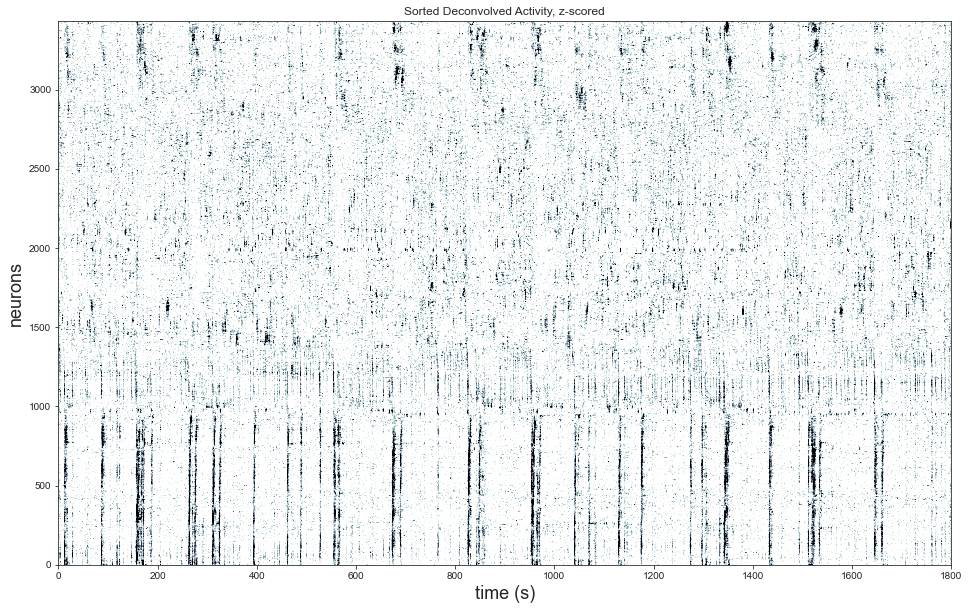

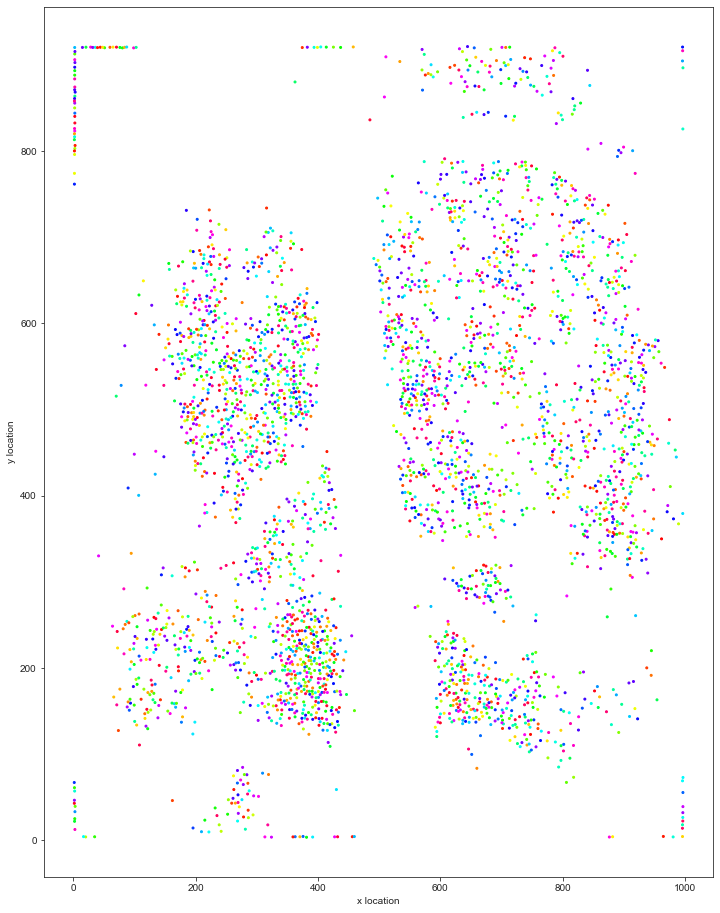

In [41]:
### view neuron sorting (Rastermap SPIKES)

splot = spks_z[isort,plotslice]
plt.figure(figsize=(16,10))
ax=plt.imshow(splot[::-1], vmin=0,vmax=1,cmap='bone_r',aspect='auto',extent=[0,splot.shape[1]/fs, 0,splot.shape[0]])
plt.xlabel('time (s)', fontsize=18)
plt.ylabel('neurons', fontsize=18)
# plt.colorbar()
plt.title('Sorted Deconvolved Activity, z-scored')
plt.savefig(os.path.join(PlotDir,'sorted_deconvolved-events_{}.png'.format(fsuffix)))

### view positions of cells colored by rastermap
# colormap
#cmap = cm.get_cmap(name='hsv')
cmap = plt.get_cmap(name = 'hsv')
#cmap = 'hsv'
cmap = cmap(np.linspace(0.,1,nNeurons))

xyloc = np.zeros((nNeurons,2))
for n in range(0,nNeurons):
    ypix = ops['Lx']-np.mean(stat_sub[n]['xpix'][~stat_sub[n]['overlap']])#*res_int
    xpix = np.mean(stat_sub[n]['ypix'][~stat_sub[n]['overlap']])#*res_int

    xyloc[n,0] = xpix; xyloc[n,1] = ypix;

fig, ax = plt.subplots(figsize=(12,16))
# assign color based on embedding
plt.scatter(xyloc[:,0], xyloc[:,1], s=4, color=cmap[isort,:])
plt.xlabel('x location')
plt.ylabel('y location');

plt.savefig(os.path.join(PlotDir,'rastermap_colored_sorted_cellMap_{}.png'.format(fsuffix)))

In [42]:
# Rastermap dF/F (z-scored)
# >> from github <<
import sys
sys.path.append("C:\\Users\\McCormick Lab\\Documents\\GitHub\\rastermap")
#from mapping import Rastermap

model_dfof = Rastermap(n_components=1, n_X=200, nPC=1000, init='random').fit(dfof_z)

### sort neurons and smooth across neurons and zscore in time
isort_dfof = np.argsort(model_dfof.embedding[:,0])
# isort1 = np.argsort(model.embedding[:,1])

# Sm = gaussian_filter1d(spks_z[isort,:].T, np.minimum(3,int(spks_z.shape[0]*0.005)), axis=1)
# Sm = Sm.T



(166,)
time; iteration;  explained PC variance
0.07s     0        0.0047
0.63s    10        0.0458
1.18s    20        0.0510
1.73s    30        0.0577
2.29s    40        0.0623
2.83s    50        0.0657
3.39s    60        0.0684
3.96s    70        0.0704
4.53s    80        0.0725
5.08s    90        0.0743
5.64s    100        0.0756
6.25s    110        0.0768
6.81s    120        0.0777
7.38s    130        0.0785
7.94s    140        0.0791
8.52s    150        0.0795
9.07s    160        0.0797
9.35s   final      0.0797
9.35s upsampled    0.0813


In [43]:
# Run rastermap on dF/F ("raw")

# >> from github <<
import sys
sys.path.append("C:\\Users\\McCormick Lab\\Documents\\GitHub\\rastermap")
#from mapping import Rastermap

model_dfof_raw = Rastermap(n_components=1, n_X=200, nPC=1000, init='pca').fit(dfof)

### sort neurons and smooth across neurons and zscore in time
isort_dfof_raw = np.argsort(model_dfof_raw.embedding[:,0])
# isort1 = np.argsort(model.embedding[:,1])

# Sm = gaussian_filter1d(spks_z[isort,:].T, np.minimum(3,int(spks_z.shape[0]*0.005)), axis=1)
# Sm = Sm.T



(166,)
time; iteration;  explained PC variance
0.07s     0        0.0012
0.66s    10        0.9918
1.28s    20        0.9836
1.90s    30        0.9934
2.51s    40        0.9947
3.14s    50        0.9931
3.75s    60        0.9849
4.39s    70        0.9951
5.00s    80        0.9845
5.61s    90        0.9950
6.21s    100        0.9927
6.86s    110        0.9907
7.47s    120        0.9973
8.09s    130        0.9778
8.70s    140        0.9978
9.35s    150        0.9878
10.00s    160        0.9935
10.31s   final      0.9945
10.32s upsampled    0.9950


In [48]:
# Run rastermap on dF/F ("1st PC")

# >> from github <<
import sys
sys.path.append("C:\\Users\\McCormick Lab\\Documents\\GitHub\\rastermap")
#from mapping import Rastermap

model_dfof_pca1 = Rastermap(n_components=1, n_X=2, nPC=1, init='pca').fit(dfof_z)

### sort neurons and smooth across neurons and zscore in time
isort_dfof_pca1 = np.argsort(model_dfof_pca1.embedding[:,0])
# isort1 = np.argsort(model.embedding[:,1])

# Sm = gaussian_filter1d(spks_z[isort,:].T, np.minimum(3,int(spks_z.shape[0]*0.005)), axis=1)
# Sm = Sm.T

(20,)
time; iteration;  explained PC variance
0.00s     0        0.9517
0.01s    10        1.0000
0.01s   final      1.0000
0.02s upsampled    0.9825


In [49]:
#test reindexing for the different applied raster sortings

print(isort_dfof[100:110])
print('')
print(isort_dfof_raw[100:110])
print('')
print(isort_dfof_pca1[100:110])

[1054 1105 1974 2337  926 3042  890 1060 3103 1440]

[3306  612 2932 2458 1534 2075 1183 2055  572 1136]

[1866 1860 1856 1847 1845 1843 1838 1827 1875 1824]


In [46]:
#what happens if we just sort with simple kmeans?

from sklearn.cluster import KMeans
k=8
kmeans=KMeans(n_clusters=k)
y_pred=kmeans.fit_predict(dfof_z)

In [50]:
#does kmeans seem to have worked?

print(y_pred[201])
print(y_pred[1284])
print(y_pred[1725])
print(nNeurons)

1
7
7
3432


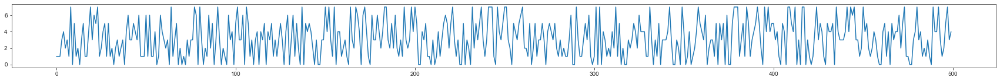

In [53]:
#what does simple kmeans cluster assignment distribution look like across all neurons?

%matplotlib inline

isort_dfof_kmeans=isort_dfof.copy()
for i in range(0,len(isort_dfof)):
    isort_dfof_kmeans[i]=y_pred[i]
    
isort_dfof_kmeans
plt.figure(figsize=(30,2))
plt.plot(isort_dfof_kmeans[500:1000])

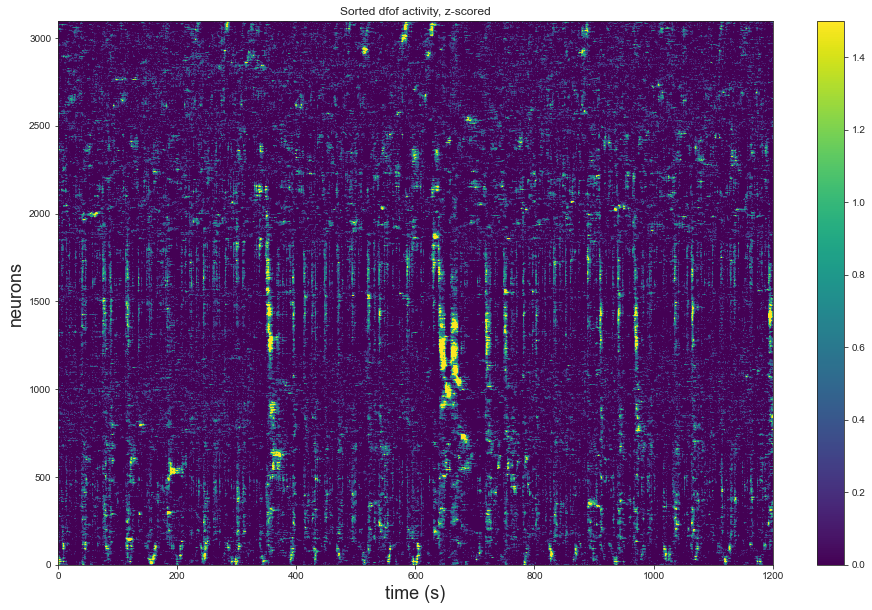

In [47]:
### view neuron sorting (rastermap dF/F z)

nT_plot = 18252; tStart = 0
plotslice = slice(tStart,tStart+nT_plot)
splot = dfof_z[isort_dfof,plotslice]
plt.figure(figsize=(16,10))

ax=plt.imshow(splot[::-1], vmin=0,vmax=1.5,cmap='viridis',aspect='auto',extent=[0,splot.shape[1]/fs, 0,splot.shape[0]])
plt.xlabel('time (s)', fontsize=18)
plt.ylabel('neurons', fontsize=18)
plt.colorbar()
plt.title('Sorted dfof activity, z-scored')
plt.savefig(os.path.join(PlotDir,'rastermap_zscored_sorted_dfof_{}.png'.format(fsuffix)))

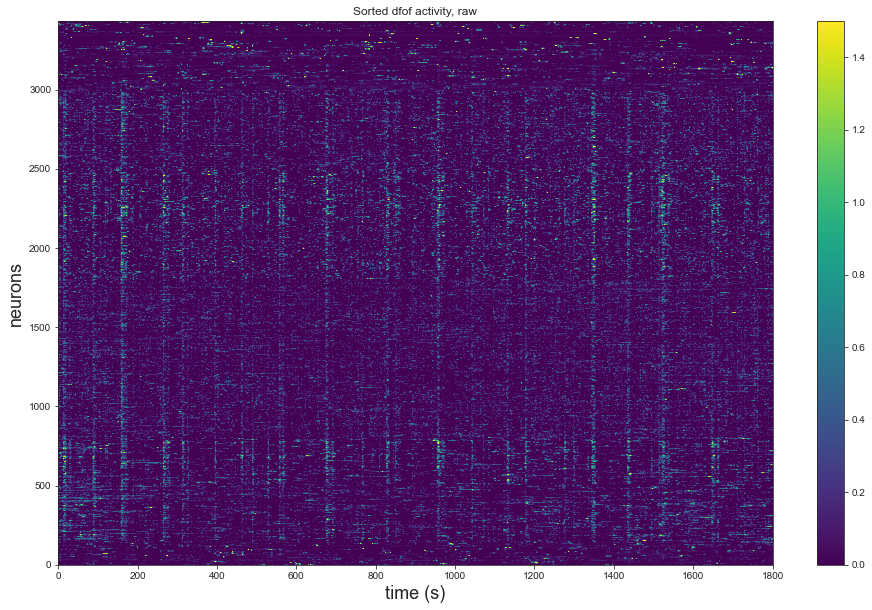

In [55]:
### view neuron sorting (Rastermap dF/F raw)

nT_plot = 18252; tStart = 0
plotslice = slice(tStart,tStart+nT_plot)
splot = dfof_z[isort_dfof_raw,plotslice]
plt.figure(figsize=(16,10))

ax=plt.imshow(splot[::-1], vmin=0,vmax=1.5,cmap='viridis',aspect='auto',extent=[0,splot.shape[1]/fs, 0,splot.shape[0]])
plt.xlabel('time (s)', fontsize=18)
plt.ylabel('neurons', fontsize=18)
plt.colorbar()
plt.title('Sorted dfof activity, raw')
plt.savefig(os.path.join(PlotDir,'rastermap_raw_sorted_dfof_{}.png'.format(fsuffix)))

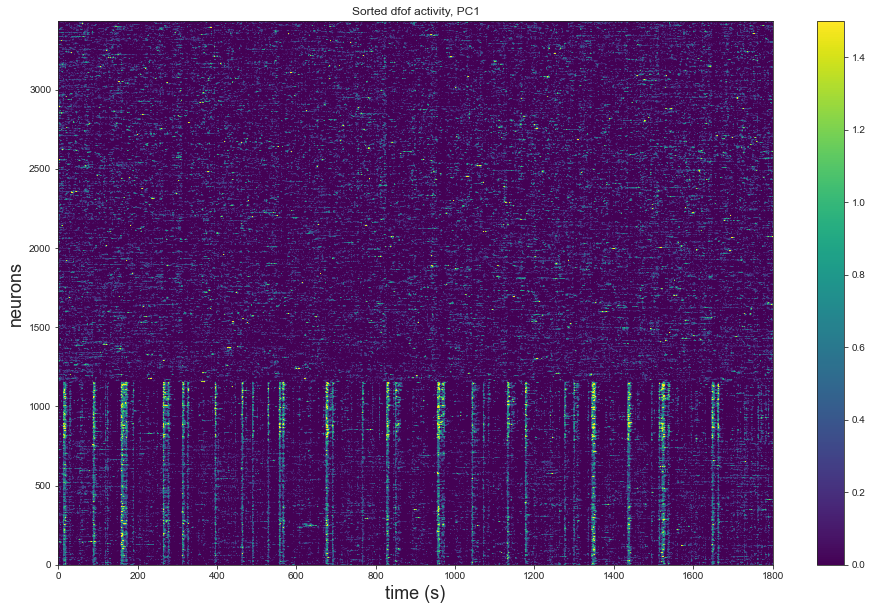

In [56]:
### view neuron sorting (Rastermap dF/F z-score, PC1 only)

nT_plot = 18252; tStart = 0
plotslice = slice(tStart,tStart+nT_plot)
splot = dfof_z[isort_dfof_pca1,plotslice]
plt.figure(figsize=(16,10))

ax=plt.imshow(splot[::-1], vmin=0,vmax=1.5,cmap='viridis',aspect='auto',extent=[0,splot.shape[1]/fs, 0,splot.shape[0]])
plt.xlabel('time (s)', fontsize=18)
plt.ylabel('neurons', fontsize=18)
plt.colorbar()
plt.title('Sorted dfof activity, PC1')
plt.savefig(os.path.join(PlotDir,'PC1_sorted_dfof_{}.png'.format(fsuffix)))

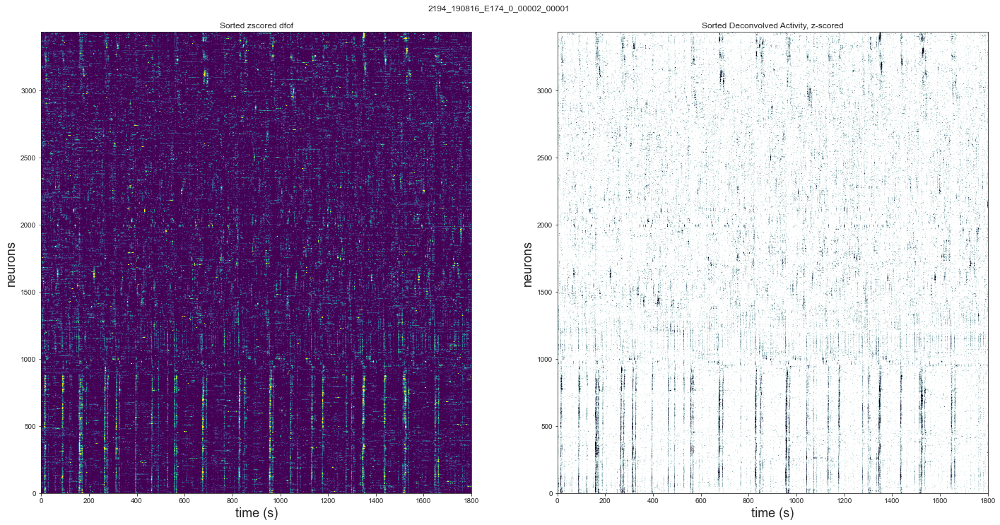

In [58]:
#plot dfof next to spikes

nT_plot = 18252; tStart = 0
plotslice = slice(tStart,tStart+nT_plot)

fig, axes = plt.subplots(1,2,figsize=(24,12))
plt.suptitle(fsuffix,y=0.925)

ax = axes[0]
ax.set_title('Sorted zscored dfof')
splot = dfof_z[isort,plotslice]
ax.imshow(splot[::-1], vmin=0,vmax=1.5,cmap='viridis',aspect='auto',extent=[0,splot.shape[1]/fs, 0,splot.shape[0]])


ax = axes[1]
ax.set_title('Sorted Deconvolved Activity, z-scored')
splot = spks_z[isort,plotslice]
ax.imshow(splot[::-1], vmin=0,vmax=1.5,cmap='bone_r',aspect='auto',extent=[0,splot.shape[1]/fs, 0,splot.shape[0]])


for ax in axes:
    ax.set_xlabel('time (s)', fontsize=18)
    ax.set_ylabel('neurons', fontsize=18)

plt.savefig(os.path.join(PlotDir,'sorted_neuralactivity_{}.png'.format(fsuffix)))

In [59]:
##### split dF/F_z rastermap into 6-12 user-defined discrete clusters based on visual inspection of above raster plots

nClusters=int(input('How many clusters do you want?')) 
print(nClusters)
min_range=np.zeros((nClusters),dtype='int') 
max_range=np.zeros((nClusters),dtype='int')

for i in range(0,nClusters): 
    if i==0:
        min_range[i]=int(input('Please enter min end of range for cluster# '+ str(i)+':')) 
        max_range[i]=int(input('Please enter max end of range for cluster# '+ str(i)+':'))
    else: 
        min_range[i]=max_range[i-1]+1 
        max_range[i]=int(input('Please enter max end of range for cluster# '+ str(i)+':'))

print(min_range) 
print(max_range)

How many clusters do you want? 10


10


Please enter min end of range for cluster# 0: 0
Please enter max end of range for cluster# 0: 300
Please enter max end of range for cluster# 1: 650
Please enter max end of range for cluster# 2: 800
Please enter max end of range for cluster# 3: 1000
Please enter max end of range for cluster# 4: 1400
Please enter max end of range for cluster# 5: 2050
Please enter max end of range for cluster# 6: 2500
Please enter max end of range for cluster# 7: 2750
Please enter max end of range for cluster# 8: 3100
Please enter max end of range for cluster# 9: 3432


[   0  301  651  801 1001 1401 2051 2501 2751 3101]
[ 300  650  800 1000 1400 2050 2500 2750 3100 3432]


In [35]:
#decimate df/F_z PC1 rastermap

import math as m

#nClusters_PC1=10
nClusters_PC1=int(input('Please enter the number of equally split PC1 groups desired:'))

print(nClusters_PC1)
min_range_PC1=np.zeros((nClusters_PC1),dtype='int')
max_range_PC1=np.zeros((nClusters_PC1),dtype='int')

for i in range(0,nClusters_PC1):
    if i==0:
        min_range_PC1[i]=0
        max_range_PC1[i]=m.floor(nNeurons/nClusters_PC1)
    elif i==nClusters_PC1-1:
        min_range_PC1[i]=max_range_PC1[i-1]+1
        max_range_PC1[i]=nNeurons
    else:
        min_range_PC1[i]=max_range_PC1[i-1]+1
        max_range_PC1[i]=max_range_PC1[i-1]+m.floor(nNeurons/nClusters_PC1)
        
print(min_range_PC1)
print(max_range_PC1)

Please enter the number of equally split PC1 groups desired: 5


5
[   0  620 1239 1858 2477]
[ 619 1238 1857 2476 3096]


In [63]:
#assign CCF area labels to each neuron

iscell_masks=np.zeros(len(iscell[:,0]),dtype='int')

for i in range(len(iscell)):
    for j in range(len(areas)):
        if (np.any(np.where(session_masks[j,:,:]>0)[0])):
            if session_masks[j,int(stat[i]['med'][1]),int(stat[i]['med'][0])]>0:
                iscell_masks[i]=j
                
iscell_masks_cell=iscell_masks[iscell_bool]

In [37]:
#calculate %cells in each rastermap group per area, PC1 sort only

areas_rastermap_density_PC1=np.zeros((nClusters_PC1,len(areas)),dtype='float')
#isort_dfof=isort_dfof.fillna(0)
#cell_count=cell_count.fillna(0)
raster_cell_count_PC1=np.zeros((len(areas),nClusters_PC1),dtype='float')
raster_cell_densities_PC1=np.zeros((len(areas),nClusters_PC1),dtype='float')

for i in range(len(areas)):
    for k in range(nNeurons):
        if iscell_masks_cell[k]==i:
            for j in range(nClusters_PC1):
                if isort_dfof_pca1[k]>=min_range_PC1[j] and isort_dfof_pca1[k]<=max_range_PC1[j]:
                    raster_cell_count_PC1[i,j]=raster_cell_count_PC1[i,j]+1
                
for i in range(len(areas)):
    for j in range(nClusters_PC1):
        if cell_count[i]>0:
            raster_cell_densities_PC1[i,j]=raster_cell_count_PC1[i,j]/cell_count[i]
        else:
            raster_cell_densities_PC1[i,j]=0

#raster_cell_densitites=np.nan_to_num(raster_cell_densities)
#print(areas_rastermap_density[6,2])

In [66]:
#calculate %cells in each rastermap group per area

areas_rastermap_density=np.zeros((nClusters,len(areas)),dtype='float')
#isort_dfof=isort_dfof.fillna(0)
#cell_count=cell_count.fillna(0)
raster_cell_count=np.zeros((len(areas),nClusters),dtype='float')
raster_cell_densities=np.zeros((len(areas),nClusters),dtype='float')

for i in range(len(areas)):
    for k in range(nNeurons):
        if iscell_masks_cell[k]==i:
            for j in range(nClusters):
                if isort_dfof[k]>=min_range[j] and isort_dfof[k]<=max_range[j]:
                    raster_cell_count[i,j]=raster_cell_count[i,j]+1
                
for i in range(len(areas)):
    for j in range(nClusters):
        if cell_count[i]>0:
            raster_cell_densities[i,j]=raster_cell_count[i,j]/cell_count[i]
        else:
            raster_cell_densities[i,j]=0

#raster_cell_densitites=np.nan_to_num(raster_cell_densities)
#print(areas_rastermap_density[6,2])

0.028985507246376812
0.12121212121212122
0.037037037037037035
0.14912280701754385
0.04051724137931034
0.14814814814814814
0.0
0.25
0.05660377358490566
0.13690476190476192
0.0
0.12121212121212122
0.09090909090909091
0.32
0.05862068965517241
0.2
0.04929577464788732
0.1320754716981132


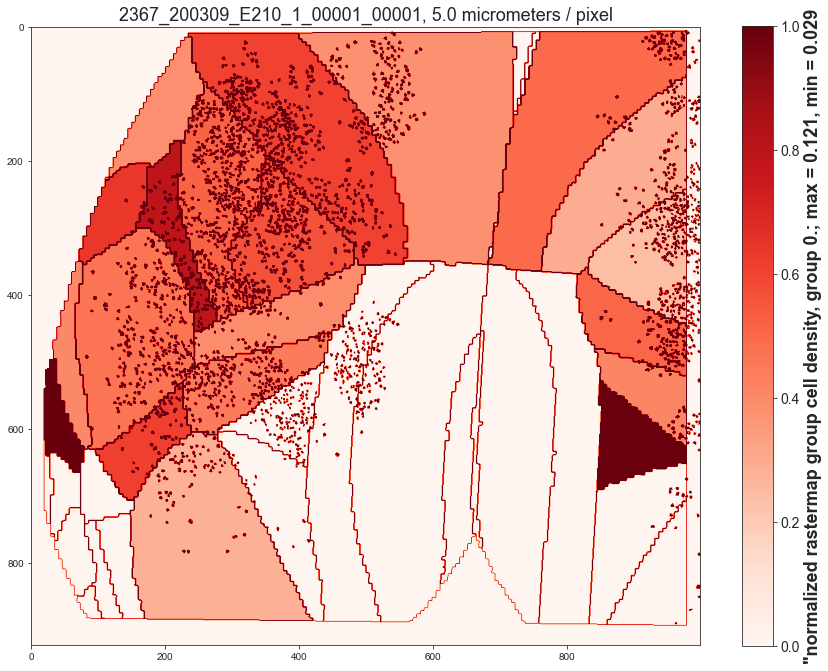

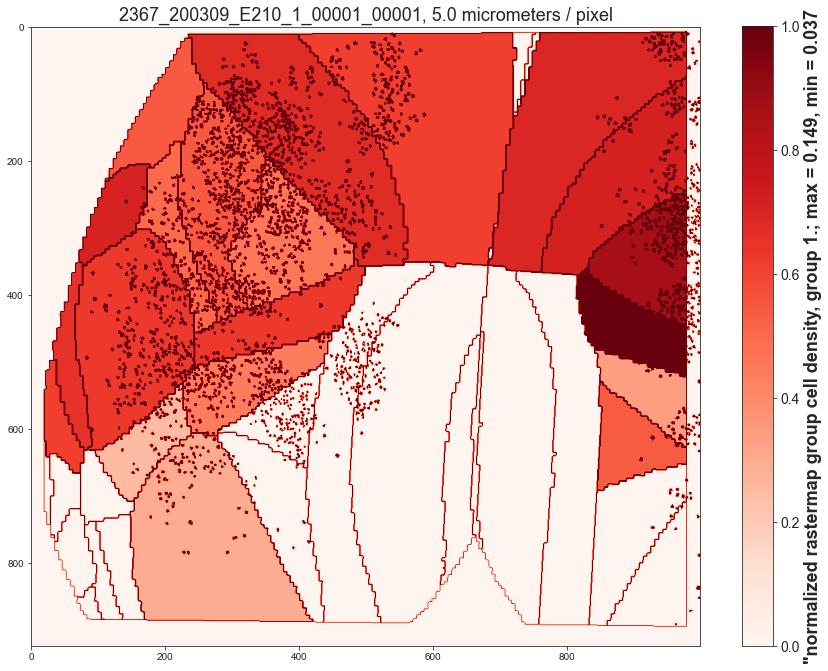

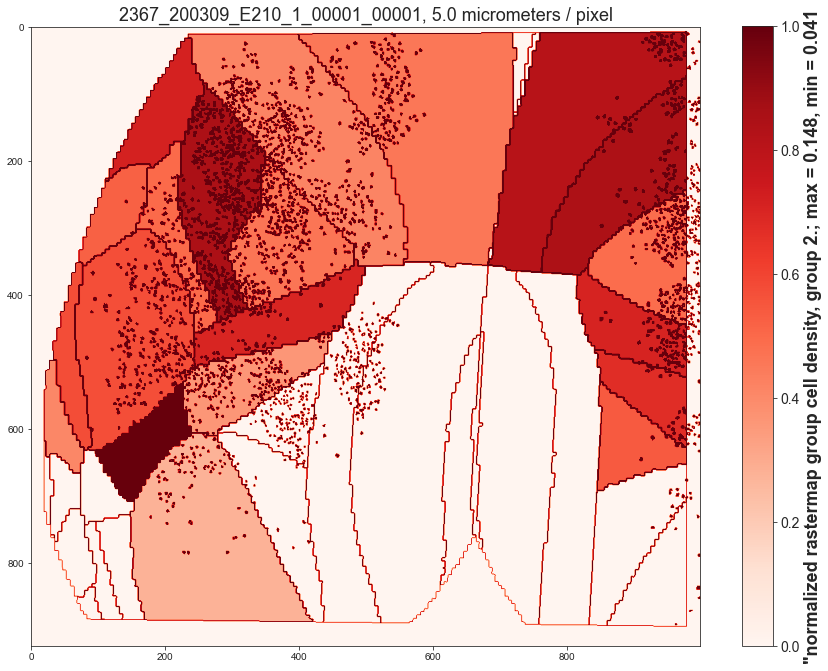

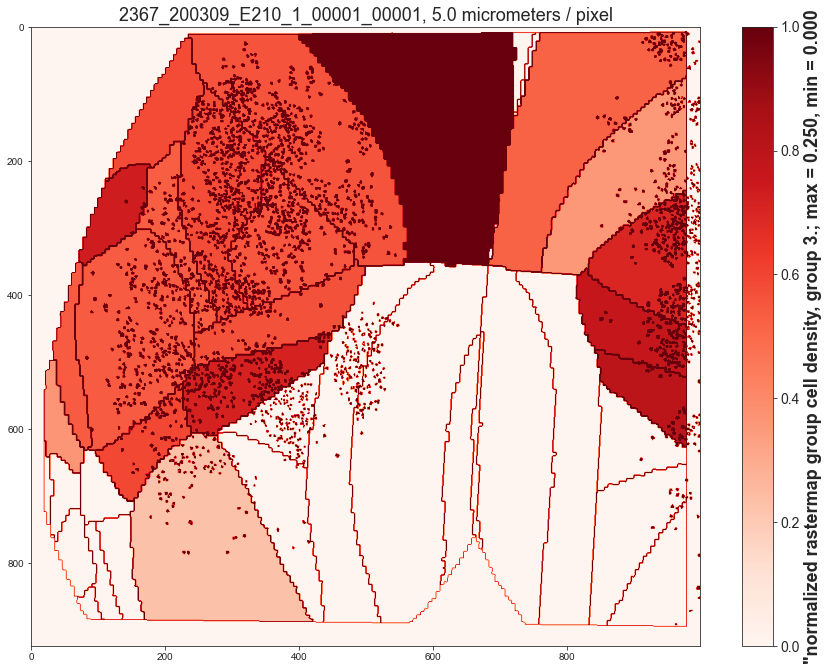

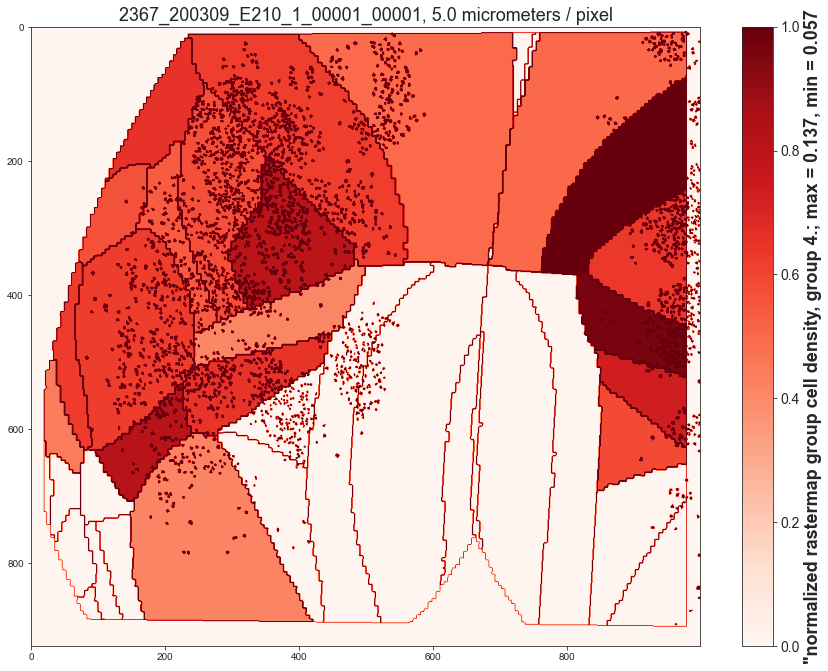

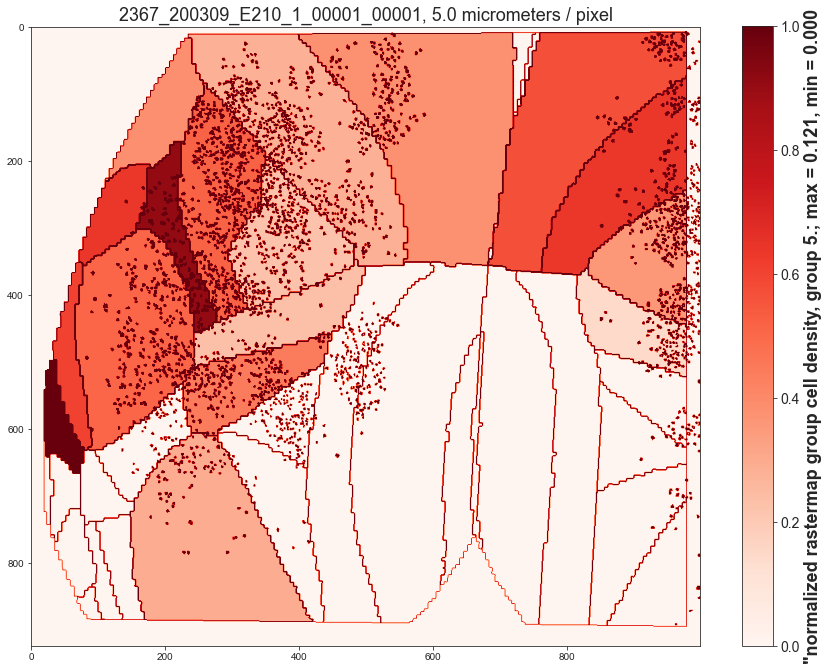

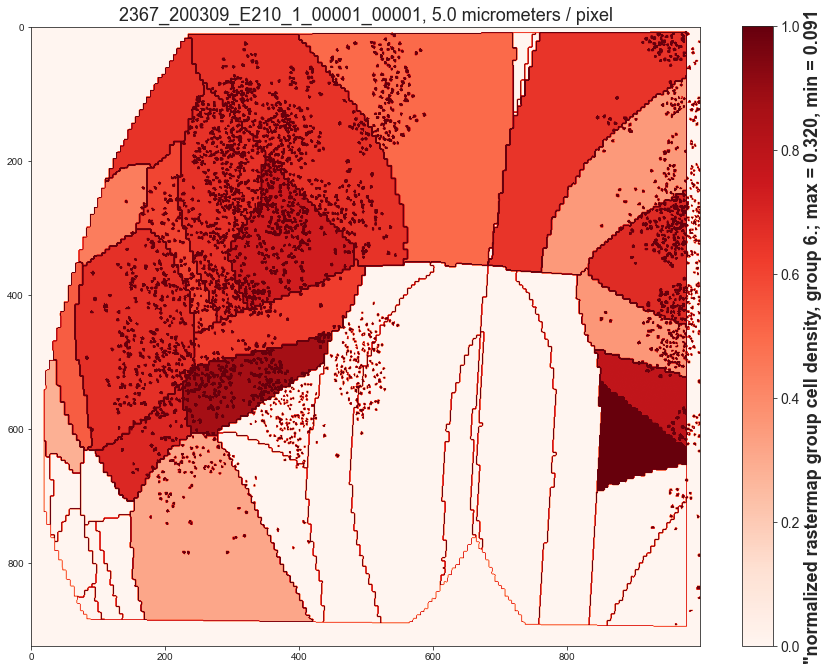

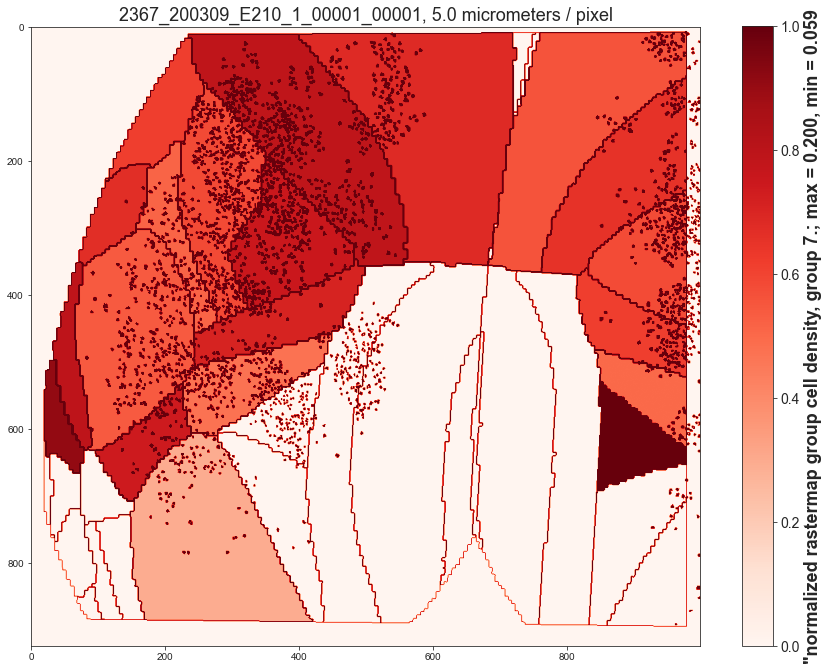

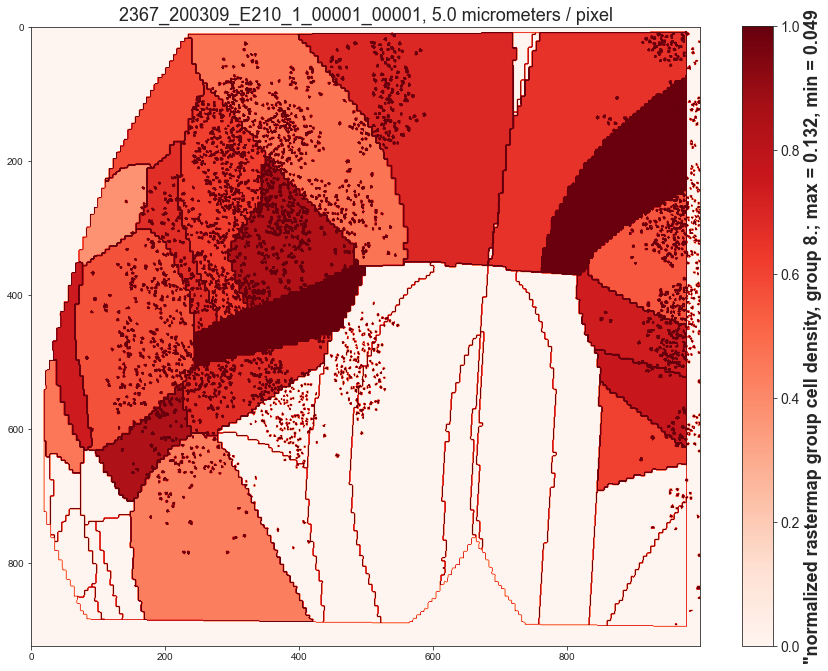

In [43]:
#plot color coded session masks, %cells in each rastermap group per area

for z in range(nClusters):
    im_restrict = np.zeros((ops['Lx'], ops['Ly']))

    for n in range(0,nROIs):
        if iscell[n,0]==1:
            ypix = stat[n]['ypix'][~stat[n]['overlap']]#*res_int
            xpix = stat[n]['xpix'][~stat[n]['overlap']]#*res_int
            if (iscell[n,0] == 1) & (iscell[n,1] > 0.50):
                im_restrict[xpix,ypix] = 1
            else:
                im_restrict[xpix,ypix] = -1

    for i in range(len(im_restrict[:,0])):
        for j in range(len(im_restrict[0,:])):
            if outlines_flat[i,j]>0:
                im_restrict[i,j]=1

    session_masks_rastermap_density=session_masks.copy()
    im_restrict_masked_rastermap_density=im_restrict.copy()

    max_corr=-1.01
    min_corr=1.01

    for i in range(len(session_masks[:,0,0])):
        session_masks_rastermap_density[i,:,:]=session_masks_rastermap_density[i,:,:]*raster_cell_densities[i,z]
        if cell_count[i]<20:
            session_masks_rastermap_density[i,:,:]=0
        if raster_cell_densities[i,z]>max_corr and cell_count[i]>20:
            max_corr=raster_cell_densities[i,z]
        if raster_cell_densities[i,z]<min_corr and cell_count[i]>20:
            min_corr=raster_cell_densities[i,z]

    for i in range(len(session_masks[:,0,0])):        
        if raster_cell_densities[i,z]>0:
            session_masks_rastermap_density[i,:,:]=session_masks_rastermap_density[i,:,:]/max_corr       
        #if raster_cell_densities[i,z]<0:
        #    session_masks_rastermap_density[i,:,:]=session_masks_rastermap_density[i,:,:]/(-max_corr)

        im_restrict_masked_rastermap_density=im_restrict_masked_rastermap_density+session_masks_rastermap_density[i,:,:]

    print(min_corr)
    print(max_corr)

    set_max=1
    set_min=-1

    colormap='seismic'

    if min_corr>=0:
        set_min=0
        colormap='Reds'

    if max_corr<0:
        set_max=0

    plt.figure(figsize = (15,15))
    plt.imshow(im_restrict_masked_rastermap_density,vmin=set_min,vmax=set_max,cmap=colormap)
    cbar=plt.colorbar(label="normalized rastermap group cell density, group "+ str(z) +'.', orientation="vertical",shrink=0.76)
    cbar.ax.tick_params(labelsize=14)

    format_min_corr="{:.3f}".format(min_corr)
    format_max_corr="{:.3f}".format(max_corr)

    cbar.set_label(label='"normalized rastermap group cell density, group '+ str(z)+'.; max = '+str(format_max_corr)+', min = '+str(format_min_corr),weight='bold',size=18)
    plt.title(fsuffix+", "+str(res_int)+" micrometers / pixel",size=18)
    #plt.text(15, -100, fsuffix)

    plt.savefig(os.path.join(PlotDir,'norm_rastG_dens_'+str(z)+'_CCF_map_{}.tif'.format(fsuffix)),dpi=300,format='tif')

0.09827586206896552
0.4
0.08
0.2222222222222222
0.07407407407407407
0.23809523809523808
0.09482758620689655
0.2727272727272727
0.10172413793103448
0.4074074074074074


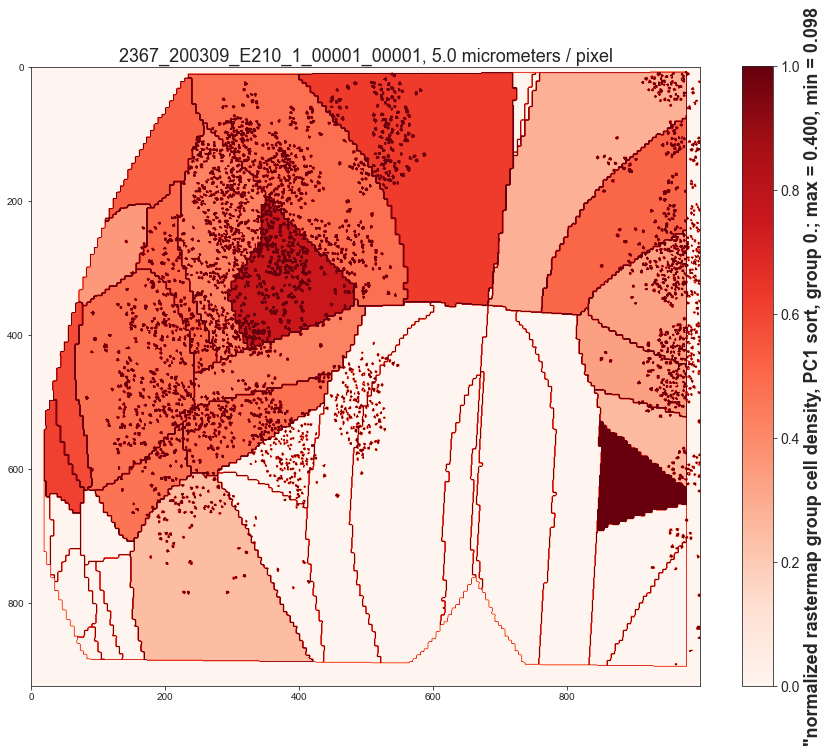

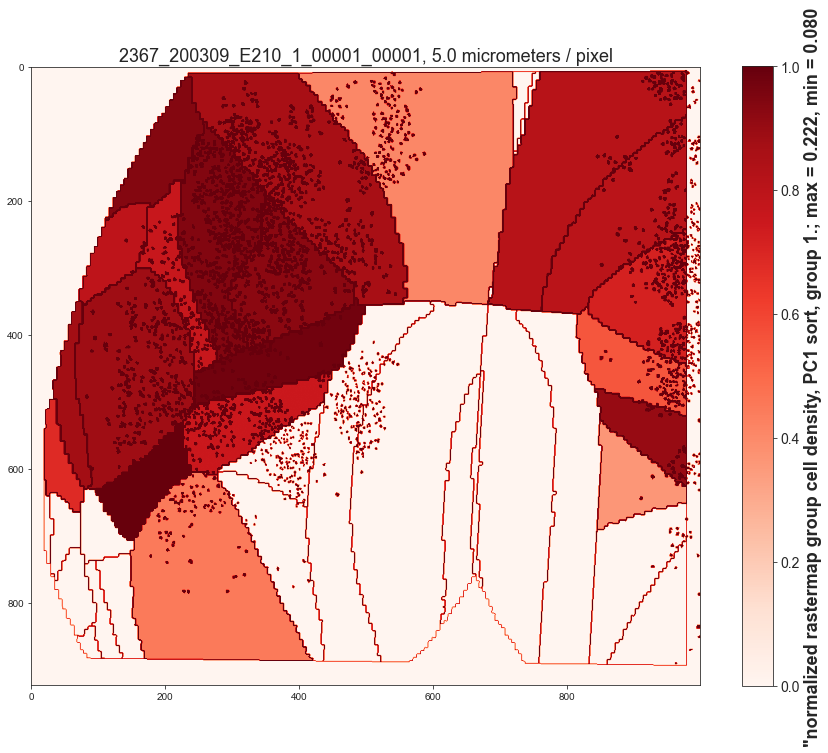

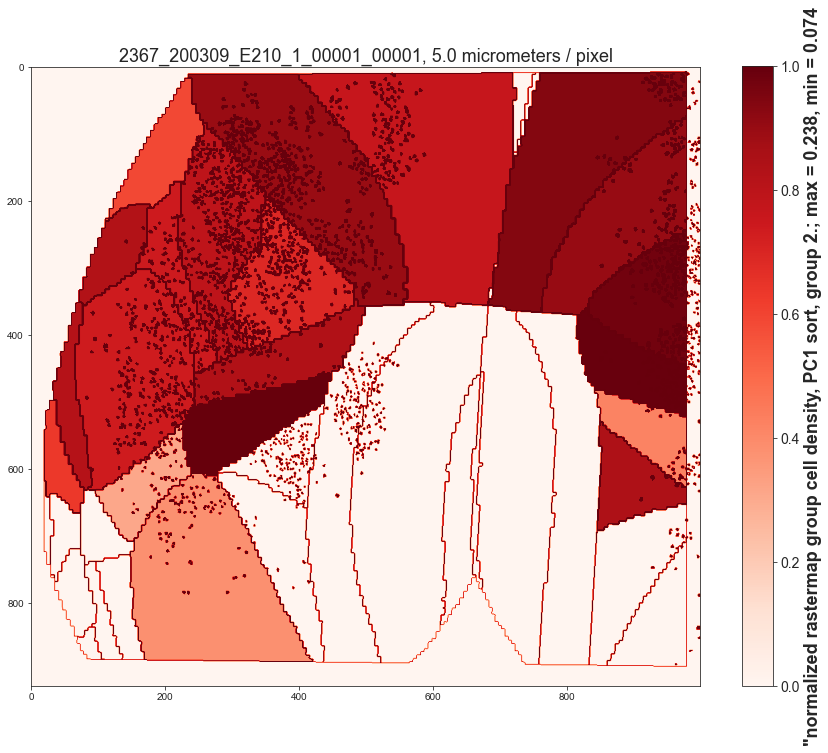

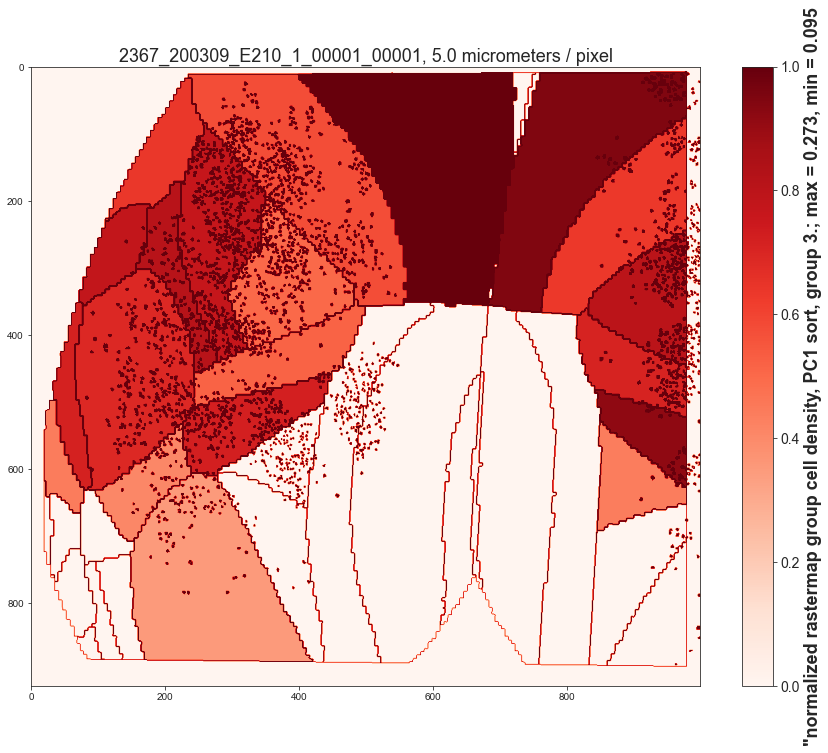

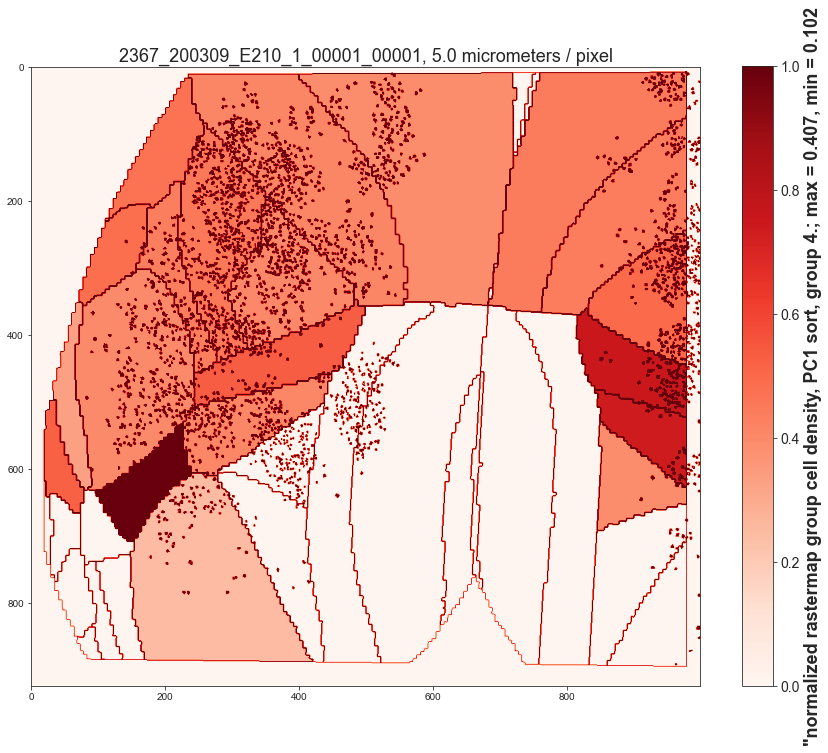

In [44]:
#plot color coded session masks, %cells in each rastermap group per area, PC1 sort only

for z in range(nClusters_PC1):
    im_restrict = np.zeros((ops['Lx'], ops['Ly']))

    for n in range(0,nROIs):
        if iscell[n,0]==1:
            ypix = stat[n]['ypix'][~stat[n]['overlap']]#*res_int
            xpix = stat[n]['xpix'][~stat[n]['overlap']]#*res_int
            if (iscell[n,0] == 1) & (iscell[n,1] > 0.50):
                im_restrict[xpix,ypix] = 1
            else:
                im_restrict[xpix,ypix] = -1

    for i in range(len(im_restrict[:,0])):
        for j in range(len(im_restrict[0,:])):
            if outlines_flat[i,j]>0:
                im_restrict[i,j]=1

    session_masks_rastermap_density_PC1=session_masks.copy()
    im_restrict_masked_rastermap_density_PC1=im_restrict.copy()

    max_corr=-1.01
    min_corr=1.01

    for i in range(len(session_masks[:,0,0])):
        session_masks_rastermap_density_PC1[i,:,:]=session_masks_rastermap_density_PC1[i,:,:]*raster_cell_densities_PC1[i,z]
        if cell_count[i]<20:
            session_masks_rastermap_density_PC1[i,:,:]=0
        if raster_cell_densities_PC1[i,z]>max_corr and cell_count[i]>20:
            max_corr=raster_cell_densities_PC1[i,z]
        if raster_cell_densities_PC1[i,z]<min_corr and cell_count[i]>20:
            min_corr=raster_cell_densities_PC1[i,z]

    for i in range(len(session_masks[:,0,0])):        
        if raster_cell_densities_PC1[i,z]>0:
            session_masks_rastermap_density_PC1[i,:,:]=session_masks_rastermap_density_PC1[i,:,:]/max_corr       
        #if raster_cell_densities[i,z]<0:
        #    session_masks_rastermap_density[i,:,:]=session_masks_rastermap_density[i,:,:]/(-max_corr)

        im_restrict_masked_rastermap_density_PC1=im_restrict_masked_rastermap_density_PC1+session_masks_rastermap_density_PC1[i,:,:]

    print(min_corr)
    print(max_corr)

    set_max=1
    set_min=-1

    colormap='seismic'

    if min_corr>=0:
        set_min=0
        colormap='Reds'

    if max_corr<0:
        set_max=0

    plt.figure(figsize = (15,15))
    plt.imshow(im_restrict_masked_rastermap_density_PC1,vmin=set_min,vmax=set_max,cmap=colormap)
    cbar=plt.colorbar(label="normalized rastermap group cell density, PC1 sort, group "+ str(z) +'.', orientation="vertical",shrink=0.76)
    cbar.ax.tick_params(labelsize=14)

    format_min_corr="{:.3f}".format(min_corr)
    format_max_corr="{:.3f}".format(max_corr)

    cbar.set_label(label='"normalized rastermap group cell density, PC1 sort, group '+ str(z)+'.; max = '+str(format_max_corr)+', min = '+str(format_min_corr),weight='bold',size=18)
    plt.title(fsuffix+", "+str(res_int)+" micrometers / pixel",size=18)
    #plt.text(15, -100, fsuffix)

    plt.savefig(os.path.join(PlotDir,'norm_rastG_dens_PC1_sort_'+str(z)+'_CCF_map_{}.tif'.format(fsuffix)),dpi=300,format='tif')

In [32]:
#where are the real cells (i.e. those that meet our criteria for being real)

iscell_loc=np.zeros((nNeurons),dtype='int')

cell_idx=0

for i in range(nROIs):
    if iscell_bool[i]:
        iscell_loc[cell_idx]=i
        #real_cell[i]=cell_idx
        cell_idx=cell_idx+1

0.028985507246376812
0.12121212121212122
0.037037037037037035
0.14912280701754385
0.04051724137931034
0.14814814814814814
0.0
0.25
0.05660377358490566
0.13690476190476192
0.0
0.12121212121212122
0.09090909090909091
0.32
0.05862068965517241
0.2
0.04929577464788732
0.1320754716981132
[201 300 300 450 300 200 650 400 295]


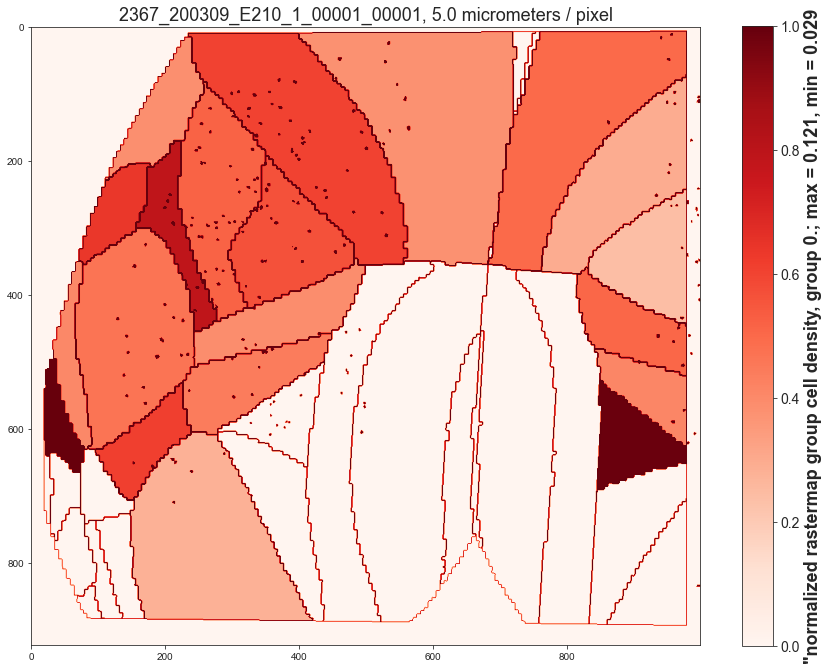

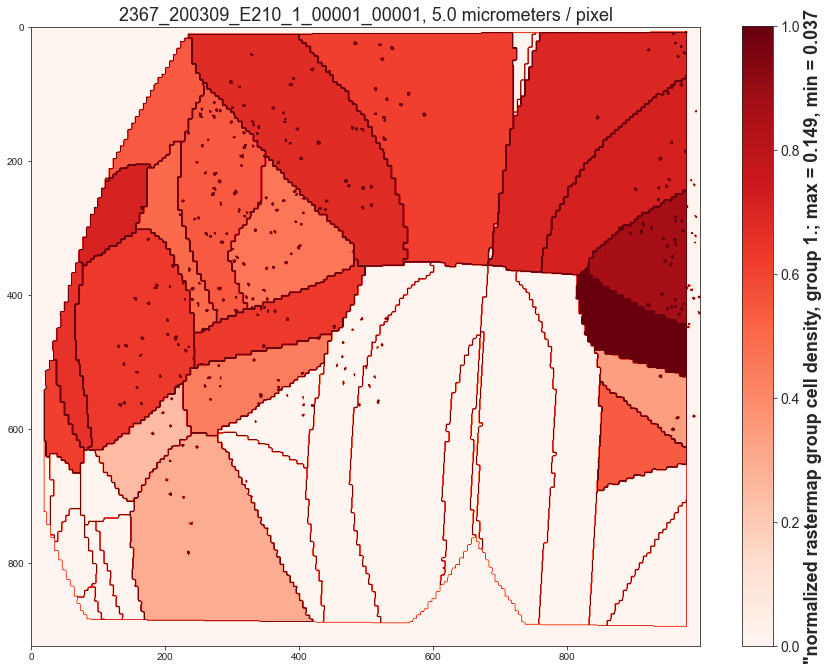

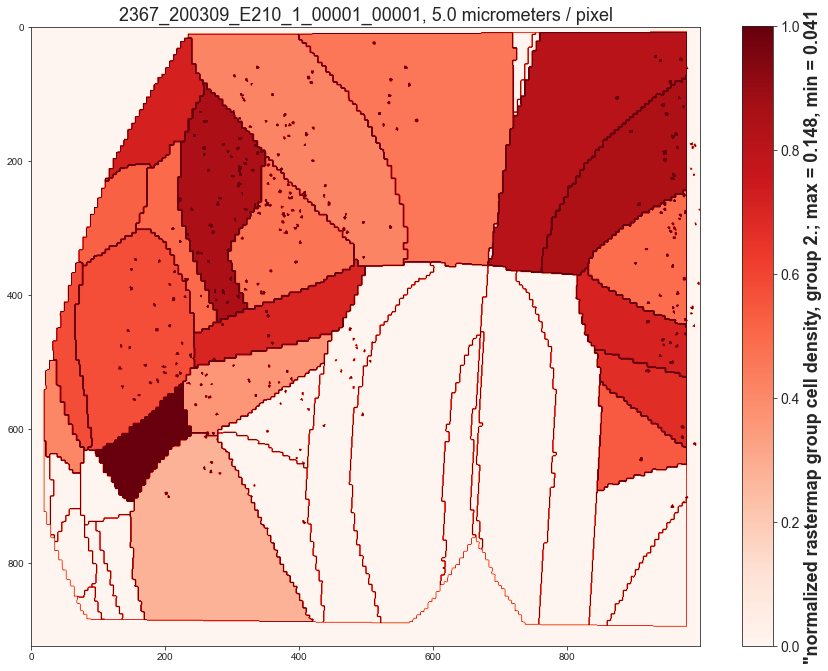

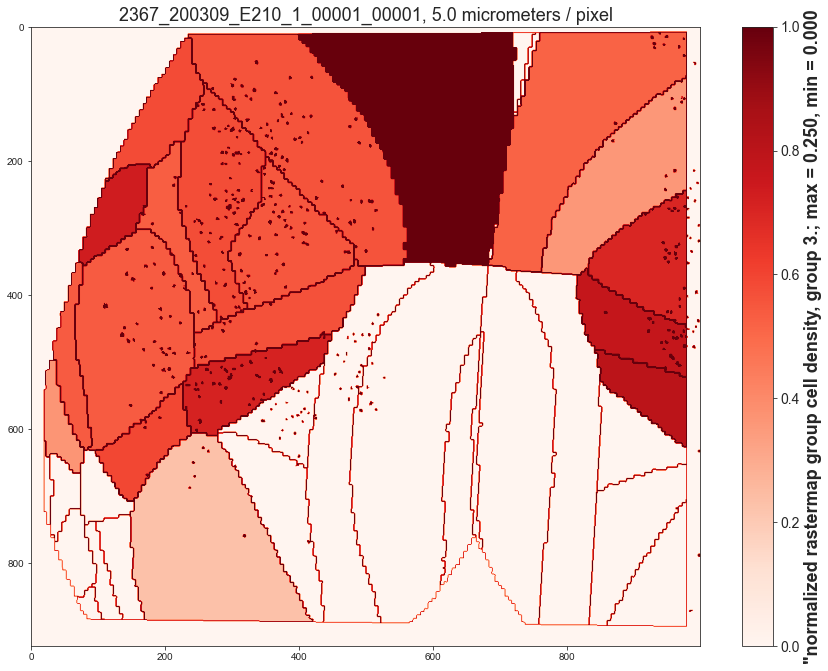

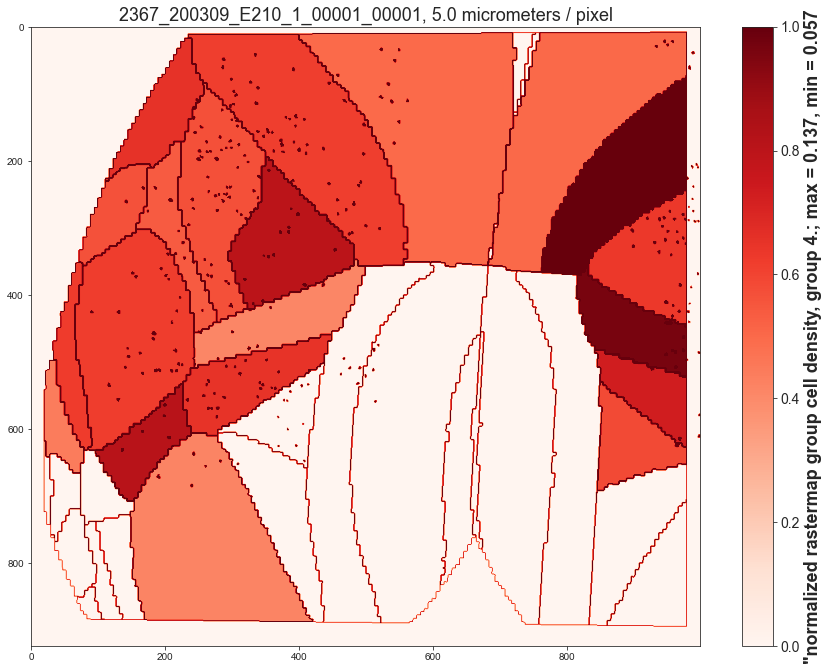

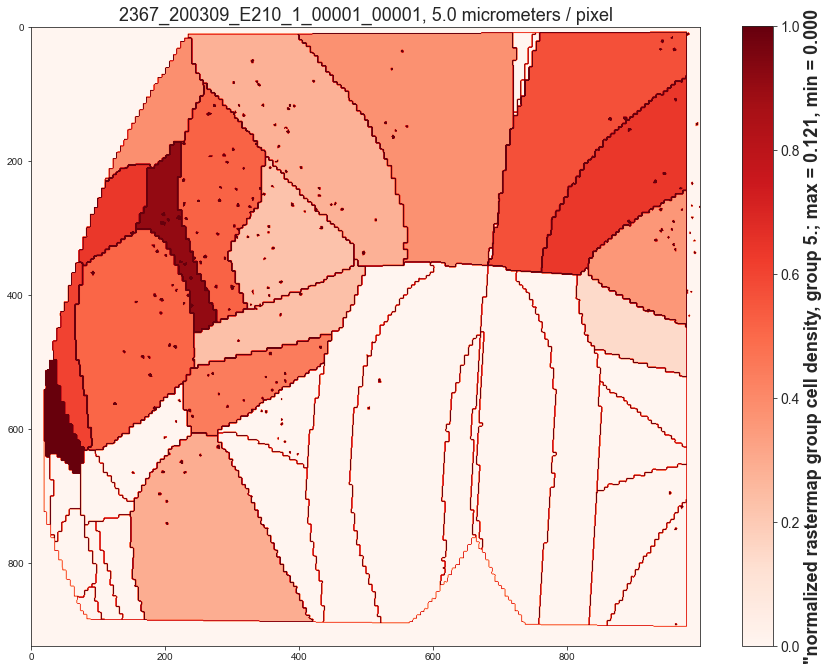

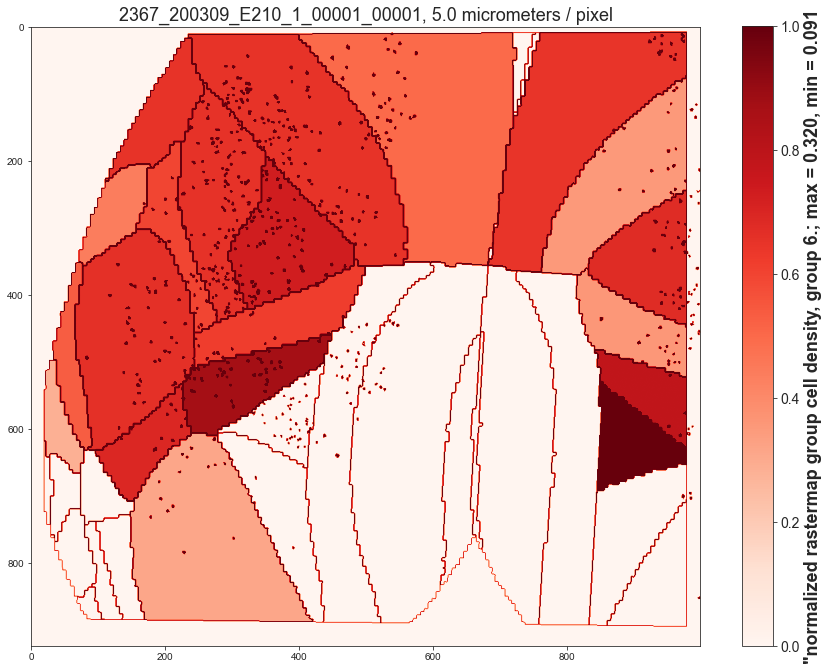

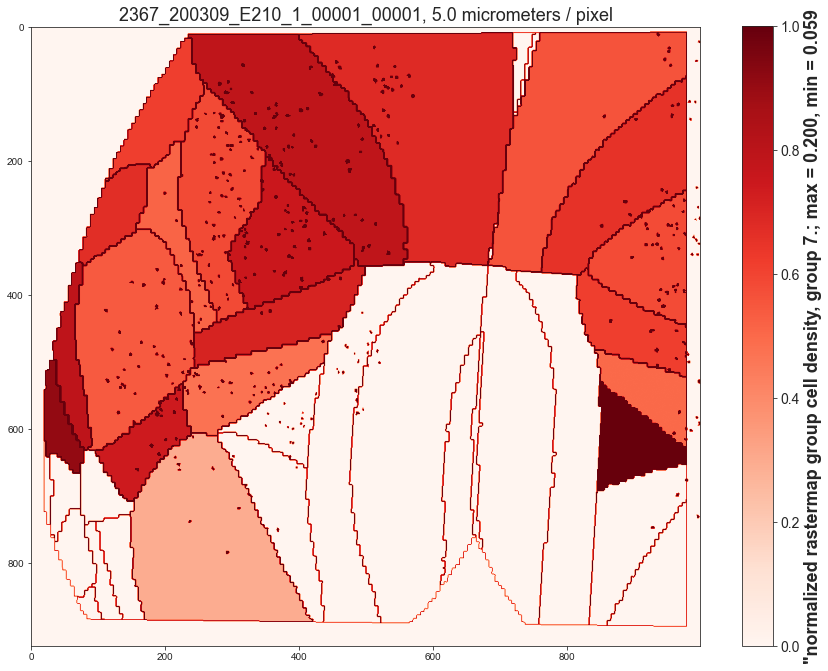

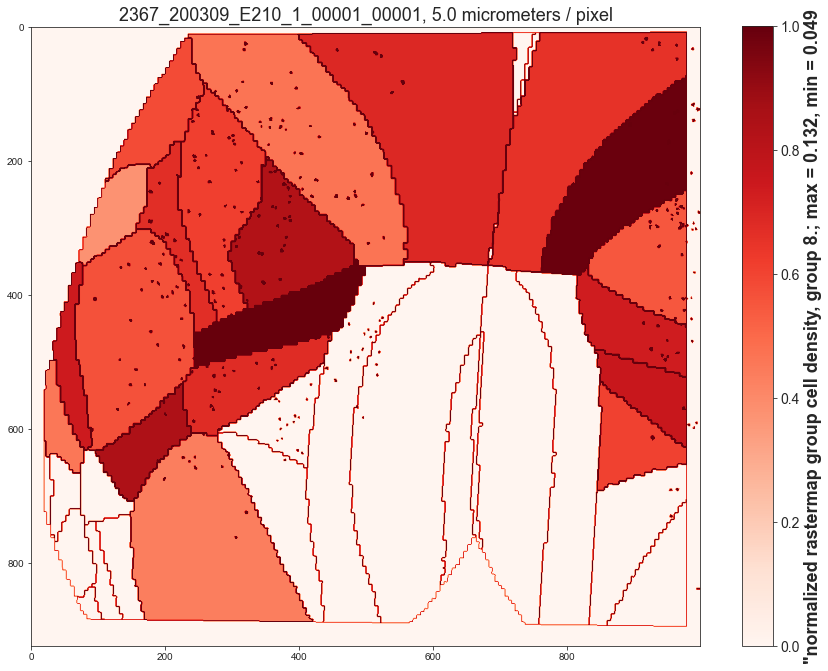

In [33]:
#plot color coded session masks, %cells in each rastermap group per area, show only present cells

cell_count_test=np.zeros(nClusters,dtype='int')

for z in range(nClusters):
    im_restrict = np.zeros((ops['Lx'], ops['Ly']))

    for n in range(0,nROIs):
        if iscell[n,0]==1:
            ypix = stat[n]['ypix'][~stat[n]['overlap']]#*res_int
            xpix = stat[n]['xpix'][~stat[n]['overlap']]#*res_int
            if (iscell[n,0] == 1) & (iscell[n,1] > 0.50):
                for j in range(0,nNeurons):
                    if iscell_loc[j]==n and isort_dfof[j]<=max_range[z] and isort_dfof[j]>=min_range[z]:
                        im_restrict[xpix,ypix] = 1
                        cell_count_test[z]=cell_count_test[z]+1
            else:
                im_restrict[xpix,ypix] = -1

    for i in range(len(im_restrict[:,0])):
        for j in range(len(im_restrict[0,:])):
            if outlines_flat[i,j]>0:
                im_restrict[i,j]=1

    session_masks_rastermap_density=session_masks.copy()
    im_restrict_masked_rastermap_density=im_restrict.copy()

    max_corr=-1.01
    min_corr=1.01

    for i in range(len(session_masks[:,0,0])):
        session_masks_rastermap_density[i,:,:]=session_masks_rastermap_density[i,:,:]*raster_cell_densities[i,z]
        if cell_count[i]<20:
            session_masks_rastermap_density[i,:,:]=0
        if raster_cell_densities[i,z]>max_corr and cell_count[i]>20:
            max_corr=raster_cell_densities[i,z]
        if raster_cell_densities[i,z]<min_corr and cell_count[i]>20:
            min_corr=raster_cell_densities[i,z]

    for i in range(len(session_masks[:,0,0])):        
        if raster_cell_densities[i,z]>0:
            session_masks_rastermap_density[i,:,:]=session_masks_rastermap_density[i,:,:]/max_corr       
        #if raster_cell_densities[i,z]<0:
        #    session_masks_rastermap_density[i,:,:]=session_masks_rastermap_density[i,:,:]/(-max_corr)

        im_restrict_masked_rastermap_density=im_restrict_masked_rastermap_density+session_masks_rastermap_density[i,:,:]

    print(min_corr)
    print(max_corr)

    set_max=1
    set_min=-1

    colormap='seismic'

    if min_corr>=0:
        set_min=0
        colormap='Reds'

    if max_corr<0:
        set_max=0

    plt.figure(figsize = (15,15))
    plt.imshow(im_restrict_masked_rastermap_density,vmin=set_min,vmax=set_max,cmap=colormap)
    cbar=plt.colorbar(label="normalized rastermap group cell density, group "+ str(z) +'.', orientation="vertical",shrink=0.76)
    cbar.ax.tick_params(labelsize=14)

    format_min_corr="{:.3f}".format(min_corr)
    format_max_corr="{:.3f}".format(max_corr)

    cbar.set_label(label='"normalized rastermap group cell density, group '+ str(z)+'.; max = '+str(format_max_corr)+', min = '+str(format_min_corr),weight='bold',size=18)
    plt.title(fsuffix+", "+str(res_int)+" micrometers / pixel",size=18)
    #plt.text(15, -100, fsuffix)

    plt.savefig(os.path.join(PlotDir,'norm_rastG_dens_PRESENT_'+str(z)+'_CCF_map_{}.tif'.format(fsuffix)),dpi=300,format='tif')
    
print(cell_count_test)

0.09827586206896552
0.4
0.08
0.2222222222222222
0.07407407407407407
0.23809523809523808
0.09482758620689655
0.2727272727272727
0.10172413793103448
0.4074074074074074
[620 619 619 619 619]


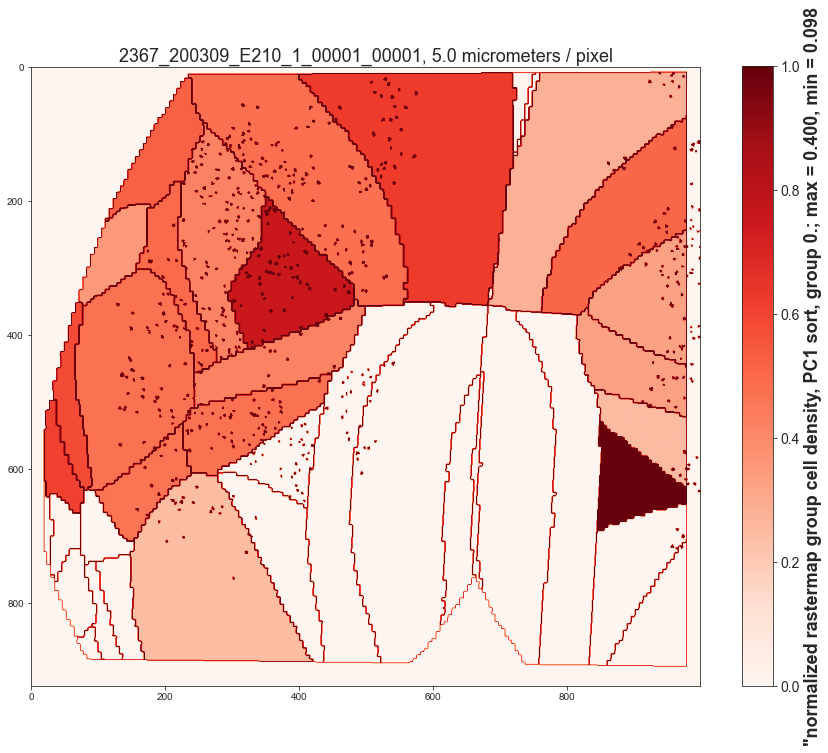

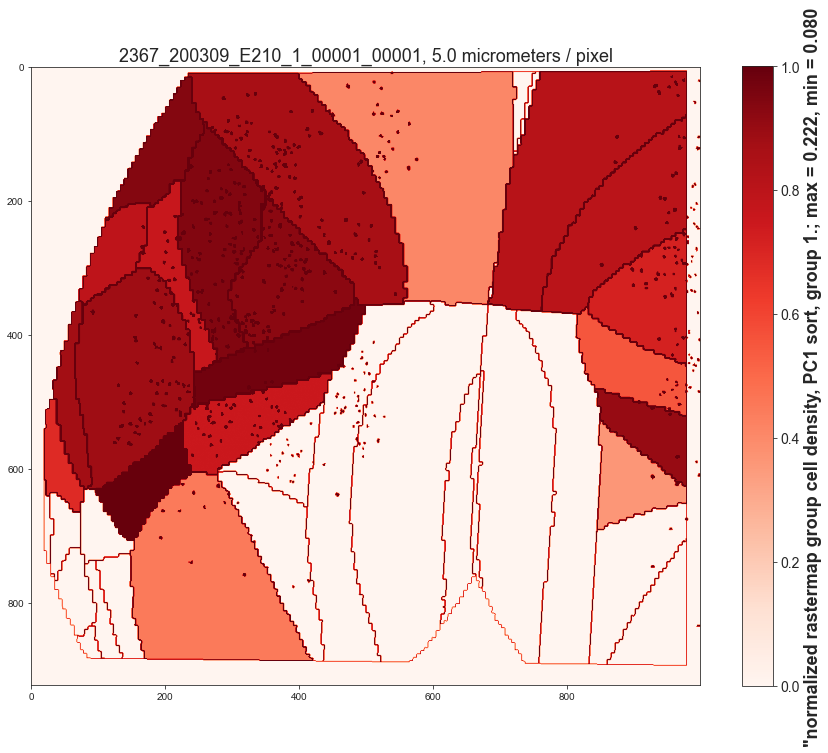

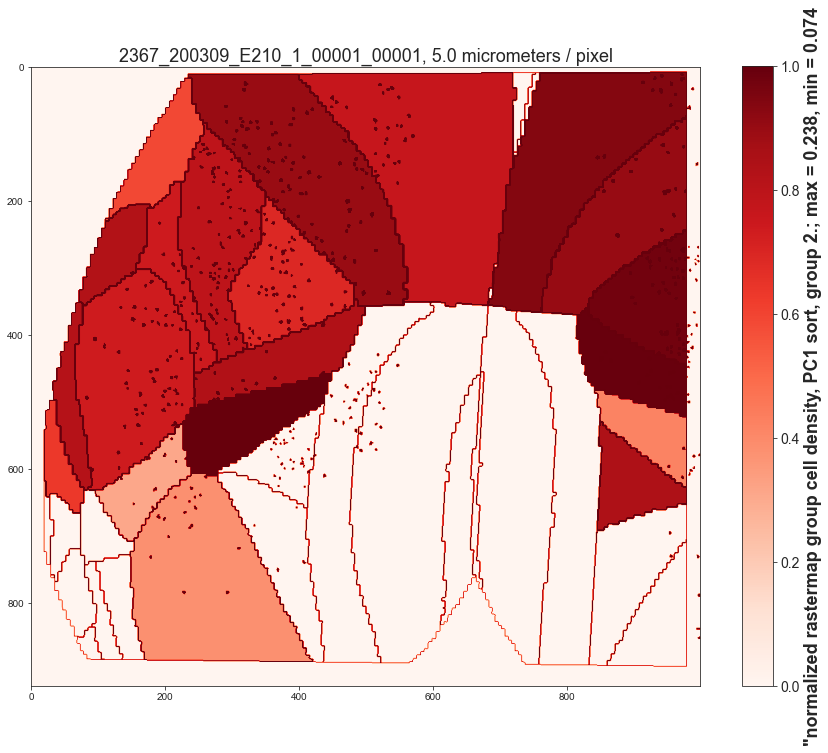

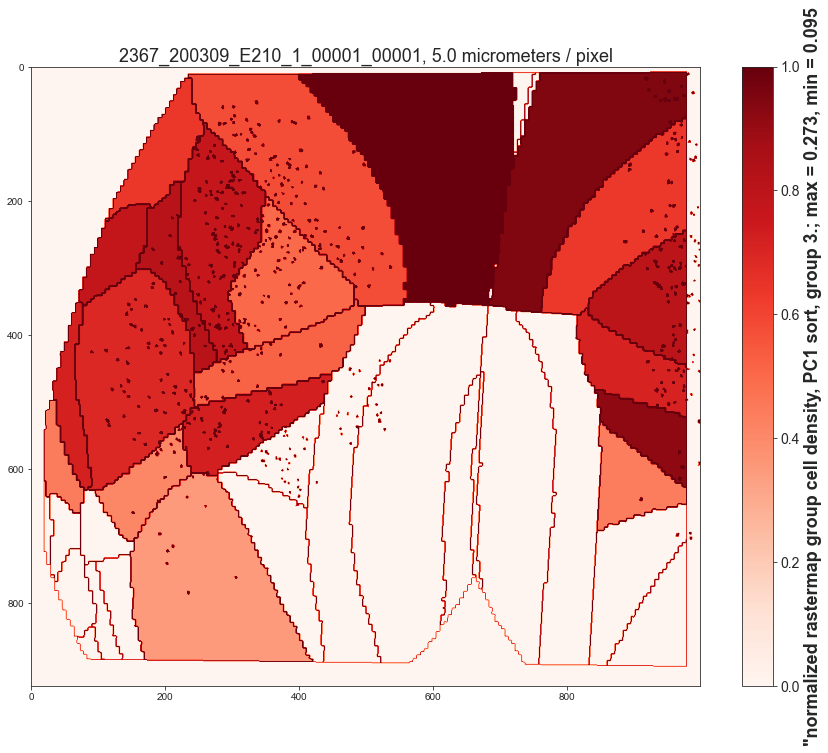

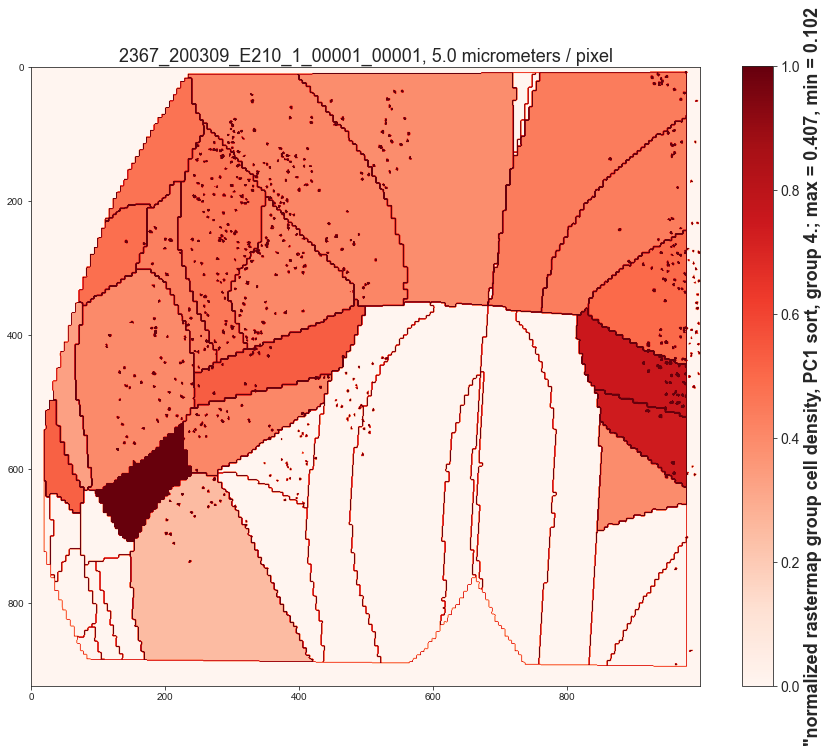

In [45]:
#plot color coded session masks, %cells in each rastermap group per area, PC1 sort only, show only present cells

cell_count_test=np.zeros(nClusters_PC1,dtype='int')
for z in range(nClusters_PC1):
    im_restrict = np.zeros((ops['Lx'], ops['Ly']))

    for n in range(0,nROIs):
        if iscell[n,0]==1:
            ypix = stat[n]['ypix'][~stat[n]['overlap']]#*res_int
            xpix = stat[n]['xpix'][~stat[n]['overlap']]#*res_int
            if (iscell[n,0] == 1) & (iscell[n,1] > 0.50):
                for j in range(0,nNeurons):
                    if iscell_loc[j]==n and isort_dfof_pca1[j]<=max_range_PC1[z] and isort_dfof_pca1[j]>=min_range_PC1[z]:
                        im_restrict[xpix,ypix] = 1
                        cell_count_test[z]=cell_count_test[z]+1
            else:
                im_restrict[xpix,ypix] = -1

    for i in range(len(im_restrict[:,0])):
        for j in range(len(im_restrict[0,:])):
            if outlines_flat[i,j]>0:
                im_restrict[i,j]=1

    session_masks_rastermap_density_PC1=session_masks.copy()
    im_restrict_masked_rastermap_density_PC1=im_restrict.copy()

    max_corr=-1.01
    min_corr=1.01

    for i in range(len(session_masks[:,0,0])):
        session_masks_rastermap_density_PC1[i,:,:]=session_masks_rastermap_density_PC1[i,:,:]*raster_cell_densities_PC1[i,z]
        if cell_count[i]<20:
            session_masks_rastermap_density_PC1[i,:,:]=0
        if raster_cell_densities_PC1[i,z]>max_corr and cell_count[i]>20:
            max_corr=raster_cell_densities_PC1[i,z]
        if raster_cell_densities_PC1[i,z]<min_corr and cell_count[i]>20:
            min_corr=raster_cell_densities_PC1[i,z]

    for i in range(len(session_masks[:,0,0])):        
        if raster_cell_densities_PC1[i,z]>0:
            session_masks_rastermap_density_PC1[i,:,:]=session_masks_rastermap_density_PC1[i,:,:]/max_corr       
        #if raster_cell_densities[i,z]<0:
        #    session_masks_rastermap_density[i,:,:]=session_masks_rastermap_density[i,:,:]/(-max_corr)

        im_restrict_masked_rastermap_density_PC1=im_restrict_masked_rastermap_density_PC1+session_masks_rastermap_density_PC1[i,:,:]

    print(min_corr)
    print(max_corr)

    set_max=1
    set_min=-1

    colormap='seismic'

    if min_corr>=0:
        set_min=0
        colormap='Reds'

    if max_corr<0:
        set_max=0

    plt.figure(figsize = (15,15))
    plt.imshow(im_restrict_masked_rastermap_density_PC1,vmin=set_min,vmax=set_max,cmap=colormap)
    cbar=plt.colorbar(label="normalized rastermap group cell density, PC1 sort, group "+ str(z) +'.', orientation="vertical",shrink=0.76)
    cbar.ax.tick_params(labelsize=14)

    format_min_corr="{:.3f}".format(min_corr)
    format_max_corr="{:.3f}".format(max_corr)

    cbar.set_label(label='"normalized rastermap group cell density, PC1 sort, group '+ str(z)+'.; max = '+str(format_max_corr)+', min = '+str(format_min_corr),weight='bold',size=18)
    plt.title(fsuffix+", "+str(res_int)+" micrometers / pixel",size=18)
    #plt.text(15, -100, fsuffix)

    plt.savefig(os.path.join(PlotDir,'norm_rastG_dens_PC1_sort_PRESENT'+str(z)+'_CCF_map_{}.tif'.format(fsuffix)),dpi=300,format='tif')
    
print(cell_count_test)

In [81]:
### calculate mean dfof_z traces, split by rastermap group

import numpy as np
raster_mean_traces=np.zeros((nClusters,dfof.shape[1]),dtype='float')
nClust_cell_count=np.zeros((nClusters),dtype='int')
isort_rastergroup=isort_dfof.copy()

for z in range(nClusters):
    for i in range(nNeurons):
        if isort_dfof[i]>=min_range[z] and isort_dfof[i]<=max_range[z]:
            nClust_cell_count[z]=nClust_cell_count[z]+1
            isort_rastergroup[i]=z
            
print(nClust_cell_count)

for z in range(nClusters):
    for i in range(nNeurons):
        if isort_dfof[i]==z:
            raster_mean_traces[z,:]=raster_mean_traces[z,:]+dfof_z[i,:]
    raster_mean_traces[z,:]=raster_mean_traces[z,:]/nClust_cell_count[z]  

[301 350 150 200 400 650 450 250 350 331]


In [84]:
### calculate mean dfof_z traces, split by PC1

import numpy as np
raster_mean_traces_PC1=np.zeros((nClusters_PC1,dfof.shape[1]),dtype='float')
nClust_cell_count_PC1=np.zeros((nClusters_PC1),dtype='int')
isort_rastergroup_PC1=isort_dfof_pca1.copy()

for z in range(nClusters_PC1):
    for i in range(nNeurons):
        if isort_dfof_pca1[i]>=min_range_PC1[z] and isort_dfof_pca1[i]<=max_range_PC1[z]:
            nClust_cell_count_PC1[z]=nClust_cell_count_PC1[z]+1
            isort_rastergroup_PC1[i]=z
            
print(nClust_cell_count_PC1)

for z in range(nClusters_PC1):
    for i in range(nNeurons):
        if isort_dfof_pca1[i]==z:
            raster_mean_traces_PC1[z,:]=raster_mean_traces_PC1[z,:]+dfof_z[i,:]
    raster_mean_traces_PC1[z,:]=raster_mean_traces_PC1[z,:]/nClust_cell_count_PC1[z]  

[859 858 858 857]


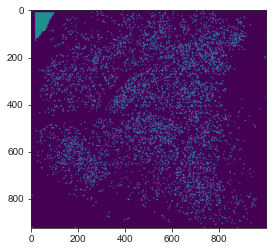

In [466]:
#test: show r_MOs (M2)

im=im+session_masks[44,:,:]
plt.figure()
plt.imshow(im,cmap='viridis')

What is the resolution, in micrometers per pixel: 5


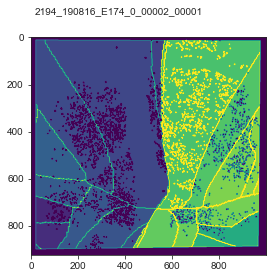

In [89]:
#color coded session masks, trial run

res_int = float(input("What is the resolution, in micrometers per pixel:"))

im_restrict = np.zeros((ops['Lx'], ops['Ly']))

for n in range(0,nROIs):
    if iscell[n,0]==1:
        ypix = stat[n]['ypix'][~stat[n]['overlap']]#*res_int
        xpix = stat[n]['xpix'][~stat[n]['overlap']]#*res_int
        if (iscell[n,0] == 1) & (iscell[n,1] > 0.50) & (iscell_masks[n] == area_num):
            im_restrict[xpix,ypix] = 1
        else:
            im_restrict[xpix,ypix] = -1

#fig, ax = plt.subplots(figsize=(8,8))
#sns.heatmap(im,ax=ax,cmap='RdBu_r',center=0,cbar=False)#,color_continuous_scale='RdBu_r')
#plt.title(fsuffix+","+str(np.count_nonzero(iscell[:,0]))+" cells")
#print(im.shape)

#plt.imsave(os.path.join(PlotDir,'neural-location_real_'+areas[area_num]+'_{}.png'.format(fsuffix)),im)

#ax.axis('off')
#plt.savefig(os.path.join(PlotDir,'neural-location_'+areas[area_num]+'_{}.png'.format(fsuffix)))

#im_restrict_masked=im_restrict+session_masks[area_num,:,:]+outlines[area_num,:,:]
for i in range(len(im_restrict[:,0])):
    for j in range(len(im_restrict[0,:])):
        if outlines_flat[i,j]>0:
            im_restrict[i,j]=1
            
session_masks_coded=session_masks.copy()
im_restrict_masked_coded=im_restrict.copy()

for i in range(len(session_masks[:,0,0])):
    session_masks_coded[i,:,:]=session_masks_coded[i,:,:]*((i+0.1)/62)
    #print(((i+0.1)/62))
    im_restrict_masked_coded=im_restrict_masked_coded+session_masks_coded[i,:,:]

cell_count=np.zeros(62,dtype='int')

for i in range(len(iscell_masks)):
    cell_count[int(iscell_masks[i])]=cell_count[int(iscell_masks[i])]+1

#plt.figure()
#plt.imshow(im_restrict,cmap='viridis')
#plt.title(selected_area+", "+str(cell_count[area_num])+" cells")

plt.figure()
plt.imshow(im_restrict_masked_coded,vmin=0,vmax=1,cmap='viridis')
#plt.title(selected_area+", "+str(cell_count[area_num])+"/"+str(np.count_nonzero(iscell[:,0]))+" cells, "+str(res_int)+" micrometers / pixel")
plt.text(15, -100, fsuffix)

plt.savefig(os.path.join(PlotDir,'neural-location_'+areas[area_num]+'_{}_masked_coded.png'.format(fsuffix)))

In [ ]:
#The following cells provide various options for saving variables loaded and created in the current notebook, for later reloading in this and subsequent preprocessing notebooks

In [33]:
#save arrays only (numpy)

import time
timestr = time.strftime("%Y%m%d-%H%M%S")
print(timestr)
save_filename_arrays_npy=PlotDir+'\\nb_arrays_'+fsuffix+'_'+timestr+'.npy'
print(save_filename_arrays_npy)

save_array_dict= {'behav_dict_aligned':behav_dict_aligned,'behav_dict':behav_dict,'F': F, 'F_sub':F_sub, 'Fneu':Fneu, 'areas':areas, 'ccf_image':ccf_image, 'ccf_points':ccf_points, 'cell_count':cell_count, \
                  'cmap':cmap, 'dfof':dfof, 'dfof_transform':dfof_transform, 'dfof_z':dfof_z, 'events':events, 'events_binary':events_binary, 'fluorescence':fluorescence, 'im':im, 'im_restrict':im_restrict, \
                  'im_restrict_masked_coded':im_restrict_masked_coded, 'iscell':iscell, 'iscell_bool':iscell_bool, 'iscell_masks':iscell_masks, 'isort':isort, 'isort_dfof':isort_dfof, 'mask':mask, 'masks':masks, \
                  'mmm_image':mmm_image, 'mmm_mask':mmm_mask, 'mmm_masks':mmm_masks, 'mmm_points':mmm_points, 'neuropil':neuropil, 'outlines':outlines, 'outlines_flat':outlines_flat, 'session_mask':session_mask, \
                  'session_masks':session_masks, 'session_masks_coded':session_masks_coded, 'session_mmm_points':session_mmm_points, 'session_vessel_points':session_vessel_points, 'spks':spks, 'spks_z':spks_z, \
                  'splot':splot, 'stat':stat, 'vessel_image':vessel_image, 'vessel_outlines':vessel_outlines, 'vessel_outlines_swap':vessel_outlines_swap, 'xyloc':xyloc}
save_array_arr=np.array(save_array_dict)
np.save(save_filename_arrays_npy,save_array_arr)

20230331-121940
G:\uobrainflex_analysis_2022\2367_200320_E210_1_00002_00001\nb_arrays_2367_200320_E210_1_00002_00001_20230331-121940.npy


In [37]:
#save ALL old (numpy)

import time
timestr = time.strftime("%Y%m%d-%H%M%S")
print(timestr)
save_all_filename_npy=PlotDir+'\\nb_dump_'+fsuffix+'_'+timestr+'.npy'
print(save_all_filename_npy)

save_all_dict={'stat_sub':stat_sub,'plotslice':plotslice,'nT_plot':nT_plot,'brate':brate,'m_crash':m_crash,'lv_crash':lv_crash,'resamp_rate':resamp_rate,'ops':ops,'BehaviorDir': BehaviorDir, 'F': F, \
               'F_sub ':F_sub, 'Fneu':Fneu, 'N':N, 'PlotDir':PlotDir, 'ProcDataDir':ProcDataDir, 'RawDataDir':RawDataDir, 'SI_path':SI_path, 'T':T, 'area_num':area_num, 'areas':areas, \
               'areas_filepath':areas_filepath, 'ccf_dir':ccf_dir, 'ccf_file_path':ccf_file_path, 'ccf_image':ccf_image, 'ccf_points':ccf_points, 'ccf_points_filepath':ccf_points_filepath, \
               'ccf_title':ccf_title, 'cell_count':cell_count, 'cmap':cmap, 'color':color, 'dfof':dfof, 'dfof_transform':dfof_transform, 'dfof_z':dfof_z, 'events':events, 'events_binary':events_binary, \
               'fluorescence':fluorescence, 'framerate':framerate, 'fs':fs, 'fsuffix':fsuffix, 'i':i, 'iCell':iCell, 'im':im, 'im_restrict':im_restrict, 'im_restrict_masked_coded':im_restrict_masked_coded, \
               'iscell':iscell, 'iscell_bool':iscell_bool, 'iscell_masks':iscell_masks, 'iscell_masks_cell':iscell_masks_cell,'isort':isort, 'isort_dfof':isort_dfof, 'j':j, 'mask':mask, 'masks':masks, \
               'masks_filepath':masks_filepath, 'mmm_dir':mmm_dir, 'mmm_image':mmm_image, 'mmm_image_path':mmm_image_path, 'mmm_mask':mmm_mask, 'mmm_masks':mmm_masks, 'mmm_points':mmm_points, \
               'mmm_points_filepath':mmm_points_filepath, 'mmm_title':mmm_title, 'n':n, 'nNeurons':nNeurons, 'nROIs':nROIs, 'nT_plot':nT_plot, 'neuropil':neuropil, 'newfolders':newfolders, 'outlines':outlines, \
               'outlines_flat':outlines_flat, 'repeat_align':repeat_align, 'res_int':res_int, 'save_folder':save_folder, 'selected_area':selected_area, 'session_folder':session_folder, 'session_mask':session_mask, \
               'session_masks':session_masks, 'session_masks_coded':session_masks_coded, 'session_mmm_points':session_mmm_points, 'session_title':session_title, 'session_vessel_points':session_vessel_points, \
               'session_vessels_path':session_vessels_path, 'spks':spks, 'spks_z':spks_z, 'splot':splot, 'stat':stat, 'subject':subject, 'subject_folder':subject_folder, 'subject_title':subject_title, \
               'tStart':tStart, 'timestr':timestr, 'vessel_image':vessel_image, 'vessel_outlines':vessel_outlines, 'vessel_outlines_swap':vessel_outlines_swap, 'xpix':xpix, 'xyloc':xyloc, 'ypix':ypix, \
               'dfof_transform':dfof_transform, 'pca':pca, 'Spike2_exist':Spike2_exist,'stat_sub':stat_sub,'plotslice':plotslice,'ROI_num':ROI_num,'fl_cam_exist':fl_cam_exist}
save_all_arr=np.array(save_all_dict)
np.save(save_all_filename_npy,save_all_arr)

20230331-122215
G:\uobrainflex_analysis_2022\2367_200320_E210_1_00002_00001\nb_dump_2367_200320_E210_1_00002_00001_20230331-122215.npy


In [38]:
#save NWB relevant series,resample,truncate,frames,combined frames (npy)

import time
timestr = time.strftime("%Y%m%d-%H%M%S")
print(timestr)
save_filename_nwb_npy=PlotDir+'\\nwb_'+fsuffix+'_'+timestr+'.npy'
print(save_filename_nwb_npy)

if lv_crash.lower()=='yes' and m_crash.lower()!='yes':
    save_nwb_dict= {'behav_ser_dict':behav_ser_dict,'behav_ser_keys':behav_ser_keys,'dur':dur,'dur_extra':dur_extra,'dur_excess':dur_excess,'dur_extra_behav':dur_extra_behav,'rpup_trunc':rpup_trunc,'lpup_trunc':lpup_trunc,'ppl_num':ppl_num,'ppl_t':ppl_t,'behav_num':behav_num,'behav_t':behav_t,'meso_num':meso_num,'meso_t':meso_t,'dfof_trans':dfof_trans,'dfof_trans_frame':dfof_trans_frame,'dfof_frame':dfof_frame,'dfof_z_trans':dfof_z_trans,'dfof_z_trans_frame':dfof_z_trans_frame,'dfof_z_frame':dfof_z_frame,'dwn_samp':dwn_samp,'ppl_dwn_samp':ppl_dwn_samp,'sound_dwn_samp':sound_dwn_samp,'behav_ser_dict_resamp':behav_ser_dict_resamp,'behav_ser_dict_trunc':behav_ser_dict_trunc,'dfof_trunc':dfof_trunc,'dfof_z':dfof_z,'dfof_upsamp':dfof_upsamp,'dfof_z_upsamp':dfof_z_upsamp,'dfof_upsamp_frame':dfof_upsamp_frame,'dfof_z_upsamp_frame':dfof_z_upsamp_frame,'dfof_rect_frame':dfof_rect_frame,'dfof_z_rect_frame':dfof_z_rect_frame,'dfof_upsamp_min':dfof_upsamp_min,'dfof_norm_frame':dfof_norm_frame,'dfof_z_norm_frame':dfof_z_norm_frame,'behav_resamp_frame':behav_resamp_frame,'behav_2P_comb_frame':behav_2P_comb_frame,'behav_2P_z_comb_frame':behav_2P_z_comb_frame,'behav_2P_rect_comb_frame':behav_2P_rect_comb_frame,'behav_2P_z_rect_comb_frame':behav_2P_z_rect_comb_frame,'behav_2P_norm_comb_frame':behav_2P_norm_comb_frame}
    save_nwb_arr=np.array(save_nwb_dict)
    np.save(save_filename_nwb_npy,save_nwb_arr)
else:    
    save_nwb_dict={'behav_ser_dict':behav_ser_dict,'behav_ser_keys':behav_ser_keys,'dur':dur,'dur_extra':dur_extra,'dur_excess':dur_excess,'dur_extra_behav':dur_extra_behav,'rpup_trunc':rpup_trunc,'lpup_trunc':lpup_trunc,'ppl_num':ppl_num,'ppl_t':ppl_t,'behav_num':behav_num,'behav_t':behav_t,'meso_num':meso_num,'meso_t':meso_t,'dfof_trans':dfof_trans,'dfof_trans_frame':dfof_trans_frame,'dfof_frame':dfof_frame,'dfof_z_trans':dfof_z_trans,'dfof_z_trans_frame':dfof_z_trans_frame,'dfof_z_frame':dfof_z_frame,'dwn_samp':dwn_samp,'ppl_dwn_samp':ppl_dwn_samp,'sound_dwn_samp':sound_dwn_samp,'behav_ser_dict_resamp':behav_ser_dict_resamp,'behav_ser_dict_trunc':behav_ser_dict_trunc,'dfof_z':dfof_z,'dfof_upsamp':dfof_upsamp,'dfof_z_upsamp':dfof_z_upsamp,'dfof_upsamp_frame':dfof_upsamp_frame,'dfof_z_upsamp_frame':dfof_z_upsamp_frame,'dfof_rect_frame':dfof_rect_frame,'dfof_z_rect_frame':dfof_z_rect_frame,'dfof_upsamp_min':dfof_upsamp_min,'dfof_norm_frame':dfof_norm_frame,'dfof_z_norm_frame':dfof_z_norm_frame,'behav_resamp_frame':behav_resamp_frame,'behav_2P_comb_frame':behav_2P_comb_frame,'behav_2P_z_comb_frame':behav_2P_z_comb_frame,'behav_2P_rect_comb_frame':behav_2P_rect_comb_frame,'behav_2P_z_rect_comb_frame':behav_2P_z_rect_comb_frame,'behav_2P_norm_comb_frame':behav_2P_norm_comb_frame}
    save_nwb_arr=np.array(save_nwb_dict)
    np.save(save_filename_nwb_npy,save_nwb_arr)

20230331-122333
G:\uobrainflex_analysis_2022\2367_200320_E210_1_00002_00001\nwb_2367_200320_E210_1_00002_00001_20230331-122333.npy


In [39]:
#save behav dict unaligned and aligned (npy)

def getList(dict):
      
    return [*dict]

behav_dict_aligned_keys = list(behav_dict_aligned)
for i in range(len(getList(behav_dict_aligned))):
    print(behav_dict_aligned_keys[i])
    
print('')

behav_dict_keys = list(behav_dict)
for i in range(len(getList(behav_dict))):
    print(behav_dict_keys[i])
    
import time
timestr = time.strftime("%Y%m%d-%H%M%S")
#print(timestr)
save_filename_behav_dict_npy=PlotDir+'\\behav_dict_'+fsuffix+'_'+timestr+'.npy'
#print(save_filename_behav_dict_mat)

save_behav_dict={behav_dict_keys[0]:behav_dict[getList(behav_dict)[0]],behav_dict_keys[1]:behav_dict[getList(behav_dict)[1]],behav_dict_keys[2]:behav_dict[getList(behav_dict)[2]],behav_dict_keys[3]:behav_dict[getList(behav_dict)[3]],behav_dict_keys[4]:behav_dict[getList(behav_dict)[4]],behav_dict_keys[5]:behav_dict[getList(behav_dict)[5]],behav_dict_keys[6]:behav_dict[getList(behav_dict)[6]],behav_dict_keys[7]:behav_dict[getList(behav_dict)[7]],behav_dict_keys[8]:behav_dict[getList(behav_dict)[8]],behav_dict_keys[9]:behav_dict[getList(behav_dict)[9]],behav_dict_keys[10]:behav_dict[getList(behav_dict)[10]],behav_dict_keys[11]:behav_dict[getList(behav_dict)[11]],behav_dict_keys[12]:behav_dict[getList(behav_dict)[12]],behav_dict_keys[13]:behav_dict[getList(behav_dict)[13]]}
save_behav_dict_arr=np.array(save_behav_dict)
np.save(save_filename_behav_dict_npy,save_behav_dict_arr)

import time
timestr = time.strftime("%Y%m%d-%H%M%S")
#print(timestr)
save_filename_behav_dict_aligned_npy=PlotDir+'\\behav_dict_aligned_'+fsuffix+'_'+timestr+'.npy'
#print(save_filename_behav_dict_aligned_mat)

save_behav_dict_aligned={behav_dict_aligned_keys[0]:behav_dict_aligned[getList(behav_dict_aligned)[0]],behav_dict_aligned_keys[1]:behav_dict_aligned[getList(behav_dict_aligned)[1]],behav_dict_aligned_keys[2]:behav_dict_aligned[getList(behav_dict_aligned)[2]],behav_dict_aligned_keys[3]:behav_dict_aligned[getList(behav_dict_aligned)[3]],behav_dict_aligned_keys[4]:behav_dict_aligned[getList(behav_dict_aligned)[4]],behav_dict_aligned_keys[5]:behav_dict_aligned[getList(behav_dict_aligned)[5]],behav_dict_aligned_keys[6]:behav_dict_aligned[getList(behav_dict_aligned)[6]],behav_dict_aligned_keys[7]:behav_dict_aligned[getList(behav_dict_aligned)[7]],behav_dict_aligned_keys[8]:behav_dict_aligned[getList(behav_dict_aligned)[8]],behav_dict_aligned_keys[9]:behav_dict_aligned[getList(behav_dict_aligned)[9]],behav_dict_aligned_keys[10]:behav_dict_aligned[getList(behav_dict_aligned)[10]],behav_dict_aligned_keys[11]:behav_dict_aligned[getList(behav_dict_aligned)[11]],behav_dict_aligned_keys[12]:behav_dict_aligned[getList(behav_dict_aligned)[12]],behav_dict_aligned_keys[13]:behav_dict_aligned[getList(behav_dict_aligned)[13]]}
save_behav_dict_aligned_arr=np.array(save_behav_dict_aligned)
np.save(save_filename_behav_dict_aligned_npy,save_behav_dict_aligned_arr)

fr_cl_2p
lft_ex
lft_ppl
lft_whisk
lpup_fc
p_diode
rpup_fc
rt_ex
rt_ppl
rt_whisk
sound
walk
SI_tstamp_2p
lick
piezo_co
fl_cam
ni_pzo

fr_cl_2p
lft_ex
lft_ppl
lft_whisk
lpup_fc
p_diode
rpup_fc
rt_ex
rt_ppl
rt_whisk
sound
walk
SI_tstamp_2p
lick
piezo_co
fl_cam
ni_pzo


In [40]:
#save rastermap stuff (numpy)

import time
timestr = time.strftime("%Y%m%d-%H%M%S")
print(timestr)
save_filename_rastermap_npy=PlotDir+'\\rastermap_'+fsuffix+'_'+timestr+'.npy'
print(save_filename_rastermap_npy)

save_array_dict= {'y_pred':y_pred,'isort_dfof':isort_dfof,'isort_dfof_raw':isort_dfof_raw, 'isort':isort, 'isort_dfof_pca1':isort_dfof_pca1,'plotslice':plotslice,'isort_dfof_kmeans':isort_dfof_kmeans,'nClusters':nClusters, 'nClusters_PC1':nClusters_PC1, 'min_range':min_range,'max_range':max_range, \
                  'min_range_PC1':min_range_PC1, 'max_range_PC1':max_range_PC1, 'areas_rastermap_density':areas_rastermap_density, 'areas_rastermap_density_PC1':areas_rastermap_density_PC1,\
                  'raster_cell_count':raster_cell_count,'raster_cell_count_PC1':raster_cell_count_PC1,'raster_cell_densities':raster_cell_densities, 'raster_cell_densities_PC1':raster_cell_densities_PC1, 'session_masks_rastermap_density':session_masks_rastermap_density, \
                  'session_masks_rastermap_density_PC1':session_masks_rastermap_density_PC1, 'im_restrict_masked_rastermap_density':im_restrict_masked_rastermap_density, 'im_restrict_masked_rastermap_density_PC1':im_restrict_masked_rastermap_density_PC1,\
                  'kernel_size':kernel_size,'kernel':kernel,'raster_mean_traces':raster_mean_traces, 'raster_mean_traces_PC1':raster_mean_traces_PC1, 'raster_mean_traces_convolved':raster_mean_traces_convolved, 'raster_mean_traces_convolved_PC1':raster_mean_traces_convolved_PC1, \
                  'isort_rastergroup':isort_rastergroup, 'isort_rastergroup_PC1':isort_rastergroup_PC1, 'nClust_cell_count':nClust_cell_count,'nClust_cell_count_PC1':nClust_cell_count_PC1,\
                  'plot_time':plot_time, 'model_dfof':model_dfof, 'model_dfof_raw':model_dfof_raw,'model_dfof_pca1':model_dfof_pca1}
save_array_arr=np.array(save_array_dict)
np.save(save_filename_rastermap_npy,save_array_arr)

20230331-122419
G:\uobrainflex_analysis_2022\2367_200320_E210_1_00002_00001\rastermap_2367_200320_E210_1_00002_00001_20230331-122419.npy
